In [880]:
# Install a pip package in the current Jupyter kernel
# import sys
# !{sys.executable} -m pip install sklearn --user

In [0]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

# This example imports functions from the DemoReadSGLXData module to read
# digital data. The metadata file must be present in the same directory as the binary file.
# Works with both imec and nidq digital channels.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from scipy.interpolate import interp1d
from scipy.signal import gaussian
from scipy.signal import savgol_filter, medfilt, hann
from pathlib import Path
from tkinter import Tk
from tkinter import filedialog
from DemoReadSGLXData.readSGLX import readMeta, SampRate, makeMemMapRaw, ExtractDigital, Int2Volts
from datetime import datetime
from scipy.io import savemat, loadmat
from sklearn.manifold import Isomap
from joblib import Parallel, delayed
import cv2 as cv
from statsmodels.nonparametric.smoothers_lowess import lowess

mpl.rcParams['pdf.fonttype'] = 42 
mpl.rcParams['font.sans-serif']=['Arial', 'Helvetica','Bitstream Vera Sans', 'DejaVu Sans', 'Lucida Grande', 
                                 'Verdana', 'Geneva', 'Lucid', 'Avant Garde', 'sans-serif']  

# for publication quality plots
def set_pub_plots():
    sns.set_style("white")
    sns.set_palette('pastel')
    sns.set_context("poster", font_scale=1.5, rc={"lines.linewidth": 2.5, "axes.linewidth":2.5, 'figure.facecolor': 'white'}) 
    sns.set_style("ticks", {"xtick.major.size": 8, "ytick.major.size": 8})
    # optional, makes markers bigger, too, axes.linewidth doesn't seem to work
    plt.rcParams['axes.linewidth'] = 2.5

rc_pub={'font.size': 25, 'axes.labelsize': 25, 'legend.fontsize': 25.0, 
    'axes.titlesize': 25, 'xtick.labelsize': 25, 'ytick.labelsize': 25, 
    #'axes.color_cycle':pal, # image.cmap - rewritesd the default colormap
    'axes.linewidth':2.5, 'lines.linewidth': 2.5,
    'xtick.color': 'black', 'ytick.color': 'black', 'axes.edgecolor': 'black','axes.labelcolor':'black','text.color':'black'}
# to restore the defaults, call plt.rcdefaults() 

#set_pub_bargraphs()
set_pub_plots()
sns.set_context('poster')
mpl.rcParams['axes.spines.right'] = False
mpl.rcParams['axes.spines.top'] = False

In [1]:
# smooth hist with boxcar
def bin_smooth_spk(df, binSize):
    trace_length = round(df.spk.max())
    boxcar = np.ones(int(1/binSize))
    edges = np.arange(0, trace_length, binSize)
    ls_df = [] 
    for unit in df.unit_id.unique():
        spkt = df[df.unit_id == unit].spk
        hist, bins = np.histogram(spkt, bins = edges)
        spkd = np.convolve(hist, boxcar, mode = 'same')
        df_tmp = pd.DataFrame({'cids': unit, 'hz': spkd, 'times': bins[:-1]})
        ls_df.append(df_tmp)
    #     print(spkt)
    df_out = pd.concat(ls_df)
    return df_out

In [2]:
def bin_tuning_permute(yaw, fr):
    # yaw in deg, fr in hz
    n_sim = 500
    ls_r = []
    hd_tuning = bin_tuning(yaw, fr)
    angles = hd_tuning[0]
    bin_fr = hd_tuning[1]
    r = circ_r(angles, bin_fr) 
    # multiprocessing
    n_sim = 1000
    ls_r = \
        Parallel(n_jobs=8, verbose=0)\
        (delayed(bin_tun_fake)(yaw, fr) for i in range(n_sim))
    #         print(i, r_fake)
    p_val = np.sum(r<ls_r)/n_sim
    return r, hd_tuning, p_val

def bin_tuning(yaw, sp_counts):
    out = np.zeros((2, 18))
    for i in range(18):
        bin_idx = [(yaw >= i*20) & (yaw < i*20 + 20)]
#         print(np.sum(bin_idx[0]))
        if np.sum(bin_idx) > 0:
            total_count = np.nanmean(sp_counts[tuple(bin_idx)])
        else:
            total_count = 0
        out[1,i] = total_count
        out[0, i] = i*20
    return out

def bin_tun_fake(yaw, fr):
    offset = int(np.floor(np.random.random()*yaw.size))
    yaw_fake = np.concatenate((yaw[offset:], yaw[:offset]))
    tun_fake = bin_tuning(yaw_fake, fr)
    angles = tun_fake[0]
    bin_fr_fake = tun_fake[1]
    r_fake = circ_r(angles, bin_fr_fake) 
    return r_fake

def circ_r(angle, fr):
    # angle [0 360]
    a = np.deg2rad(angle - 180)
    # compute weighted sum of cos and sin of angles
    r = np.nansum(fr*np.exp(1j*a))
    # obtain length 
    r = abs(r)/np.nansum(fr)
    return r

### Load lf bin file

In [467]:
binPath = r"U:\20230512_MC095_lMEC_red_P0_L1_g0\20230512_MC095_lMEC_red_P0_L1_g0_imec0\20230512_MC095_lMEC_red_P0_L1_g0_t0.imec0.lf.bin"
binFullPath = Path(binPath)

### NP2, 1 shank

#### gain is different across channels

In [468]:
meta = readMeta(binFullPath)
sRate = SampRate(meta)

### NP2.5, 4- shanks

#### same gain correction is used for all channels

In [469]:
meta = readMeta(binFullPath)
sRate = SampRate(meta)

dur = float(meta['fileTimeSecs'])
print(f"Duration of the rec {dur} sec or {dur/60} min")

# rawData = makeMemMapRaw(binFullPath, meta)

# get digital data for the selected lines
# digArray = ExtractDigital(rawData, firstSamp, lastSamp, dw, dLineList, meta)


Duration of the rec 1218.9496 sec or 20.315826666666666 min


In [470]:
if 'imDatPrb_type' in meta:
    probeType = int(meta['imDatPrb_type'])
else:
    probeType = 0
if (probeType == 21) or (probeType == 24):
    # NP 2.0; APGain = 80 for all AP
    # return 0 for LFgain (no LF channels)
    # for all channels
    gain_correct = 0.762939453125
else:
    # 3A, 3B1, 3B2 (NP 1.0)
    imroList = meta['imroTbl'].split(sep=')')[1:-1]
    LFgain = np.array([int(i.split(sep=' ')[4]) for i in imroList])
    fI2V = Int2Volts(meta)
    conv = fI2V/LFgain
    gain_correct = np.append(conv, 1)
print(probeType, type(gain_correct))

0 <class 'numpy.ndarray'>


In [471]:
sRate

2500.0

In [472]:
for k in meta.keys():
    print(k, meta[k])

acqApLfSy 384,384,1
appVersion 20201024
fileCreateTime 2023-05-12T16:35:08
fileName D://20230512_MC095_lMEC_red_P0_L1_g0/20230512_MC095_lMEC_red_P0_L1_g0_imec0/20230512_MC095_lMEC_red_P0_L1_g0_t0.imec0.lf.bin
fileSHA1 E152165C4B930732E374FD60274E6984162A7947
fileSizeBytes 2346477980
fileTimeSecs 1218.9496
firstSample 108634
gateMode Immediate
imAiRangeMax 0.6
imAiRangeMin -0.6
imCalibrated true
imDatApi 3.31
imDatBs_fw 2.0.137
imDatBsc_fw 3.2.176
imDatBsc_hw 2.1
imDatBsc_pn NP2_QBSC_00
imDatBsc_sn 330
imDatFx_hw 4.13
imDatFx_pn NP2_FLEX_0
imDatHs_fw 5.2
imDatHs_pn NP2_HS_30
imDatHs_sn 2013
imDatPrb_dock 1
imDatPrb_pn PRB_1_4_0480_1_C
imDatPrb_port 3
imDatPrb_slot 2
imDatPrb_sn 20097905022
imDatPrb_type 0
imLEDEnable false
imMaxInt 512
imRoFile 
imSampRate 2500
imStdby 
imTrgRising true
imTrgSource 0
nDataDirs 1
nSavedChans 385
snsApLfSy 0,384,1
snsSaveChanSubset 384:768
syncImInputSlot 2
syncSourceIdx 0
syncSourcePeriod 1
trigMode Immediate
typeImEnabled 1
typeNiEnabled 0
typeThis imec

### Load binary lf file

In [473]:
numChannels = 385

rawDataLfp = np.memmap(binFullPath, dtype='int16', mode='r')
dataLfp = np.reshape(rawDataLfp, (int(rawDataLfp.size/numChannels), numChannels))
# sync channel
# ttl_lfp = dataLfp[::50, -1]
# 2500 to 250 Hz
lfp_dwn = dataLfp[::10]
# max_ttl = np.max(ttl_lfp[:200])
# ttl_lfp = ttl_lfp//max_ttl
del rawDataLfp
# rawDataLfp._mmap.close()

### For concatanated files

#### you need to know the start and duraction of each block, which can be found in the meta file

In [474]:
ls_samples = []
conc_files = meta['concatenated'].split(':')
# print(conc_files)
n_samples = meta['concatenatedSamples'].split(',')
for i in range(len(conc_files)):
    # in 2500 -> 50hz
    sess_dur = int(n_samples[i])
    ls_samples.append(round(sess_dur/50))
    print(f'file {conc_files[i], sess_dur} samples {sess_dur/2500:0.4} sec {sess_dur/2500/60:0.4} min')
    

KeyError: 'concatenated'

In [475]:
np.array(ls_samples)

array([], dtype=float64)

In [476]:
conc_offset = np.sum(ls_samples[:1]) + 1
print(conc_offset, conc_offset/50/60)

1.0 0.0003333333333333333


In [477]:
# downsample from 250 to 50 hz
ttl_lfp = lfp_dwn[::5, -1]
print(f'{ttl_lfp.size} samples, {ttl_lfp.size/50} sec,{ttl_lfp.size/50/60} min')

60948 samples, 1218.96 sec,20.316 min


In [478]:
plt.plot(ttl_lfp[conc_offset - 250 : conc_offset + 250])

TypeError: slice indices must be integers or None or have an __index__ method

### Offset for concatanated data

In [479]:
ttl_lfp_50hz = 0
if len(ls_samples) > 0:
    ttl_lfp_50hz = lfp_dwn[::5, -1]
    conc_offset = np.sum(ls_samples[:1]) + 1
    conc_end = np.sum(ls_samples[:]) + 1
#     conc_offset = 0
    # ttl_lfp = ttl_lfp[conc_offset : conc_end]
    ttl_lfp = (ttl_lfp_50hz[conc_offset : conc_end])
else:
    conc_offset = 0
    ttl_lfp_50hz = lfp_dwn[::5, -1]
    ttl_lfp = (ttl_lfp_50hz[:])

# ttl_max = ttl_lfp[:300].max()
# ttl_lfp = ttl_lfp//ttl_max
print(ttl_lfp.size/50/60)

20.316


In [480]:
# ttl_lfp = (ttl_lfp > 30).astype(int)
# ttl_max = ttl_lfp[:300].max()
# ttl_lfp = ttl_lfp - ttl_max + 1
# ttl_lfp[ttl_lfp < 0] = 0
# ttl_lfp[ttl_lfp > 0] = 1
# print(ttl_max, ttl_lfp.min(), ttl_lfp.max())
# ttl_lfp = ttl_lfp//ttl_max
print(ttl_lfp.size/50/60)

20.316


### Load spikes

#### Assumes you used phy because requires cluster_info.tsv file

In [481]:
binFullPath.parents[1]

WindowsPath('U:/20230512_MC095_lMEC_red_P0_L1_g0')

In [482]:
ksort_path = binFullPath.parents[0]

cluster_info_path = ksort_path.joinpath('cluster_info.tsv')
cluster_group_path = ksort_path.joinpath('cluster_group.tsv')

try:
    cluster_info = pd.read_csv(cluster_info_path, sep='\t')
except:
    cluster_info = pd.read_csv(cluster_group_path, sep='\t')
    
# for screening look only at good units 
try:
    cluster_info = cluster_info[cluster_info.group != 'noise']
    cluster_info = cluster_info[cluster_info.n_spikes > 100]
except:
    print('phy was not done')
    cluster_info = cluster_info[cluster_info.KSLabel == 'good']

spike_times = np.load(ksort_path.joinpath('spike_times.npy'))
spike_clusters = np.load(ksort_path.joinpath('spike_clusters.npy'))
templates = np.load(ksort_path.joinpath('templates.npy'))
spike_templates = np.load(ksort_path.joinpath('spike_templates.npy'))

# cid_channels = dict(zip(cluster_info.id.values, cluster_info.ch.values))
# cid_depth = dict(zip(cluster_info.id.values, cluster_info.depth.values))

df_spikes = pd.DataFrame({'times':spike_times.flatten()/30000.0, 
           'unit_id':spike_clusters.flatten(), 
           'templates':spike_templates.flatten() })
df_spikes.unit_id.unique().size

phy was not done


205

In [483]:
df_spikes.times.max()

1218.9475

In [484]:
# remove noise units
df_spikes = df_spikes[df_spikes.unit_id.isin(cluster_info.id.unique())]
df_spikes.unit_id.unique().size

AttributeError: 'DataFrame' object has no attribute 'id'

In [485]:
try:
    kslabel_d = dict(zip(cluster_info.id, cluster_info.group))
except:
    kslabel_d = dict(zip(cluster_info.cluster_id, cluster_info.KSLabel))
    
df_spikes['kslabel'] = df_spikes.unit_id.map(kslabel_d)
# remove noise units
df_spikes = df_spikes.dropna()
df_spikes.unit_id.unique().size

98

## Arena screening

In [486]:
dlc_path = binFullPath.parents[1]

In [487]:
files = dlc_path.glob('**/*.h5')
h5_dark_path, cam_meta_dark_path, path_vid_dark = '', '', ''

for i in files:
    print(i)
    if 'L1' in str(i): 
        h5_light_path = i
    elif 'D1' in str(i):
        h5_dark_path = i
    
files = dlc_path.glob('**/*.csv')
for i in files:
    
    if 'L1' in str(i): 
        cam_meta_light_path = i
    elif 'D1' in str(i):
        cam_meta_dark_path = i
        
files = dlc_path.glob('**/*.avi')
for i in files:
    print(i)
    if 'L1' in str(i): 
        path_vid_light = i
    elif 'D1' in str(i):
        path_vid_dark = i
print(cam_meta_light_path)
print(cam_meta_dark_path)

U:\20230512_MC095_lMEC_red_P0_L1_g0\L1\MC095_L12023-05-12T16_35_26DLC_resnet50_Arena3Feb4shuffle1_1000000.h5
U:\20230512_MC095_lMEC_red_P0_L1_g0\L1\MC095_L12023-05-12T16_35_26.avi
U:\20230512_MC095_lMEC_red_P0_L1_g0\L1\MC095_L12023-05-12T16_35_25.csv



In [488]:
dark_flag = 0

In [489]:
dt = 0.02 # 50 fps

df_light = pd.read_hdf(str(h5_light_path))
if dark_flag>0:
    df_dark = pd.read_hdf(h5_dark_path)

df_light.head()

scorer    DLC_resnet50_Arena3Feb4shuffle1_1000000                         \
bodyparts                                 LeftEar                          
coords                                          x           y likelihood   
0                                      310.480042  243.326126        1.0   
1                                      309.875183  242.948517        1.0   
2                                      309.081421  242.734268        1.0   
3                                      308.395508  242.942947        1.0   
4                                      307.661133  242.580276        1.0   

scorer                                                                \
bodyparts    RightEar                            Implant               
coords              x           y likelihood           x           y   
0          303.454224  226.112457        1.0  286.943481  244.376740   
1          303.750122  225.487030        1.0  286.867889  243.855209   
2          303.401154  225.061737        1.0  286.373749  243.577423   
3          303.132599  224.866272        1.0  285.344940  242.881744   
4          303.037140  224.474655        1.0  285.483459  241.842514   

scorer                                                   
bodyparts               TailBase                         
coords    likelihood           x           y likelihood  
0                1.0  329.898346  215.791916   0.999971  
1                1.0  329.006592  215.739441   0.999964  
2                1.0  330.493195  215.884521   0.999998  
3                1.0  331.447998  215.156677   1.000000  
4                1.0  331.140686  215.141251   1.000000

In [490]:
df_dlc_light = df_light[df_light.columns[0][0]]
df_dlc_light['session'] = 'light'
if dark_flag >0:
    df_dlc_dark = df_dark[df_dark.columns[0][0]]
    df_dlc_dark['session'] = 'dark'
    df_dlc = pd.concat([df_dlc_light, df_dlc_dark])
df_dlc_light.head(10)

C:\Users\lab\AppData\Local\Temp\ipykernel_11688\490523606.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dlc_light['session'] = 'light'


bodyparts     LeftEar                           RightEar              \
coords              x           y likelihood           x           y   
0          310.480042  243.326126        1.0  303.454224  226.112457   
1          309.875183  242.948517        1.0  303.750122  225.487030   
2          309.081421  242.734268        1.0  303.401154  225.061737   
3          308.395508  242.942947        1.0  303.132599  224.866272   
4          307.661133  242.580276        1.0  303.037140  224.474655   
5          307.450287  242.587814        1.0  303.238983  224.758163   
6          307.285980  242.254562        1.0  303.102112  224.557556   
7          307.022491  242.112167        1.0  303.745453  224.662369   
8          307.027863  241.637558        1.0  304.199371  223.645660   
9          306.805725  240.856339        1.0  304.060577  223.031204   

bodyparts                Implant                           TailBase  \
coords    likelihood           x           y likelihood           x   
0                1.0  286.943481  244.376740   1.000000  329.898346   
1                1.0  286.867889  243.855209   1.000000  329.006592   
2                1.0  286.373749  243.577423   1.000000  330.493195   
3                1.0  285.344940  242.881744   1.000000  331.447998   
4                1.0  285.483459  241.842514   1.000000  331.140686   
5                1.0  284.845551  241.511185   1.000000  330.920746   
6                1.0  285.252197  240.232437   1.000000  329.873627   
7                1.0  285.177490  239.140182   1.000000  326.883118   
8                1.0  285.800018  238.888535   0.999999  330.501251   
9                1.0  285.638641  238.702576   0.999999  330.733307   

bodyparts                        session  
coords              y likelihood          
0          215.791916   0.999971   light  
1          215.739441   0.999964   light  
2          215.884521   0.999998   light  
3          215.156677   1.000000   light  
4          215.141251   1.000000   light  
5          215.645126   0.999999   light  
6          215.820343   0.999876   light  
7          216.088211   0.959310   light  
8          218.618149   0.982220   light  
9          219.914429   0.999765   light

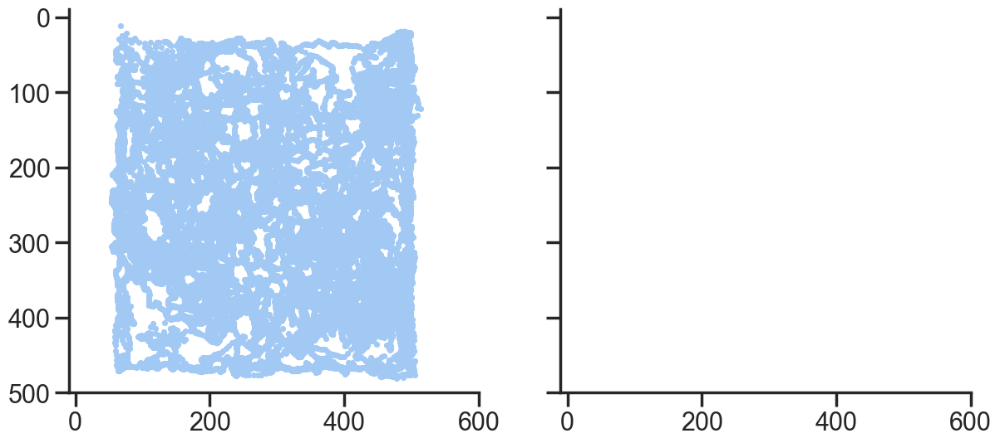

In [491]:
f, ax = plt.subplots(1, 2, figsize = (14, 6), sharex = True, sharey = True)
tmp = df_dlc_light
start_idx = 0
end_idx = 60000
# ax.plot(left_ear_x[start_idx:end_idx], left_ear_y[start_idx:end_idx])
# ax.plot(right_ear_x[start_idx:end_idx], right_ear_y[start_idx:end_idx])
ax[0].scatter(tmp.Implant.x[start_idx:end_idx], tmp.Implant.y[start_idx:end_idx], s = 10)
# ax.plot((right_ear_x[start_idx:end_idx] + left_ear_x[start_idx:end_idx])/2, 
#         (left_ear_y[start_idx:end_idx] + right_ear_y[start_idx:end_idx])/2)
if dark_flag > 0:    
    tmp = df_dlc_dark
    ax[1].scatter(tmp.Implant.x[start_idx:end_idx], tmp.Implant.y[start_idx:end_idx], s = 10)
ax[0].set_xlim(-10, 600)
ax[0].set_ylim(500, -10)
sns.despine()

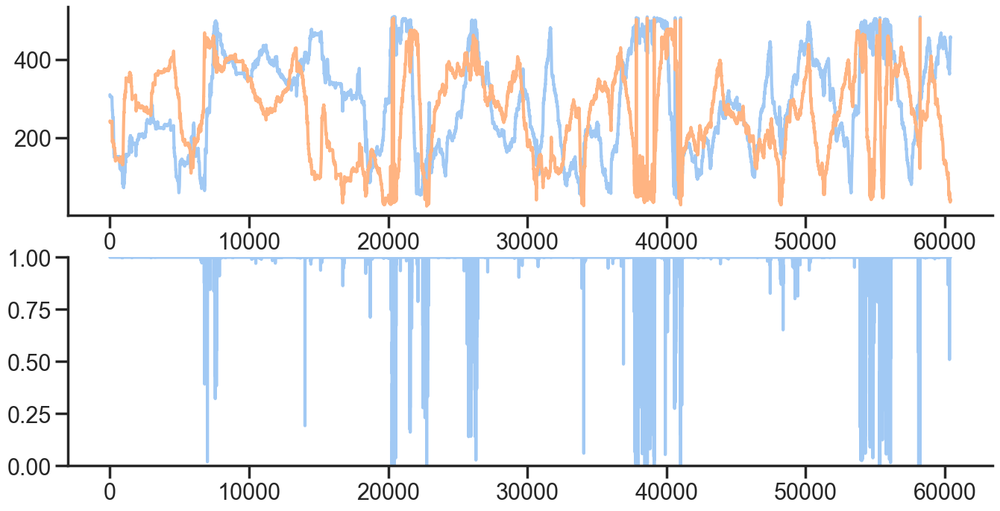

In [492]:
f, ax = plt.subplots(2, figsize = (16, 8))
ax[0].plot(tmp['LeftEar'].x)
ax[0].plot(tmp['LeftEar'].y)
ax[1].plot(tmp['LeftEar'].likelihood)
ax[1].set_ylim(0, 1)
sns.despine()

### remove bad frames

In [493]:
def get_bad_dlc_frames(df):
    # 1 remove frames with low likelihood
    # 2 large distance btw left and right ear
    # 3 large distance between tail and left/right ear
    outlier_idx_l = df[df['LeftEar'].likelihood < 0.9].index.values
    outlier_idx_r = df[df['RightEar'].likelihood < 0.9].index.values
    outlier_idx_tail = df[df['TailBase'].likelihood < 0.9].index.values

    
    outlier_lkl = np.union1d(outlier_idx_l, outlier_idx_r)

    dist_t_le = np.sqrt((df['TailBase'].x - df['LeftEar'].x)**2 + (df['TailBase'].y - df['LeftEar'].y)**2)
    dist_t_re = np.sqrt((df['TailBase'].x - df['RightEar'].x)**2 + (df['TailBase'].y - df['RightEar'].y)**2)
    # sns.distplot(dist_t_le)
    # sns.distplot(dist_t_re)
    print(np.median(dist_t_le), np.median(dist_t_re))
    # plt.xlim(0, 200)
    outlier_dist_t_le = dist_t_le[dist_t_le > 80].index.values
    outlier_dist_t_re = dist_t_re[dist_t_re > 80].index.values

    outlier_dist = np.union1d(outlier_dist_t_le, outlier_dist_t_re)
    outlier_all = np.union1d(outlier_lkl, outlier_dist)
    print(outlier_all.size, outlier_idx_tail.size)
    return outlier_all, outlier_idx_tail

In [494]:
def populate_meta_info(df_meta):
    df_meta.columns = ['ts', 'b', 'ttl', 'frameN']
    df_meta['ttl'] = df_meta['ttl']//8e8
    df_meta['frameN'] = df_meta.frameN - df_meta.iloc[0].frameN
    df_meta['t'] = df_meta.frameN * 0.02
    return df_meta

In [495]:
def nan_helper(y):
    """Helper to handle indices and logical indices of NaNs.

    Input:
        - y, 1d numpy array with possible NaNs
    Output:
        - nans, logical indices of NaNs
        - index, a function, with signature indices= index(logical_indices),
          to convert logical indices of NaNs to 'equivalent' indices
    Example:
        >>> # linear interpolation of NaNs
        >>> nans, x= nan_helper(y)
        >>> y[nans]= np.interp(x(nans), x(~nans), y[~nans])
    """

    return np.isnan(y), lambda z: z.nonzero()[0]


In [496]:
offset_x = 100
offset_y = 20

def get_hd_ahv(df, offset_x, offset_y):
    dt = 0.02
    tmp = df

    left_ear_x = tmp['LeftEar'].x.values - offset_x
    nans, nanx = nan_helper(left_ear_x)
    left_ear_x[nans] = np.interp(nanx(nans), nanx(~nans), left_ear_x[~nans])
    left_ear_x_sm = savgol_filter(left_ear_x, window_length=31, polyorder=2)

    left_ear_y = tmp['LeftEar'].y.values - offset_y
    nans, nanx = nan_helper(left_ear_y)
    left_ear_y[nans] = np.interp(nanx(nans), nanx(~nans), left_ear_y[~nans])
    left_ear_y_sm = savgol_filter(left_ear_y, window_length=31, polyorder=2)

    right_ear_x = tmp['RightEar'].x.values - offset_x
    nans, nanx = nan_helper(right_ear_x)
    right_ear_x[nans] = np.interp(nanx(nans), nanx(~nans), right_ear_x[~nans])
    right_ear_x_sm = savgol_filter(right_ear_x, window_length=31, polyorder=2)

    right_ear_y = tmp['RightEar'].y.values - offset_y
    nans, nanx = nan_helper(right_ear_y)
    right_ear_y[nans] = np.interp(nanx(nans), nanx(~nans), right_ear_y[~nans])
    right_ear_y_sm = savgol_filter(right_ear_y, window_length=31, polyorder=2)

    tailbase_x = tmp['TailBase'].x.values - offset_x
    nans, nanx = nan_helper(tailbase_x)
    tailbase_x[nans] = np.interp(nanx(nans), nanx(~nans), tailbase_x[~nans])

    tailbase_y = tmp['TailBase'].y.values - offset_y
    nans, nanx = nan_helper(tailbase_y)
    tailbase_y[nans] = np.interp(nanx(nans), nanx(~nans), tailbase_y[~nans])
    time_x = np.linspace(0, tailbase_x.size/50, tailbase_x.size)

    xx = left_ear_x - right_ear_x
    yy = left_ear_y - right_ear_y
    # get angle btw two points, y should be first
    ang_clw = np.arctan2(yy, xx)*180/np.pi
    ang_clw = (ang_clw + 180)
    yaw_rad = np.deg2rad(ang_clw)
    yaw_rad = np.unwrap(yaw_rad)    
    
    yaw_raw = np.rad2deg(yaw_rad)
    yaw_raw = yaw_raw%360
    # yaw_sm_lowess = lowess(yaw_rad, time_x, frac=np.round(30/time_x.size, 5))[:,1]
    # yaw_sm_lowess = np.rad2deg(yaw_sm_lowess)
    # yaw_sm_lowess = yaw_sm_filt%360
    yaw_sm_savgol = savgol_filter(yaw_rad, window_length=31, polyorder=2)
    yaw_sm_savgol = np.rad2deg(yaw_sm_savgol)
    yaw_sm_savgol = yaw_sm_savgol%360

    # correct way is = ang_clw = np.arctan2(yy, xx)*180/np.pi
    # make clw rotation +, and ccw -
    # fn - fn-1 gradient -> high freq noise
    ang_delta = np.gradient(yaw_sm_savgol)
    # wrap angles differences larger than 90 deg

    ang_delta[ang_delta < -180] = ang_delta[ang_delta < -180] + 360
    ang_delta[ang_delta > 180] = ang_delta[ang_delta > 180] - 360
    ahv = ang_delta*50
    # remove high freq noise due to the fn - fn - 1 gradient
    # ahv_sm = savgol_filter(ahv, window_length=31, polyorder=2)
    ahv_sm = lowess(ahv, time_x, frac=0.001)[:, 1]
    # append to macth the length
    ahv_delta = np.gradient(ahv_sm)
    ah_acc = ahv_delta*50
    # ah_acc_sm = savgol_filter(ah_acc, window_length=31, polyorder=2)
    ah_acc_sm = lowess(ah_acc, time_x, frac=0.001)[:, 1]

    ahv_sm[(ahv_sm > 400) | (ahv_sm < -400)] = 0
    ah_acc_sm[(ah_acc_sm > 1000) | (ah_acc_sm < -1000)] = 0

    tailbase_x_filt = savgol_filter(tailbase_x, window_length=31, polyorder=2)
    tailbase_y_filt = savgol_filter(tailbase_y, window_length=31, polyorder=2)

    # pix to m/s, 50cm = 460pix, 50/460 = 0.1087
    mid_ear_x, mid_ear_y  = (left_ear_x_sm + right_ear_x_sm + tailbase_x_filt)/3, (left_ear_y_sm + right_ear_y_sm + tailbase_y_filt)/3
    ear_dxy = np.gradient([mid_ear_x, mid_ear_y], axis = 1)
    ear_dx = ear_dxy[0]
    ear_dy = ear_dxy[1]

    ear_dx = ear_dx*np.sin(np.deg2rad(yaw_sm_savgol[:]))
    ear_dy = ear_dy*np.cos(np.deg2rad(yaw_sm_savgol[:]))
    ear_lin_vel = np.sqrt(ear_dx**2 + ear_dy**2)*0.1087*50
    # ear_lin_vel_sm = savgol_filter(ear_lin_vel, window_length=31, polyorder=2)
    # ear_lin_vel_sm = lowess(ear_lin_vel, time_x, frac=0.001)[:, 1]
    ear_lin_vel_sm = savgol_filter(ear_lin_vel, window_length=31, polyorder=2)

    ear_lin_acc = np.gradient(ear_lin_vel_sm)*50
    # ear_lin_acc_sm = lowess(ear_lin_acc, time_x, frac=0.001)[:, 1]
    ear_lin_acc_sm = savgol_filter(ear_lin_acc, window_length=31, polyorder=2)
    # speed from tail base
    # tailbase_x_filt = lowess(tailbase_x, time_x, frac=0.001)[:, 1]
    # tailbase_y_filt = lowess(tailbase_y, time_x, frac=0.001)[:, 1]


    dxy = np.gradient([tailbase_x_filt, tailbase_y_filt], axis = 1)
    dx = dxy[0]
    dy = dxy[1]

    dx = dx*np.sin(np.deg2rad(yaw_sm_savgol[:]))
    dy = dy*np.cos(np.deg2rad(yaw_sm_savgol[:]))

    lin_vel = np.sqrt(dx**2 + dy**2)*0.1087*50
    lin_vel_sm = savgol_filter(lin_vel, window_length=31, polyorder=2)
    # lin_vel_sm = lowess(lin_vel, time_x, frac=0.001)[:, 1]

    lin_acc = np.gradient(lin_vel_sm)*50
    lin_acc_sm = savgol_filter(lin_acc, window_length=31, polyorder=2)
    # lin_acc_sm = lowess(lin_acc, time_x, frac=0.001)[:, 1]

    lin_vel_sm[(lin_vel_sm > 100) | (lin_vel_sm < -100)] = 0
    lin_acc_sm[(lin_acc_sm > 400) | (lin_acc_sm < -400)] = 0
    
    df = pd.DataFrame({'hd': yaw_sm_savgol, 'az_raw': yaw_raw, 'ahv': ahv_sm, 'ah_acc':ah_acc_sm, 'lin_vel' : ear_lin_vel_sm, 
                       'lin_acc': ear_lin_acc_sm, 'posX': mid_ear_x, 'posY': mid_ear_y, 'time_x':time_x,
                      'left_ear_x':left_ear_x, 'left_ear_y': left_ear_y, 'right_ear_x':right_ear_x,  
                      'right_ear_y':right_ear_y, 'tailbase_x': tailbase_x, 'tailbase_y': tailbase_y}, index = tmp.index)

    
    return df


In [497]:
df_dlc_light_clean

bodyparts     LeftEar                           RightEar              \
coords              x           y likelihood           x           y   
0          284.182922  378.409180   1.000000  273.522095  362.840088   
1          283.765198  378.500885   1.000000  274.128357  362.037628   
2          282.689026  378.235413   0.999999  273.814301  361.479462   
3          281.964172  378.168304   0.999997  273.569275  361.456116   
4          282.109802  377.748047   0.999998  273.720337  361.410675   
...               ...         ...        ...         ...         ...   
60412       97.019318   75.087372   0.907940  118.235092  101.444000   
60413             NaN         NaN        NaN         NaN         NaN   
60414             NaN         NaN        NaN         NaN         NaN   
60415             NaN         NaN        NaN         NaN         NaN   
60416             NaN         NaN        NaN         NaN         NaN   

bodyparts                Implant                           TailBase  \
coords    likelihood           x           y likelihood           x   
0           1.000000  262.394745  381.345062        1.0  314.842407   
1           1.000000  262.616241  381.078033        1.0  314.439819   
2           1.000000  261.963165  380.657562        1.0  315.763031   
3           1.000000  261.399872  380.334320        1.0  316.121399   
4           1.000000  261.159393  379.781067        1.0  316.277618   
...              ...         ...         ...        ...         ...   
60412       0.977172  138.303925  104.328644        NaN         NaN   
60413            NaN  138.711517  103.904274        NaN         NaN   
60414            NaN  137.946991  101.953835        NaN         NaN   
60415            NaN  138.348602  100.852852        NaN         NaN   
60416            NaN  136.538422   98.916748        NaN         NaN   

bodyparts                        session  
coords              y likelihood          
0          363.722839   0.999993   light  
1          365.290253   0.999997   light  
2          364.763306   0.999999   light  
3          362.875519   1.000000   light  
4          362.467438   1.000000   light  
...               ...        ...     ...  
60412             NaN        NaN   light  
60413             NaN        NaN   light  
60414             NaN        NaN   light  
60415             NaN        NaN   light  
60416             NaN        NaN   light  

[60417 rows x 13 columns]

In [498]:
print(df_dlc_light.shape)
df_dlc_light_clean = df_dlc_light
outlier_ears, outlier_tail = get_bad_dlc_frames(df_dlc_light)
df_dlc_light_clean.iloc[outlier_ears, :6] = np.nan
df_dlc_light_clean.iloc[outlier_tail, 8:-1] = np.nan

if dark_flag > 0:
    df_dlc_dark_clean = df_dlc_dark
    outlier_ears, outlier_tail = get_bad_dlc_frames(df_dlc_dark)
    df_dlc_dark_clean.iloc[outlier_ears, :6] = np.nan
    df_dlc_light_clean.iloc[outlier_tail, 8:-1] = np.nan

(60417, 13)
39.74901462392803 37.40608236393865
2401 5248


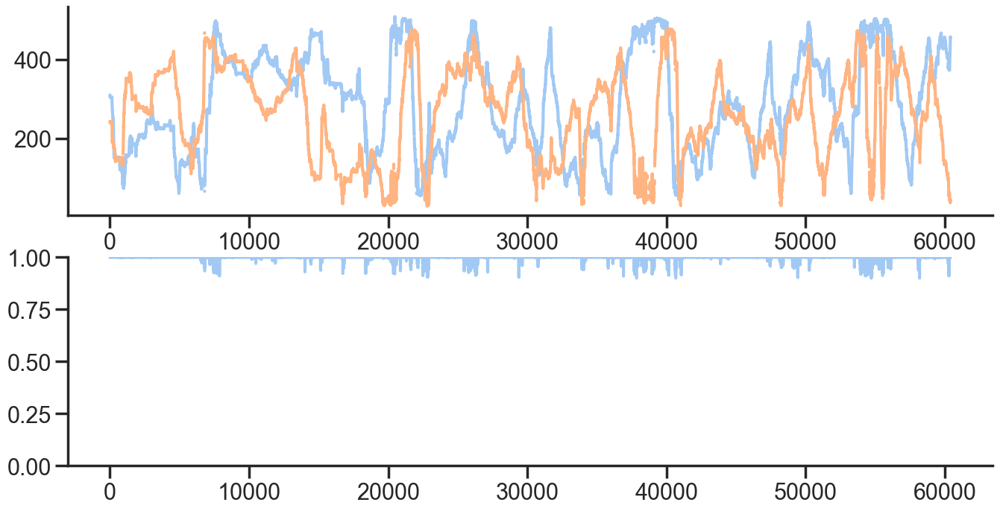

In [499]:
f, ax = plt.subplots(2, figsize = (16, 8))
tmp = df_dlc_light_clean
ax[0].plot(tmp['LeftEar'].x)
ax[0].plot(tmp['LeftEar'].y)
ax[1].plot(tmp['LeftEar'].likelihood)
ax[1].set_ylim(0, 1)
sns.despine()

### Open video and convert pix2cm

In [500]:
ls_frames = []

cap = cv.VideoCapture(str(path_vid_light))
i = 0
while cap.isOpened():
    ret, frame = cap.read()
    
    # if frame is read correctly ret is True
    if not ret:
        print("Can't receive frame (stream end?). Exiting ...")
        break
    gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
    ls_frames.append(gray)
#     if i not in outlier_all:
    cv.imshow('frame', frame)
    if cv.waitKey(1) == ord('q'):
        break
    if i > 50:
        break
    i+=1
cap.release()
cv.destroyAllWindows()

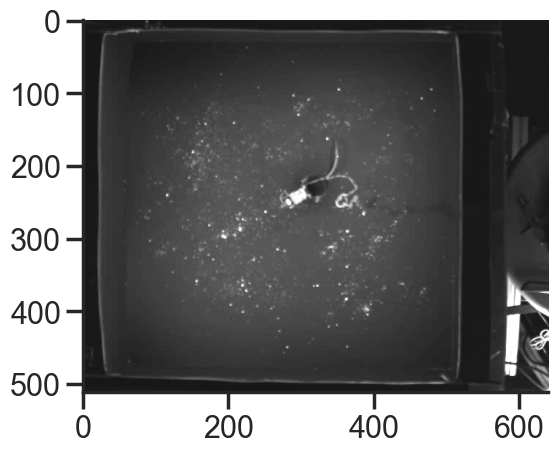

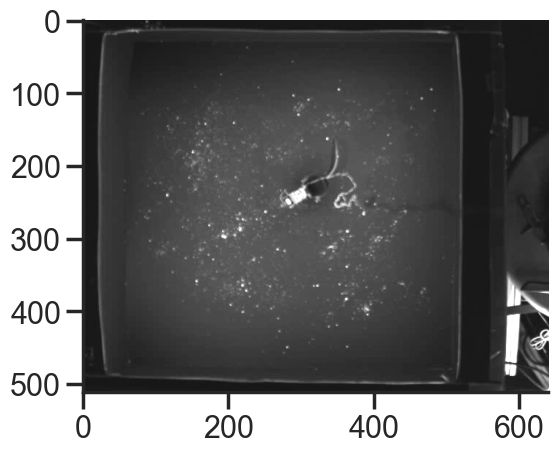

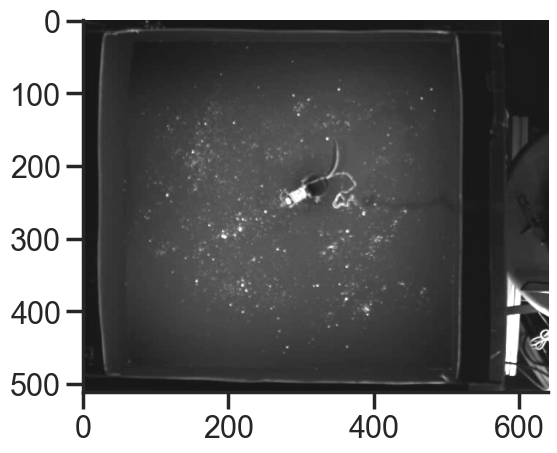

In [501]:
for i in ls_frames[:3]:
    f, ax = plt.subplots(figsize = (6, 6))
    plt.imshow(i, cmap = 'gray')
    plt.show()

In [502]:
gray.shape

(512, 640)

(512, 640)


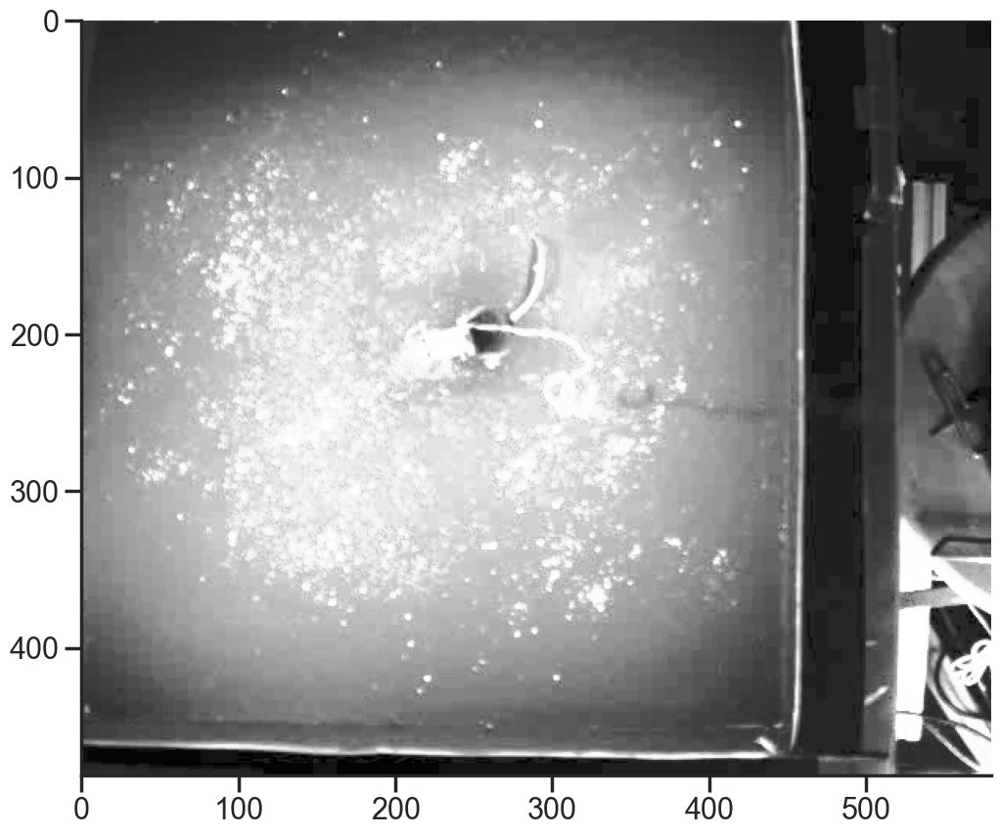

In [503]:
# 460 pix to 50 cm
tmp = cv.equalizeHist(gray)
f, ax = plt.subplots(figsize = (12, 12))
# print ('50 cm corespond to {} pix'.format(out[3] - out[1]))
print(tmp.shape)
offset_width = 60
offset_height = 30
plt.imshow(tmp[offset_height:, offset_width:], cmap = 'gray')

### Load camera meta data

In [504]:
df_cam_light = pd.read_csv(cam_meta_light_path, header=None)
df_cam_light = populate_meta_info(df_cam_light)
if dark_flag > 0:
    df_cam_dark = pd.read_csv(cam_meta_dark_path, header=None)
    df_cam_dark = populate_meta_info(df_cam_dark)

df_cam_light.head()

,ts,b,ttl,frameN,t
0,2023-05-12T16:35:26.2152192-04:00,3105208417,1.0,0,0.00
1,2023-05-12T16:35:26.2327168-04:00,3105862229,1.0,1,0.02
2,2023-05-12T16:35:26.2526592-04:00,3106515003,1.0,2,0.04
3,2023-05-12T16:35:26.2725632-04:00,3107168815,1.0,3,0.06
4,2023-05-12T16:35:26.2932736-04:00,3107821589,1.0,4,0.08


In [505]:
df_dlc_light_proc = get_hd_ahv(df_dlc_light_clean, offset_x = offset_width, offset_y = offset_height)

if dark_flag > 0:
    df_dlc_dark_proc = get_hd_ahv(df_dlc_dark_clean, offset_x = offset_width, offset_y = offset_height)

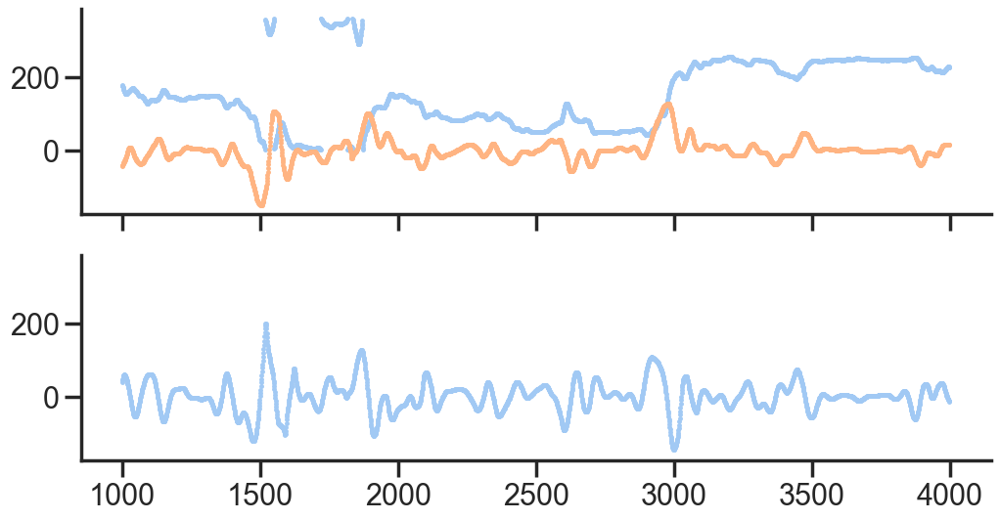

In [506]:
f, ax = plt.subplots(2, figsize = (12, 6), sharex = True, sharey = True)
data = df_dlc_light_proc

ax[0].plot(data['hd'][1000:4000], '.', markersize = 5)
ax[0].plot(data['ahv'][1000:4000], '.', markersize = 5)
ax[1].plot(data['ah_acc'][1000:4000], '.', markersize = 5)
# ax[1].plot(yaw_sm_savgol[1000:4000], '.', markersize = 5)

# plt.ylim(0, 360)
# print(ang_clw[:50])

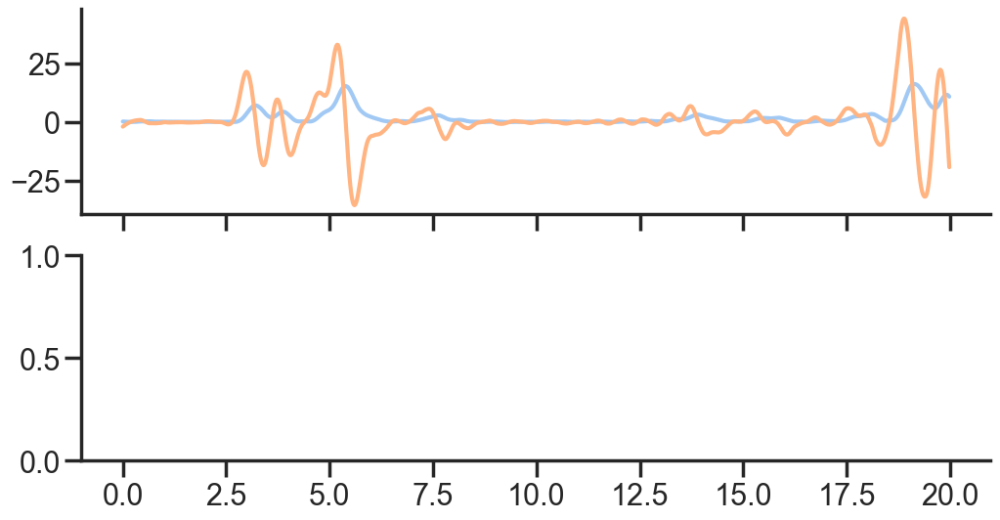

In [507]:
f, ax = plt.subplots(2, figsize = (12, 6), sharex = True, sharey = False)
st, end = 0, 1000
data = df_dlc_light_proc
time_x = data.time_x
# ax[0].plot(time_x[st:end], lin_vel[st:end], '-', markersize = 5)
ax[0].plot(time_x[st:end], data['lin_vel'][st:end], '-', markersize = 5)
ax[0].plot(time_x[st:end], data['lin_acc'][st:end], '-', markersize = 5)

# ax[1].plot(time_x[st:end], lin_acc[st:end], '-', markersize = 5)
# ax[0].plot(time_x[st:end], lin_acc_sm[st:end], '-', markersize = 5)
# ax[1].plot(time_x[st:end], ear_lin_acc_sm[st:end], '-', markersize = 5)

# ax[0].set_ylim(0, 50)

C:\Users\lab\AppData\Local\Temp\ipykernel_11688\333696008.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(tmp.hd.values, ax = ax[1])


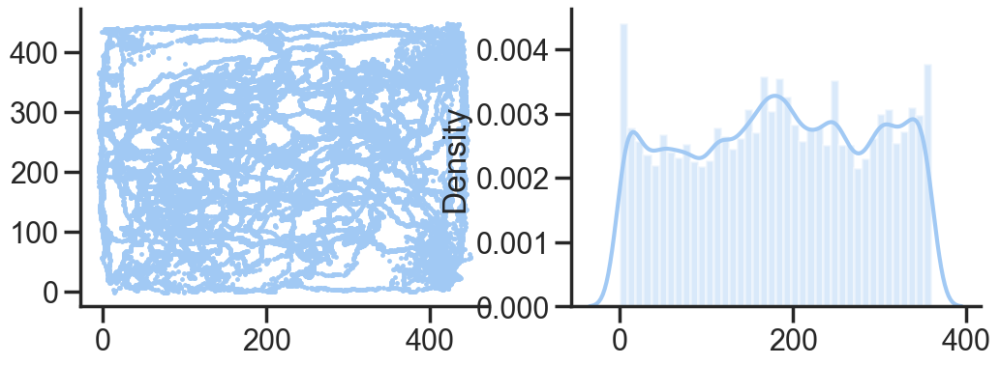

In [508]:
f, ax = plt.subplots(1, 2, figsize = (12, 4))
tmp = df_dlc_light_proc
start_idx = 0
end_idx = 60000
# ax.plot(left_ear_x[start_idx:end_idx], left_ear_y[start_idx:end_idx])
# ax.plot(right_ear_x[start_idx:end_idx], right_ear_y[start_idx:end_idx])
ax[0].plot(tmp.left_ear_x[start_idx:end_idx], tmp.left_ear_y[start_idx:end_idx], '.', markersize = 5)
sns.distplot(tmp.hd.values, ax = ax[1])
# ax.plot((right_ear_x[start_idx:end_idx] + left_ear_x[start_idx:end_idx])/2, 
#         (left_ear_y[start_idx:end_idx] + right_ear_y[start_idx:end_idx])/2)
# ax[0].set_xlim(-10, 470)
# ax[0].set_ylim(-10, 470)
sns.despine()

In [509]:
cam_ttl_light = df_cam_light.ttl.values
df_dlc_light_proc.loc[:, 'ttl'] = cam_ttl_light[:df_dlc_light_proc.shape[0]]

if dark_flag > 0:
    cam_ttl_dark = df_cam_dark.ttl.values
    df_dlc_dark_proc.loc[:cam_ttl_dark.size-1, 'ttl'] = cam_ttl_dark[:df_dlc_dark_proc.shape[0]]

In [510]:
ttl_lfp.shape

(60948,)

In [511]:
try:
    ttl_arena = (ttl_lfp_50hz[:np.sum(ls_samples[:1])])
    ttl_arena = (ttl_arena > 30).astype(int)
except: 
    ttl_arena = ttl_lfp_50hz[:]
    ttl_arena = (ttl_arena > 30).astype(int)
# ttl_arena = np.clip(ttl_arena, 0, 1)
print( ttl_arena.min(), ttl_arena.max())
# ttl_lfp = ttl_lfp//ttl_max
print(ttl_arena.size)

0 1
60948


In [512]:
print(ttl_arena.size/50/60)

20.316


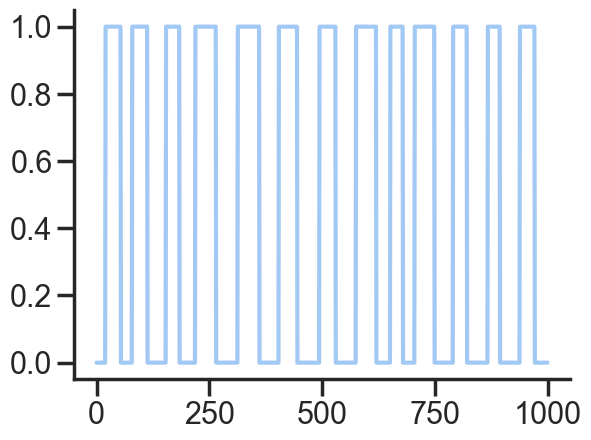

In [513]:
plt.plot(cam_ttl_light[5000:6000])

In [514]:
print(ttl_arena.size, cam_ttl_light.size)

60948 60417


#### Find rec offset

light (49, 0.4556)


(0.0, 0.5)

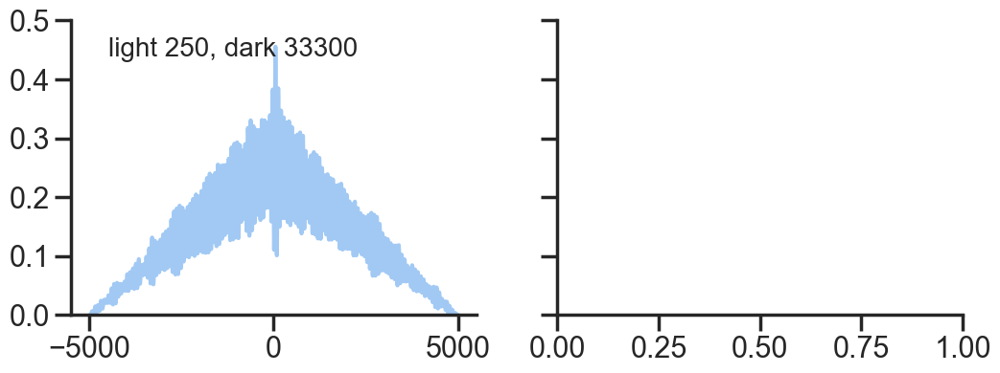

In [515]:
f, ax = plt.subplots(1,  2, figsize = (12, 4), sharey = True)
n_samples = 5000
# change this number
start_offset_light = 250
start_offset_dark = 33300

cam_offset_light = 0
lags = np.arange(-n_samples + 1, n_samples)

y1_light = ttl_arena[start_offset_light:n_samples + start_offset_light]
y2_light = cam_ttl_light[cam_offset_light:n_samples + cam_offset_light]
# y2 = df_unity.TTL.values[:n_samples]
# where_are_NaNs = np.isnan(y2)
# y2[where_are_NaNs] = 0
ccov_light = np.correlate(y1_light, y2_light, mode='full')
ccov_light = ccov_light / n_samples
shift_idx_light = (ccov_light.argmax() - n_samples)
print(f'light {shift_idx_light, ccov_light.max()}')
ax[0].plot(lags, ccov_light)

if dark_flag > 0:
    y1_dark = ttl_arena[start_offset_dark:n_samples + start_offset_dark]
    y2_dark = cam_ttl_dark[:n_samples]
    ccov_dark = np.correlate(y1_dark, y2_dark, mode='full')
    ccov_dark = ccov_dark / n_samples
    shift_idx_dark = (ccov_dark.argmax() - n_samples)
    print(f'dark {shift_idx_dark, ccov_dark.max()}')
    ax[1].plot(lags, ccov_dark)

ax[0].text(0.4, 0.9, f'light {start_offset_light}, dark {start_offset_dark}', 
        horizontalalignment='center', verticalalignment='center', transform=ax[0].transAxes, size = 20)

ax[0].set_ylim(0, 0.5)

In [516]:
def get_block_offset(ttl_lfp, cam_ttl, start_offset, n_slices):
    print(ttl_lfp.size, cam_ttl.size)
    d_align = {}
    # downsample ephys from LFP 2500/ spikes 30 000 to 50 Hz
    # if spikes
    # ephys_samples_dwn = digArray[0][::600]
    # if LFP
    ephys_ttl = ttl_lfp
#     cam_ttl = cam_ttl_dark
#     start_offset = 26450
    # unity starts after ephys recording
    # subtract those 9s to spikes data
    n_samples = 1000
    # how many slices, every 5s
#     n_slices = ephys_ttl[:].size//50//5 - 10
#     n_slices = 93

    for i in range(n_slices):
        # align every 5s with ccor of 20s
        start_idx = i*5*50

        lags = np.arange(-n_samples + 1, n_samples)
        y1 = ephys_ttl[start_offset + start_idx: start_offset + start_idx + n_samples]
        y2 = cam_ttl[start_idx :n_samples + start_idx]

    #     where_are_NaNs = np.isnan(y2)
    #     y2[where_are_NaNs] = 0
        ccov = np.correlate(y1, y2, mode='full')
        ccor = ccov / n_samples
    #     plt.plot(lags, ccor)
        shift_idx = (ccor.argmax() - n_samples)
        if (i == 0):
            prev_shift_idx = shift_idx
        # usually it gives error at the end of the exp
        # when there is less 100 ssamples to do ccor
#         if abs(shift_idx - prev_shift_idx) > 10:
#             print(abs(shift_idx - prev_shift_idx))
#             print(f'stop at slice {i} at {(i+1)*5}s max corr {ccor.max()} shift {shift_idx + 2} samples')
#             break
        # for some reason shifting by 2 improves alignment
        d_align[(i+1)*5] = shift_idx + 2

        prev_shift_idx = shift_idx
        print(f'slice {i} at {(i+1)*5}s max corr \t{ccor.max()} shift \t{shift_idx + 2} samples')
        # take ephys data 65*500 (sec) samples
    return d_align

In [517]:
def align_blocks(df, d_align):
    ls_aligned_blocks = []

    for key, val in d_align.items():
    #     print(key, val)
        # 100 samples that were removed at the beginning
        start =  key*50 - val
        tmp = df.iloc[start: start + 5*50]
        ls_aligned_blocks.append(tmp)

    df2 = pd.concat(ls_aligned_blocks)
    print(df2.shape)
    return df2

In [518]:
d_align_light = 0
d_align_light = get_block_offset(ttl_arena[:], cam_ttl_light[cam_offset_light:], start_offset_light, 235)
df_dlc_light_aln = align_blocks(df_dlc_light_proc, d_align_light)

if dark_flag> 0:
    d_align_dark = 0
    d_align_dark = get_block_offset(ttl_arena, cam_ttl_dark, start_offset_dark, 93)
    df_dlc_dark_aln = align_blocks(df_dlc_dark_proc, d_align_dark)


60948 60417
slice 0 at 5s max corr 	0.484 shift 	57 samples
slice 1 at 10s max corr 	0.482 shift 	56 samples
slice 2 at 15s max corr 	0.464 shift 	55 samples
slice 3 at 20s max corr 	0.485 shift 	55 samples
slice 4 at 25s max corr 	0.465 shift 	54 samples
slice 5 at 30s max corr 	0.478 shift 	53 samples
slice 6 at 35s max corr 	0.482 shift 	52 samples
slice 7 at 40s max corr 	0.474 shift 	52 samples
slice 8 at 45s max corr 	0.469 shift 	51 samples
slice 9 at 50s max corr 	0.497 shift 	50 samples
slice 10 at 55s max corr 	0.484 shift 	49 samples
slice 11 at 60s max corr 	0.494 shift 	49 samples
slice 12 at 65s max corr 	0.507 shift 	48 samples
slice 13 at 70s max corr 	0.469 shift 	47 samples
slice 14 at 75s max corr 	0.496 shift 	46 samples
slice 15 at 80s max corr 	0.488 shift 	45 samples
slice 16 at 85s max corr 	0.462 shift 	44 samples
slice 17 at 90s max corr 	0.48 shift 	44 samples
slice 18 at 95s max corr 	0.491 shift 	43 samples
slice 19 at 100s max corr 	0.457 shift 	42 samples

(58750, 16)


net ephys start offset is 10.0s


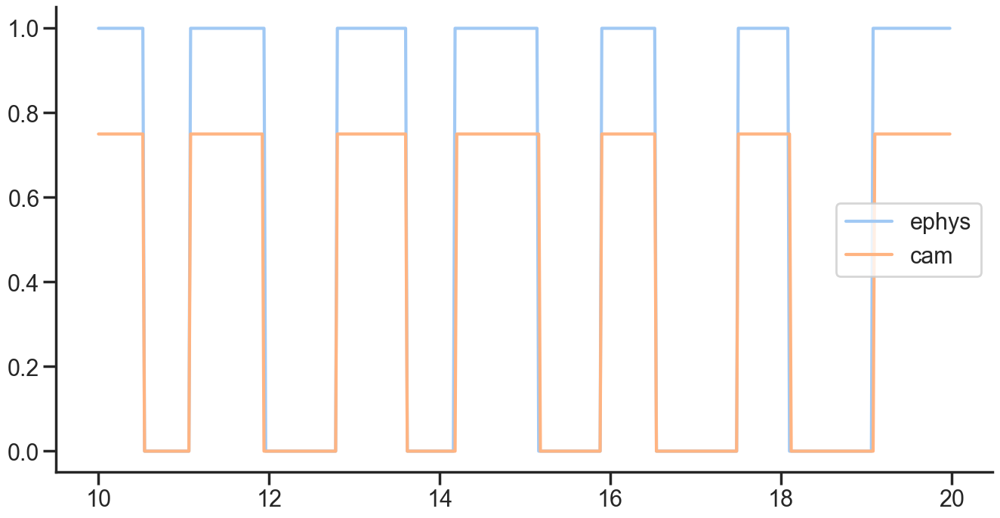

In [519]:
f, ax = plt.subplots(1, figsize = (16,8))
start = 10
end = 20
# start offset + first 5s for cross corr
y1 = ttl_arena[start_offset_light  + 5*50 + start*50 : start_offset_light  + 5*50 + end*50]
y2 = df_dlc_light_aln.iloc[start*50: end*50].ttl*0.75
# if positive lag
# y2 = np.insert(y2,0, [0]*41)

t = np.arange(start, end, 0.02)
plt.plot(t, y1, label = 'ephys')
plt.plot(t, y2, label = 'cam')
plt.legend()
print(f'net ephys start offset is {(start_offset_light + 5*50)/50}s')

NameError: name 'df_dlc_dark_aln' is not defined

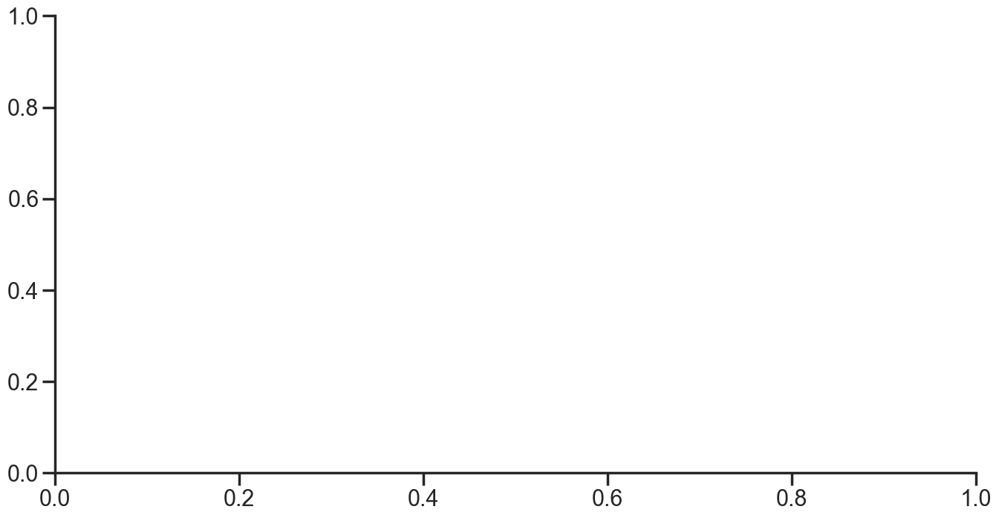

In [520]:
f, ax = plt.subplots(1, figsize = (16,8))
start = 22
end = 32
# start offset + first 5s for cross corr
y1 = ttl_arena[start_offset_dark + 5*50 + start*50 : start_offset_dark + 5*50 + end*50]
y2 = df_dlc_dark_aln.iloc[start*50: end*50].ttl*0.75
# if positive lag
# y2 = np.insert(y2,0, [0]*41)

t = np.arange(start, end, 0.02)
plt.plot(t, y1, label = 'ephys')
plt.plot(t, y2, label = 'cam')
plt.legend()
print(f'net ephys start offset is {(start_offset_light + 5*50)/50}s')

In [ ]:
print(f'unity_offset {start_offset_light}, start_offset {start_offset_dark}, conc_offset {ls_samples[0]}')

### Arena: remove offset from spikes 
start_offset -> ephys offset  
unity_ offset -> (usually 0 because we start ephys first)  
conc_offset -> start of each block

In [526]:
duration = df_dlc_light_aln.shape[0]//50
df_spk_l1 = df_spikes.copy()
# subtract start offset and block offset in sec, cross corr offset is 15 sec
df_spk_l1['spk'] = df_spk_l1['times'] - (start_offset_light + 5*50)/50
# removes spikes
df_spk_l1 = df_spk_l1[(df_spk_l1['spk'] > 0)
                       & (df_spk_l1['spk'] < duration + 1)
                       ]
if dark_flag > 0:
    duration = df_dlc_dark_aln.shape[0]//50
    df_spk_d1 = df_spikes.copy()
    df_spk_d1['spk'] = df_spk_d1['times'] - (start_offset_dark + 5*50)/50
    # removes spikes
    df_spk_d1 = df_spk_d1[(df_spk_d1['spk'] > 0)
                           & (df_spk_d1['spk'] < duration + 1)
                           ]

    df_spk_d1.head()

In [527]:
print(df_spk_l1.shape, df_spk_d1.shape)

NameError: name 'df_spk_d1' is not defined

In [528]:
df_units_l1 = bin_smooth_spk(df_spk_l1, 0.02)
print(df_units_l1.shape)

if dark_flag > 0:
    df_units_d1 = bin_smooth_spk(df_spk_d1, 0.02)
    print(df_units_d1.shape)

(5762302, 3)


### Plot arena HD tuning curves

In [529]:
df_dlc_light_aln.head()

,hd,az_raw,ahv,ah_acc,lin_vel,lin_acc,posX,posY,time_x,left_ear_x,left_ear_y,right_ear_x,right_ear_y,tailbase_x,tailbase_y,ttl
193,302.910299,302.983739,-44.381676,-5.860829,4.394044,1.469747,215.516779,161.734561,3.860064,199.769562,161.648865,208.827911,147.691559,234.572144,177.687912,0.0
194,301.238880,301.945158,-44.399699,1.670338,4.414055,-0.841499,214.419787,161.351990,3.880064,198.490997,161.245026,207.516846,146.769836,234.127327,176.548172,0.0
195,299.602619,300.826888,-44.251048,8.910908,4.369171,-3.216070,213.335586,160.954058,3.900065,197.634552,161.100403,206.765747,145.799011,233.682510,175.408432,0.0
196,298.176102,298.519125,-43.917123,15.851914,4.247180,-5.538017,212.303770,160.545833,3.920065,196.783295,160.817917,204.932373,145.821121,233.237694,174.268692,0.0
197,296.981431,297.227386,-43.379990,22.496492,4.063029,-7.717166,211.337041,160.105436,3.940065,195.358749,160.487198,203.281738,145.088837,232.792877,173.128952,0.0


1 unit # 25 light: r 0.401 p 0.0


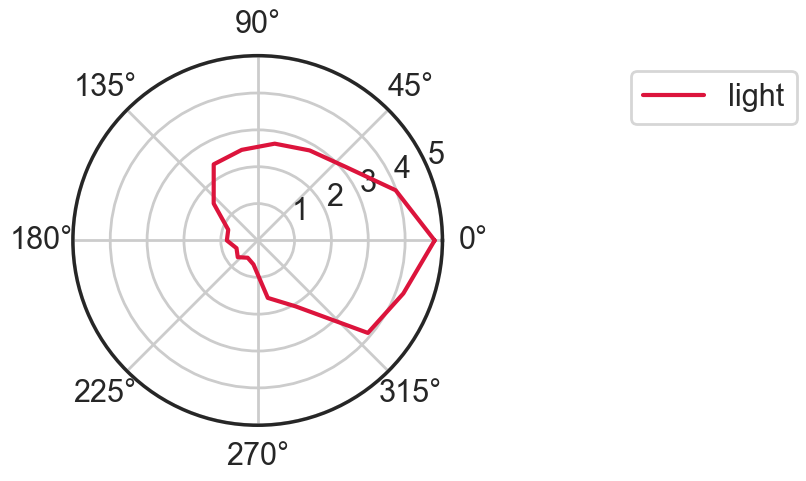

2 unit # 77 light: r 0.6129 p 0.001


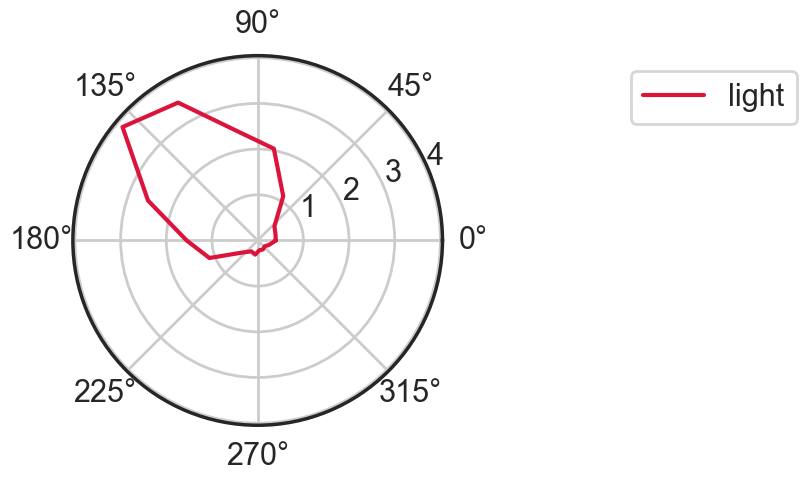

3 unit # 160 light: r 0.6184 p 0.0


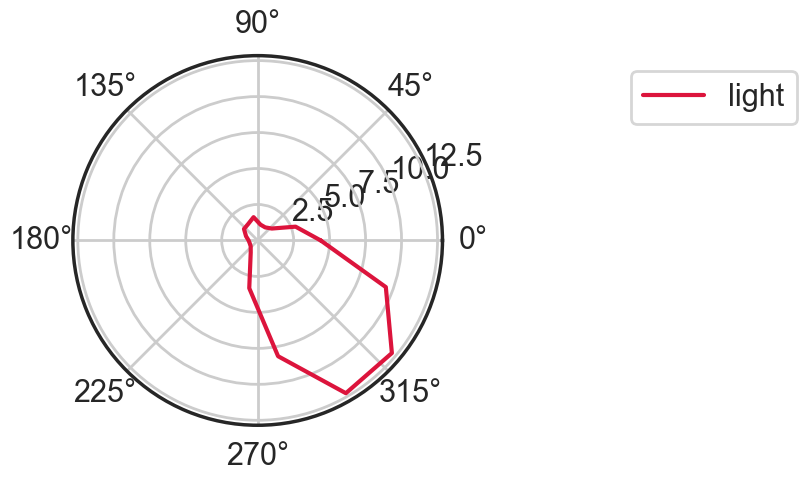

4 unit # 192 light: r 0.5851 p 0.0


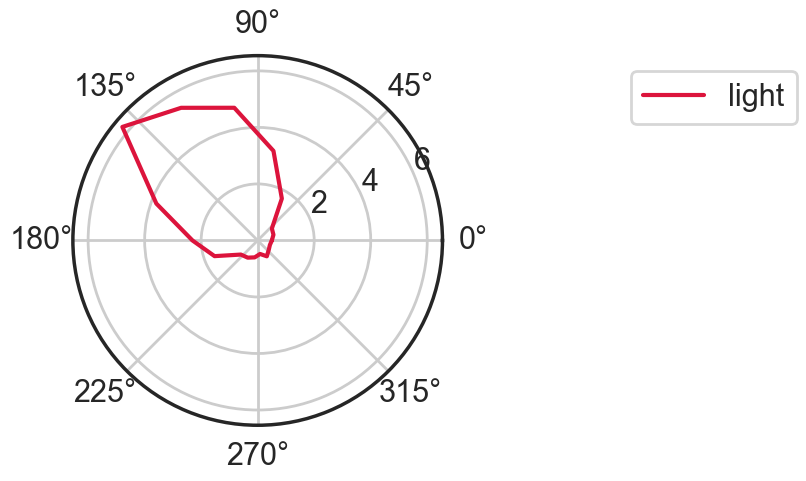

5 unit # 193 light: r 0.6678 p 0.0


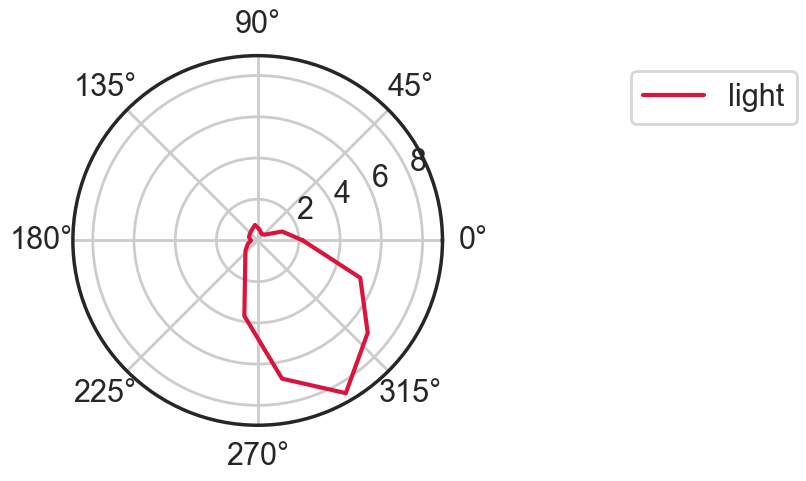

In [530]:
# light session
yaw_light = df_dlc_light_aln.az_raw.values
if dark_flag > 0:
    yaw_dark = df_dlc_dark_aln.az_raw.values
    print(yaw_light.size, yaw_dark.size)

i = 0
arena_hd = []
for unit in sorted(df_units_l1.cids.unique()):
    
    tmp_light = df_units_l1[df_units_l1.cids == unit].iloc[:yaw_light.size]
    if dark_flag > 0:
        tmp_dark = df_units_d1[df_units_d1.cids == unit].iloc[:yaw_dark.size]
    
    try:
        r_light, hd_tuning_light, p_val_light = bin_tuning_permute(yaw_light[:], tmp_light.hz.values)
        if dark_flag > 0:
            r_dark, hd_tuning_dark, p_val_dark = bin_tuning_permute(yaw_dark[:], tmp_dark.hz.values)
    except Exception as e:
        print(f'{e} error at {unit}')
        continue
        
    angles = hd_tuning_light[0]
    a = np.deg2rad(angles)
    a = np.append(a, a[0])
    
    fr_light = hd_tuning_light[1]
    fr_light = np.append(fr_light, fr_light[0])
    
    if dark_flag > 0:
        fr_dark =  hd_tuning_dark[1]
    if fr_light.max() < 1:
        continue
    if r_light > 0.3 and p_val_light < 0.05:
        ax = plt.subplot(111, projection='polar')
        i = i + 1
        print (f'{i} unit # {unit} light: r {r_light:.4} p {p_val_light}')
        if dark_flag > 0:
            print (f'{i} unit # {unit} dark: r {r_dark:.4} p {p_val_dark}')
            fr_dark = np.append(fr_dark, fr_dark[0])
            ax.plot(a, fr_dark, label = 'dark', c = 'gray')
        
    #         ax.set_theta_zero_location("N")
    #         ax.set_theta_direction(-1)
        
        ax.plot(a, fr_light, label = 'light', c = 'crimson')
        
        arena_hd.append(unit)
        ax.legend(loc='best', bbox_to_anchor=(1.5, 0.5, 0.5, 0.5))

    #     plt.scatter(xc, yc, c = tmp_light.hz.values, cmap = 'jet', s = 10)
    #     plt.colorbar()
        plt.show()
    
    #     except:
    #         continue


In [ ]:
# hd_cells = np.array((14, 19, 23, 33, 35, 36, 37, 45, 57, 60, 62, 63, 64, 117, 127, 154, 177, 178, 187, 191))
# _inp_l = df_units_l1[df_units_l1.cids.isin(arena_hd)].pivot('cids', 'times', 'hz').values[:, ::10]
_inp_l = df_units_l1.pivot('cids', 'times', 'hz').values[:, ::10]
Xl = np.sqrt(_inp_l.T)
print(Xl.shape)
embedding = Isomap(n_neighbors = 50, n_components=2)
tmp_emb_l = embedding.fit_transform(Xl)

# _inp_d = df_units_d1[df_units_d1.cids.isin(arena_hd)].pivot('cids', 'times', 'hz').values[:, ::10]
_inp_d = df_units_d1.pivot('cids', 'times', 'hz').values[:, ::10]

Xd = np.sqrt(_inp_d.T)
print(Xd.shape)
embedding = Isomap(n_neighbors = 50, n_components=2)
tmp_emb_d = embedding.fit_transform(Xd)

In [ ]:
f, ax = plt.subplots(1, 2, figsize = (12, 5), sharex = True, sharey = True)
nsamples = yaw_light[::10].size
p1 = ax[0].scatter(tmp_emb_l[:nsamples,0] , tmp_emb_l[:nsamples,1], c = yaw_light[::10], s = 10, cmap = 'hsv')
nsamples = yaw_dark[::10].size
p2 = ax[1].scatter(tmp_emb_d[:nsamples,0] , tmp_emb_d[:nsamples,1], c = yaw_dark[::10][:nsamples], s = 10, cmap = 'hsv')
#             ax[0].plot(x, y, alpha = 0.5)

cb_ax = f.add_axes([0.95, 0.1, 0.02, 0.8])
cbar = f.colorbar(p1, cax=cb_ax)

# plt.xlim(-15, 15)
# plt.ylim(-15, 15)

### Align LFP for arena

In [1246]:
df_spk_l1.times.max()

472.9999666666667

(116501, 385)


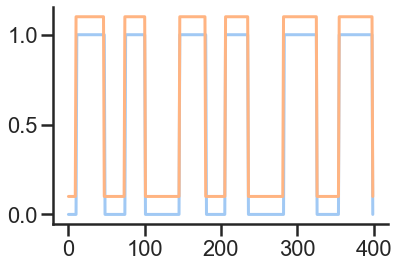

In [1247]:
#250 hz
lfp_start, lfp_end = round(df_spk_l1.times.min()*250 - 1), round(df_spk_l1.times.max()*250)
# 15s offset due to unity start slowly; convert 50 to 250 hz lfp
lfp_start = (start_offset_light + 5*50)*5 - 1
plt.plot(lfp_dwn[lfp_start : lfp_end, -1][::5][1500:1900]//60)
plt.plot(df_dlc_light_aln.ttl.values[1500:1900] + 0.1)

# adjust offset
lfp_out_l1 = lfp_dwn[lfp_start : lfp_end].copy()
# adjust the gain
# for all channels NP2.5
# gain_correct = 0.762939453125
lfp_out_l1 = lfp_out_l1 * gain_correct
print(lfp_out_l1.shape)

#### LFP for dark session

(116501, 385)


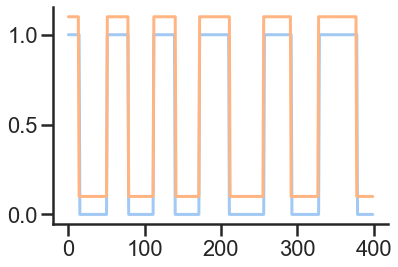

In [1248]:
#250 hz
lfp_start, lfp_end = round(df_spk_d1.times.min()*250 - 1), round(df_spk_d1.times.max()*250)
# 15s offset due to unity start slowly; convert 50 to 250 hz lfp
lfp_start = (start_offset_dark + 5*50)*5 - 1
plt.plot(lfp_dwn[lfp_start : lfp_end, -1][::5][1500:1900]//60)
plt.plot(df_dlc_dark_aln.ttl.values[1500:1900] + 0.1)

# adjust offset
lfp_out_d1 = lfp_dwn[lfp_start : lfp_end].copy()
# adjust the gain
# for all channels NP2.5
# gain_correct = 0.762939453125
lfp_out_d1 = lfp_out_d1 * gain_correct
print(lfp_out_d1.shape)

### Save arena .mat file

In [1249]:
df_dlc_light_aln.head()

,hd,ahv,tail_speed,left_ear_x,left_ear_y,right_ear_x,implant_x,implant_y,right_ear_y,tailbase_x,tailbase_y,ttl
146,214.726616,-199.480310,0.582338,117.810791,35.666965,130.084457,144.034988,19.268356,53.374809,91.505798,70.561226,1
147,223.373751,-24.359454,3.295099,116.372742,38.445908,129.645309,-1.647911,14.395000,52.494141,91.874619,71.042442,1
148,222.705829,-45.594290,0.891781,116.053146,38.091763,128.993515,-1.418564,14.330013,52.112244,91.885834,70.878738,1
149,224.348130,166.900076,0.600578,114.740417,38.448620,128.014954,-1.467491,14.122181,52.028702,91.799286,70.810028,1
150,224.529600,-195.923285,0.439924,113.453323,37.491562,126.777756,-1.920029,14.110043,51.036598,91.718536,70.815666,1


In [1250]:
mdic_l1 = {}
for col in df_dlc_light_aln.columns:
    mdic_l1[col] = df_dlc_light_aln[col].values
mdic_l1['spikes'] = np.array((df_spk_l1.unit_id.values, df_spk_l1.spk.values))
mdic_l1['lfp'] = lfp_out_l1
mdic_l1['depth'] = cid_depth
mdic_l1['channel'] = cid_channels
mdic_l1['templates'] = templates
mdic_l1['path_vid_light'] = str(path_vid_light)

In [1251]:
print(cam_meta_light_path)
print(path_vid_light)
print(path_vid_dark)

x:\Data\Mice\VR\Alex\DATA_CHRONIC\ATN\MC022\06_28_22\L1\MC022_h2_L12022-06-28T11_11_45.csv
x:\Data\Mice\VR\Alex\DATA_CHRONIC\ATN\MC022\06_28_22\L1\MC022_h2_L12022-06-28T11_11_46.avi
x:\Data\Mice\VR\Alex\DATA_CHRONIC\ATN\MC022\06_28_22\D1\MC022_h2_D12022-06-28T11_35_25.avi


In [1252]:
savemat("20220628_MC022_lADN_red_H2_R_L1.mat", mdic_l1)

In [1253]:
mdic_d1 = {}
for col in df_dlc_dark_aln.columns:
    mdic_d1[col] = df_dlc_dark_aln[col].values
mdic_d1['spikes'] = np.array((df_spk_d1.unit_id.values, df_spk_d1.spk.values))
mdic_d1['lfp'] = lfp_out_d1
mdic_d1['depth'] = cid_depth
mdic_d1['channel'] = cid_channels
mdic_d1['templates'] = templates
mdic_d1['path_vid_dark'] = str(path_vid_dark)

In [1254]:
mdic_d1.keys()

dict_keys(['hd', 'ahv', 'tail_speed', 'left_ear_x', 'left_ear_y', 'right_ear_x', 'implant_x', 'implant_y', 'right_ear_y', 'tailbase_x', 'tailbase_y', 'ttl', 'spikes', 'lfp', 'depth', 'channel', 'templates', 'path_vid_dark'])

In [1255]:
savemat("20220628_MC022_lADN_red_H2_R_D1.mat", mdic_d1)

### Plot spatial tuning

In [261]:
bin_size = 2.5 # cm
length_of_arena_x = 58
length_of_arena_y = 58
dt_position_ms = 20
min_dwell_distance = 5
min_dwell_time = 3
min_dwell_time_ms = min_dwell_time * dt_position_ms  # this is about 100 ms

number_of_bins_x = int(np.ceil(length_of_arena_x / bin_size))
number_of_bins_y = int(np.ceil(length_of_arena_y / bin_size))
smooth = 5 # / 100 * prm.get_pixel_ratio()

In [70]:
def gaussian_kernel(kernx):
    kerny = np.exp(np.power(kernx, 2)/2 * (-1))
    return kerny

In [71]:
df_spk_l1.head()

,times,unit_id,templates,kslabel,spk
9630,9.003500,86,86,good,0.003500
9631,9.003567,99,99,mua,0.003567
9632,9.004100,167,167,good,0.004100
9633,9.004533,175,175,good,0.004533
9634,9.004967,203,203,good,0.004967


In [72]:
number_of_bins_y

24

8


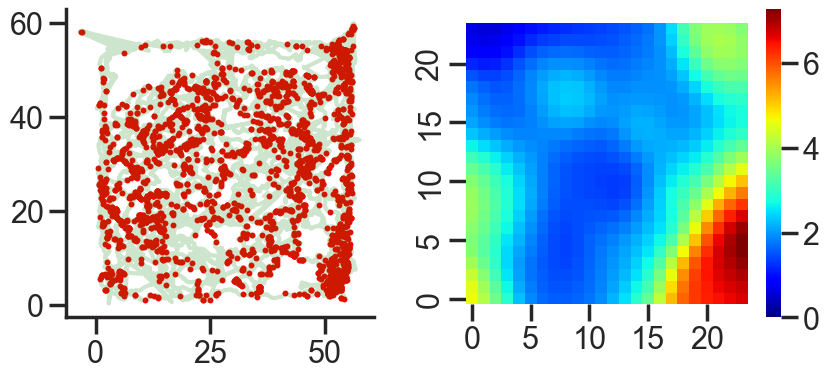

11


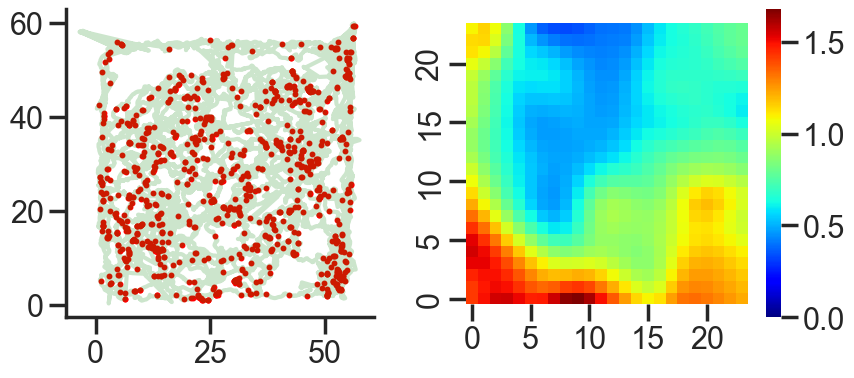

12


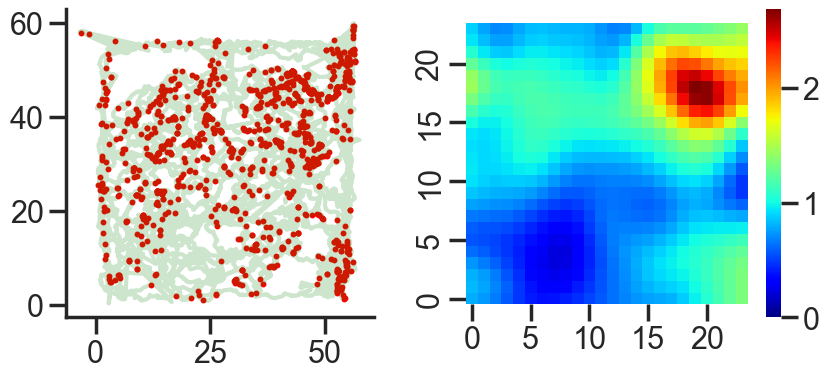

14


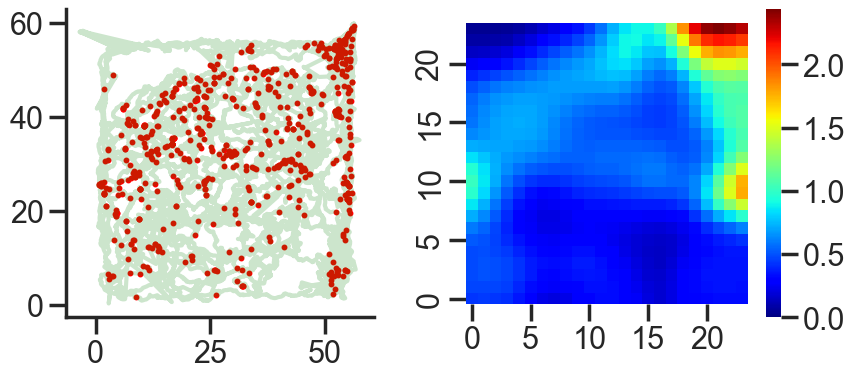

16


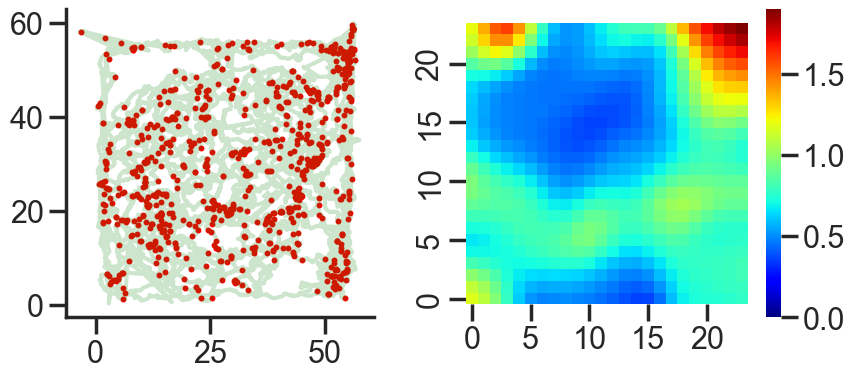

17


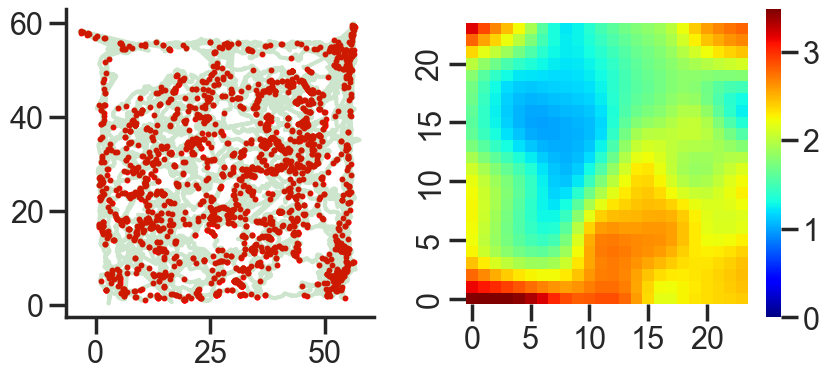

18


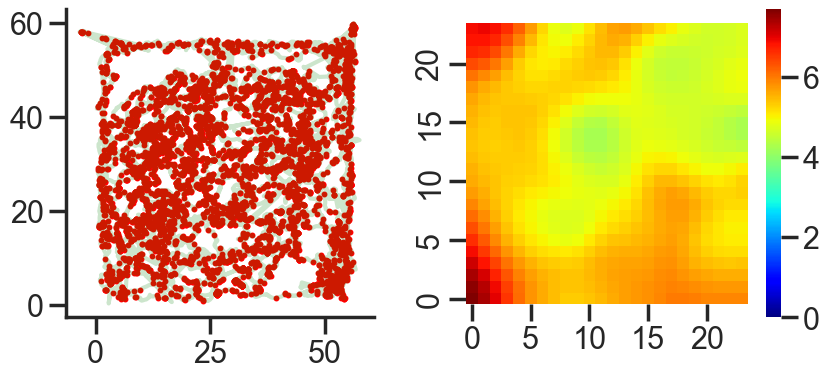

19


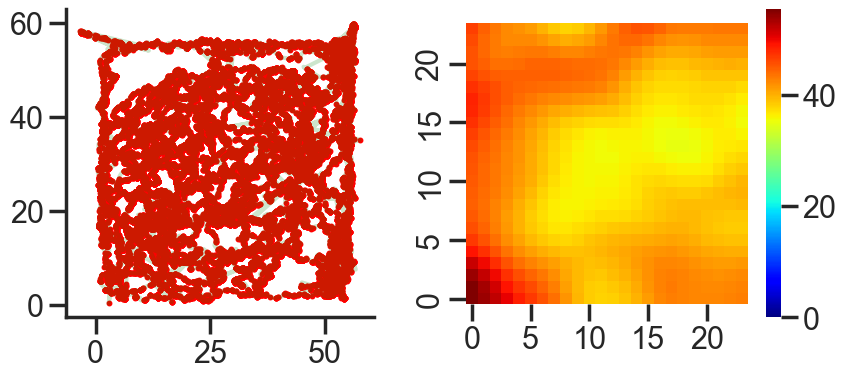

21


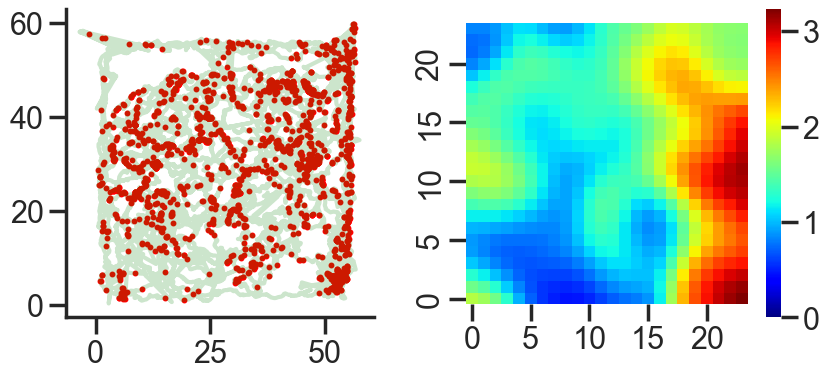

22


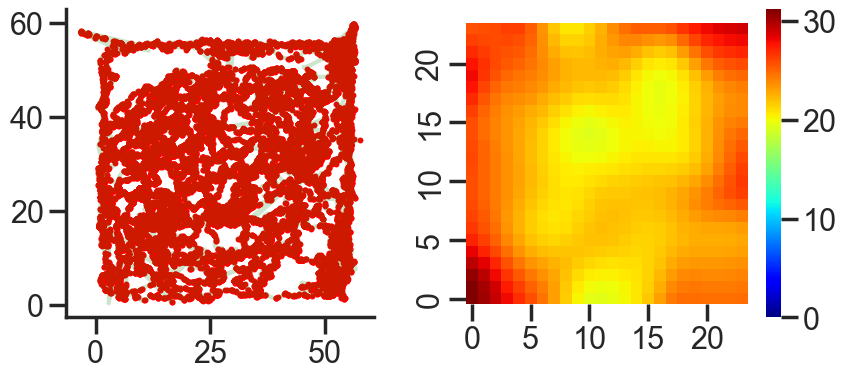

23


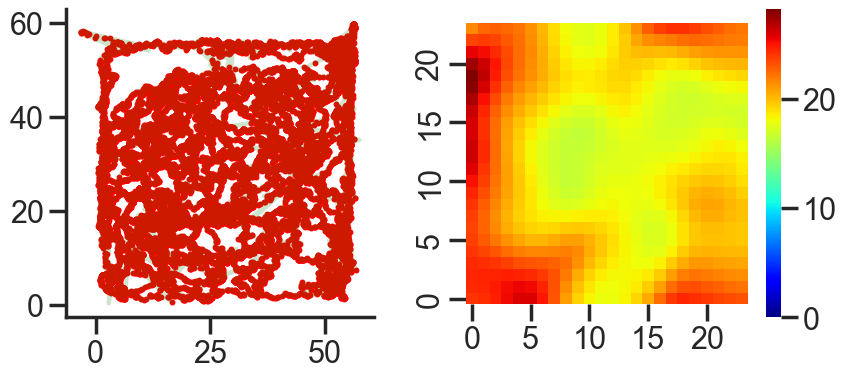

25


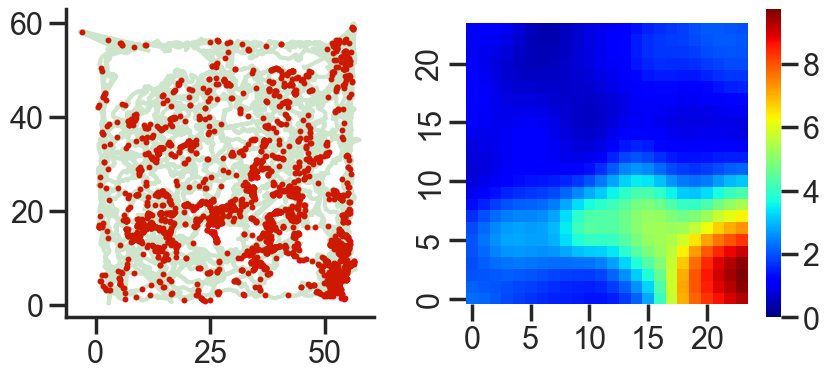

27


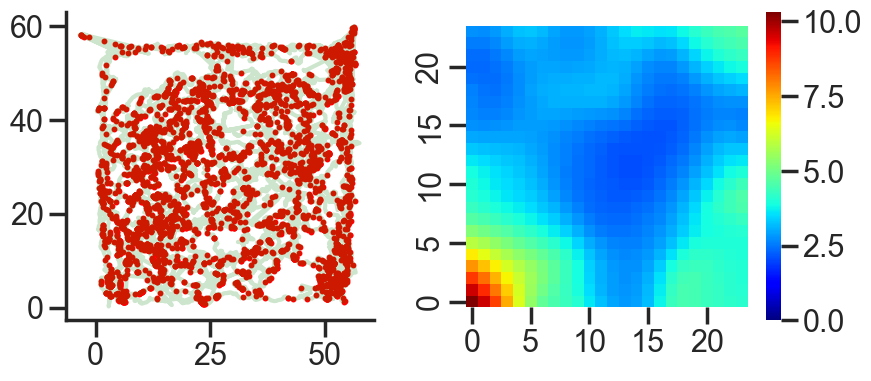

28


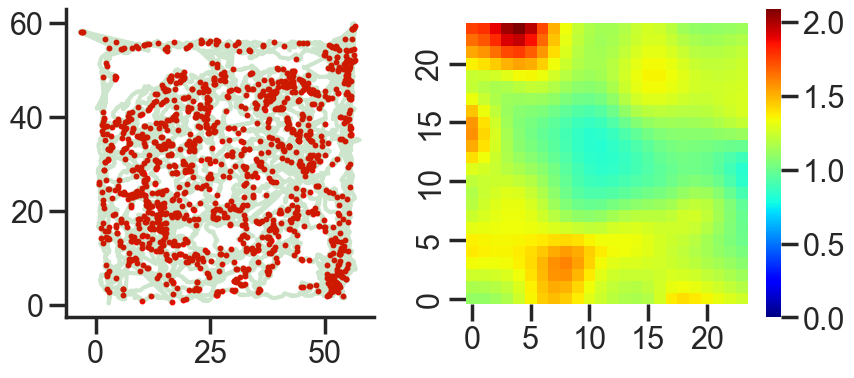

29


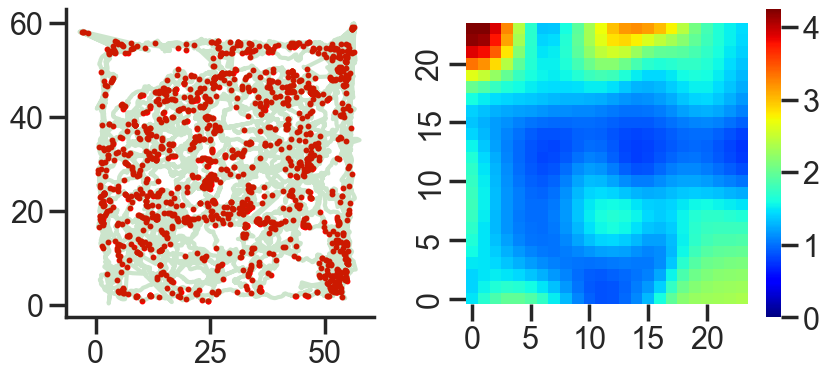

31


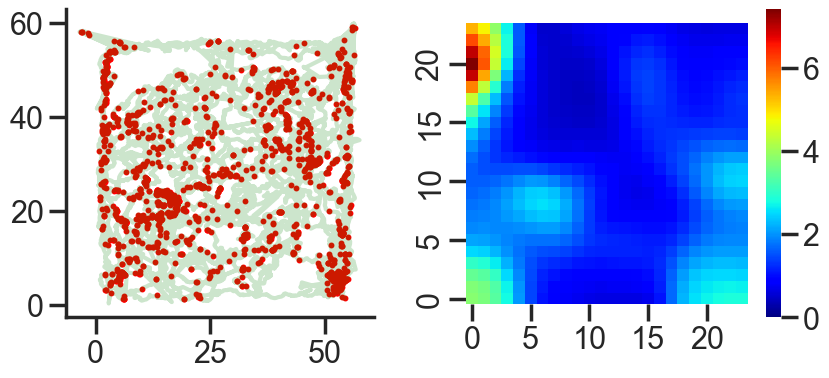

32


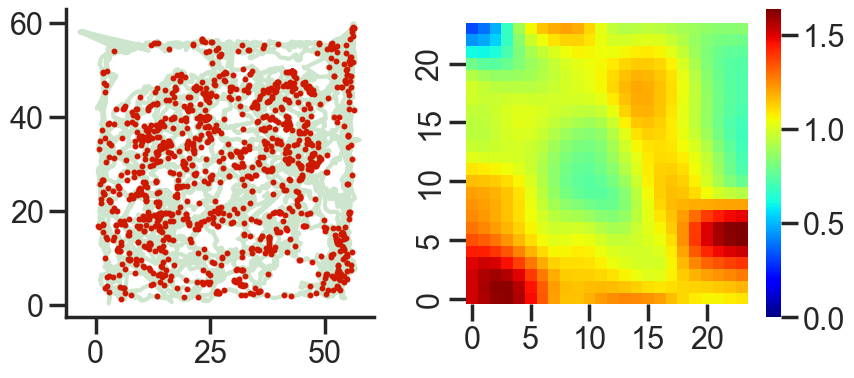

33


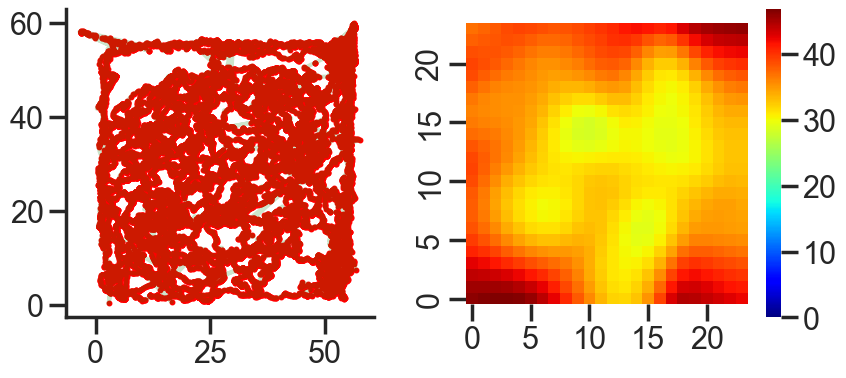

35


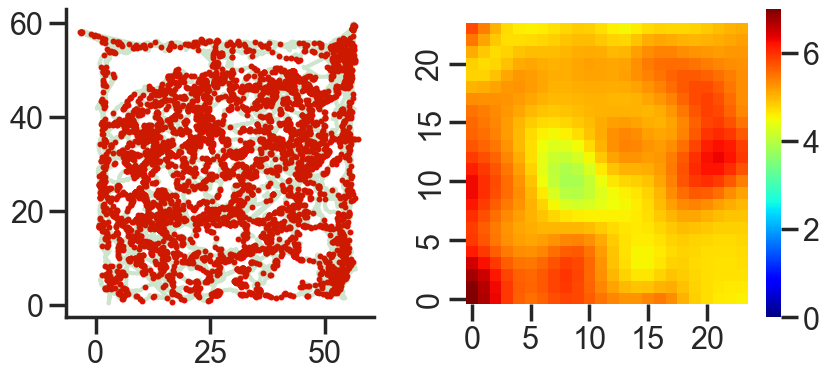

37
39
40
45
46
47


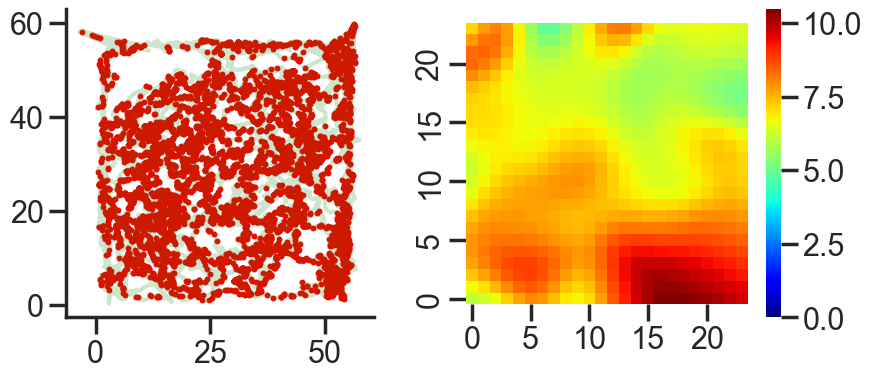

49


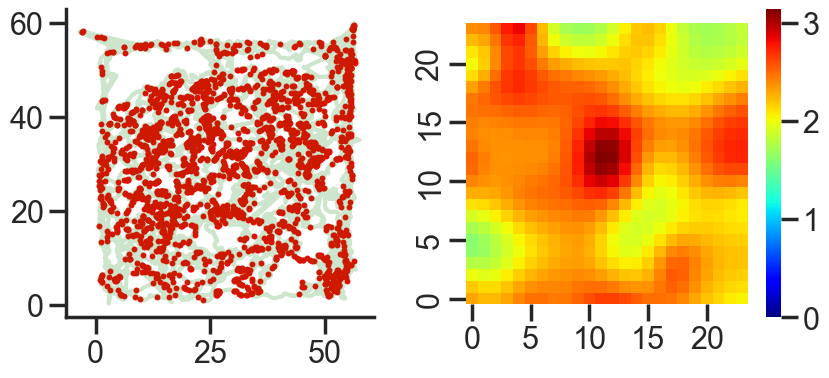

52


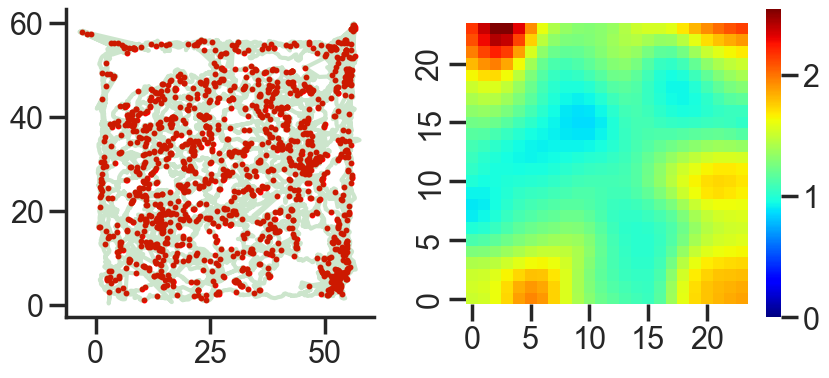

53


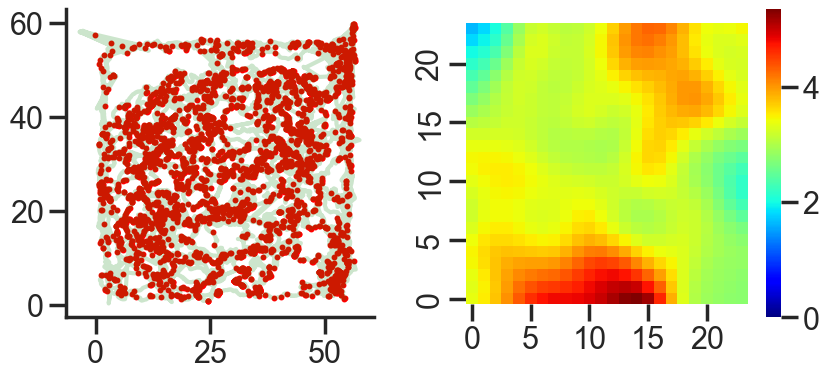

54
57
58


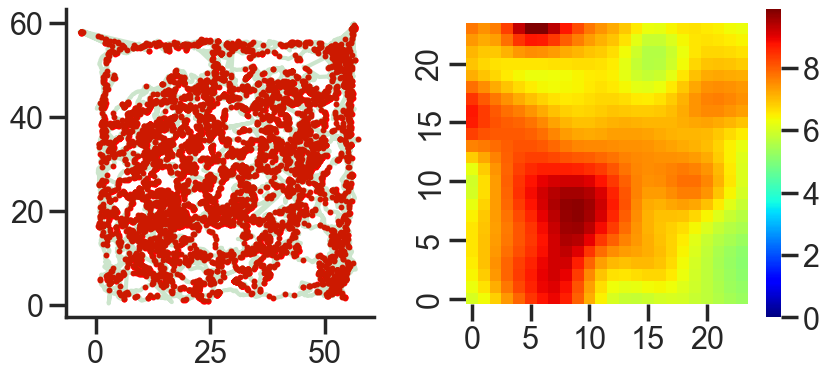

62


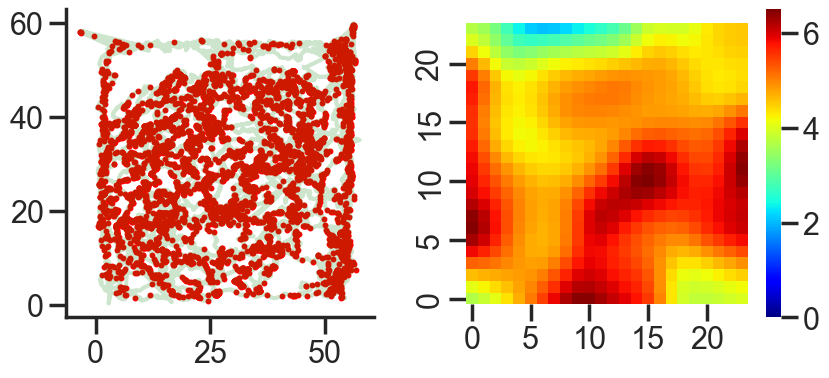

65


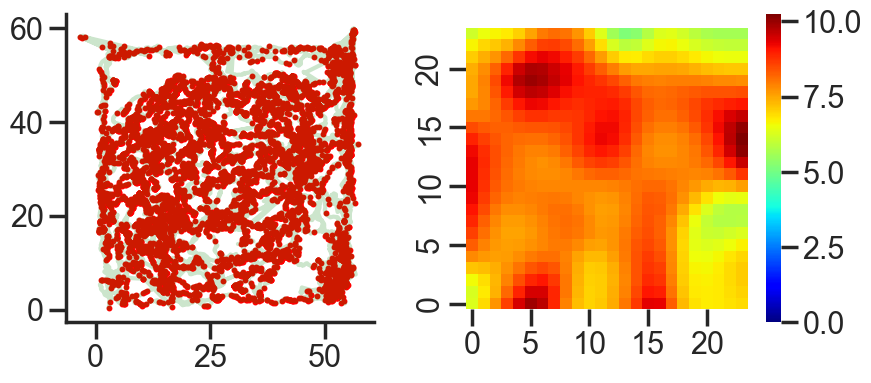

67


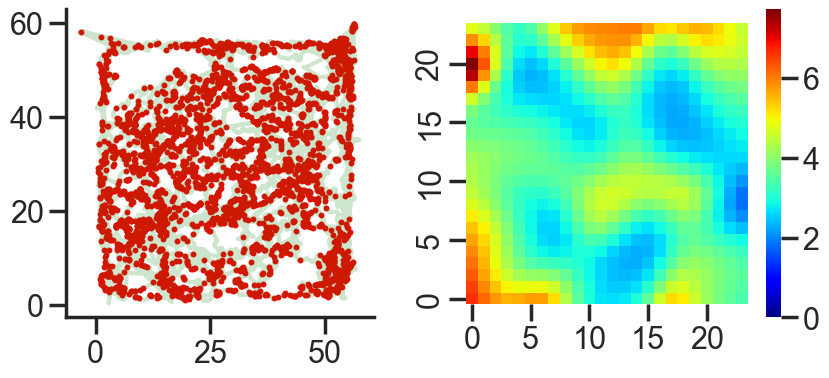

68


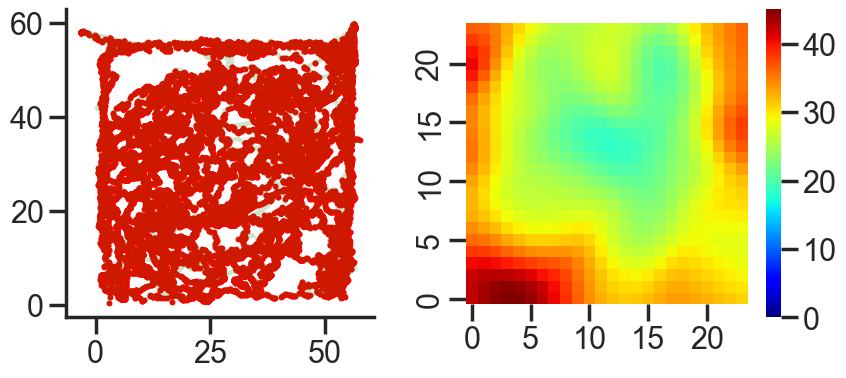

72
74


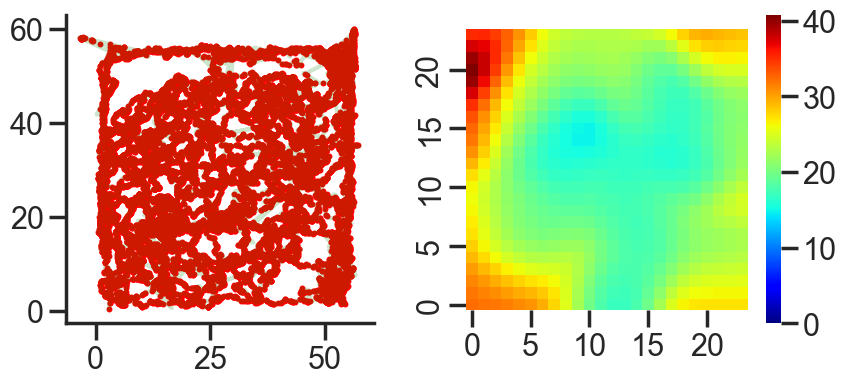

77


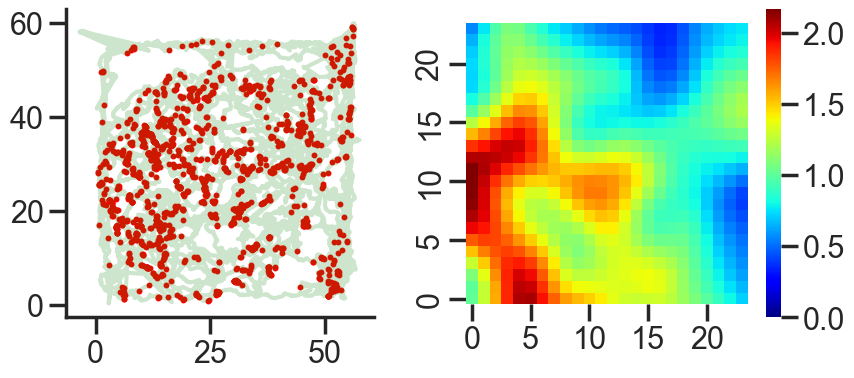

78


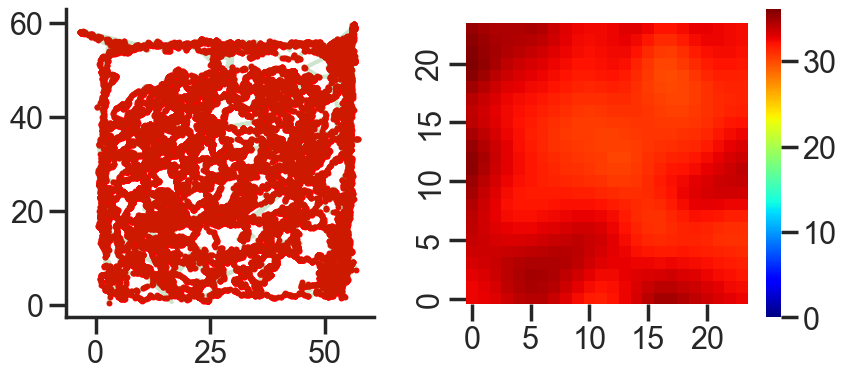

82


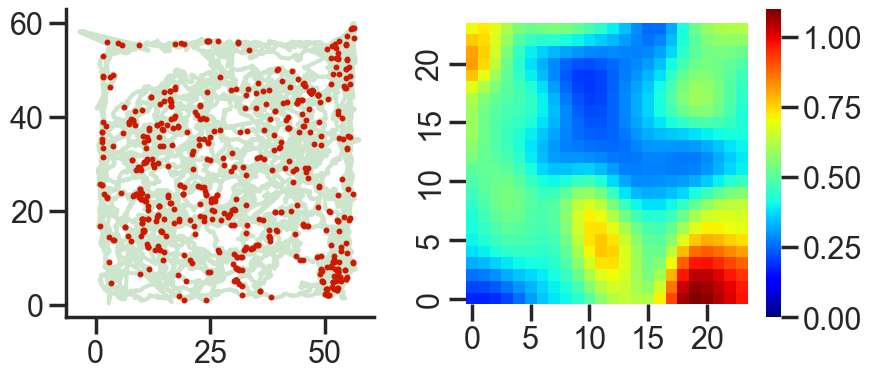

108


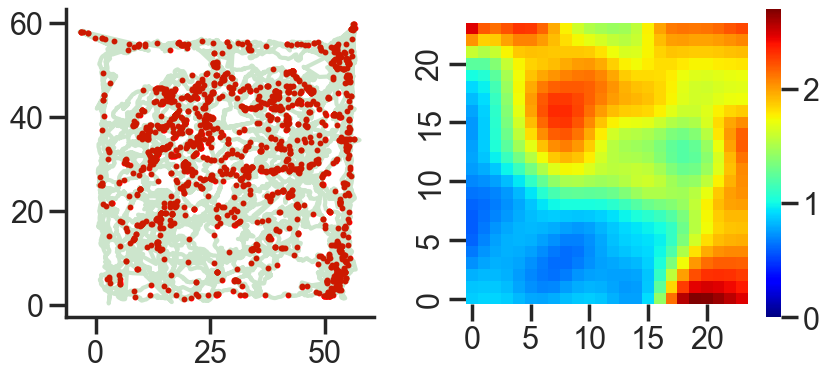

111


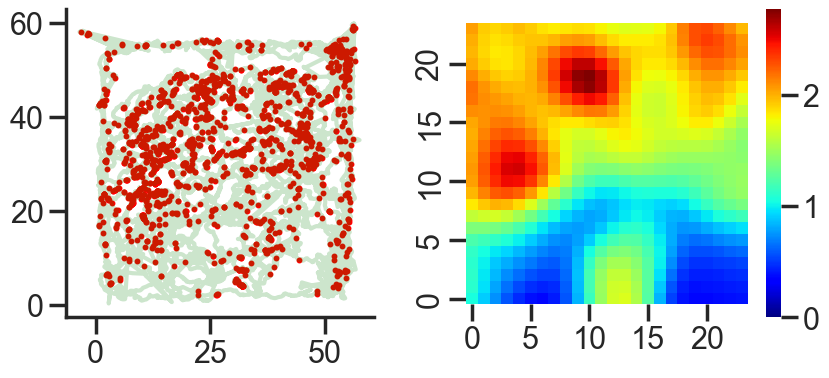

114


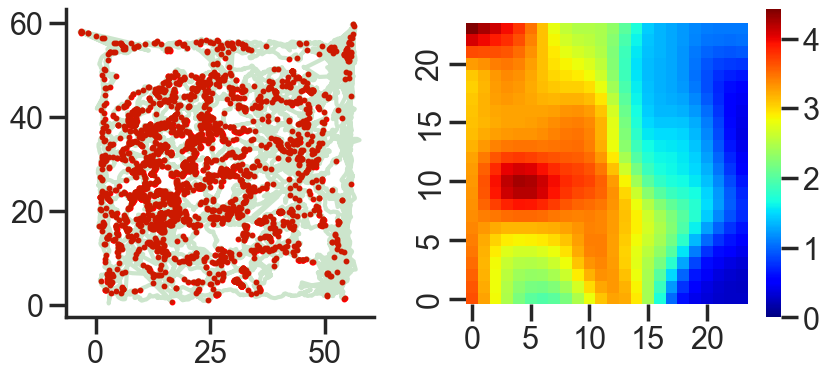

118


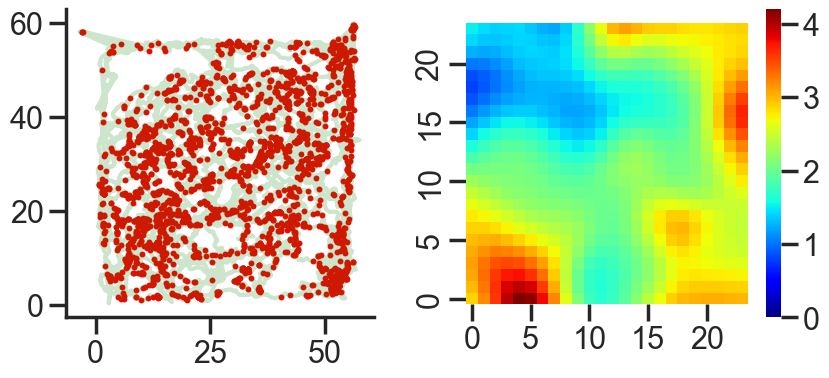

119


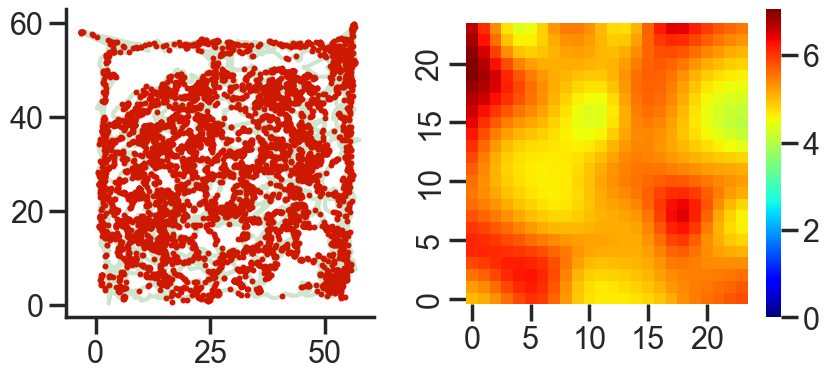

120


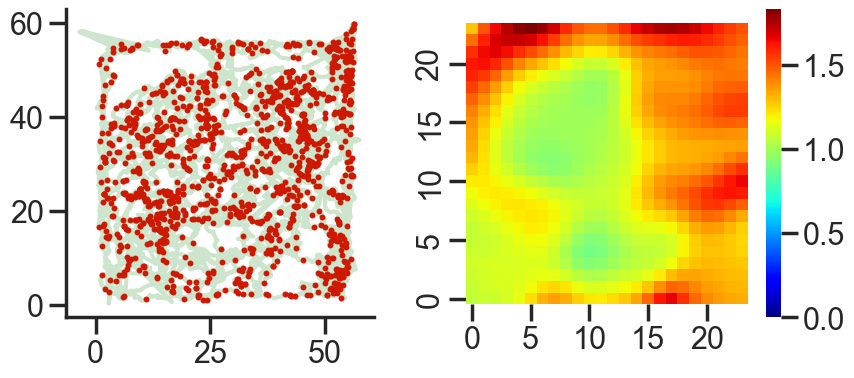

121


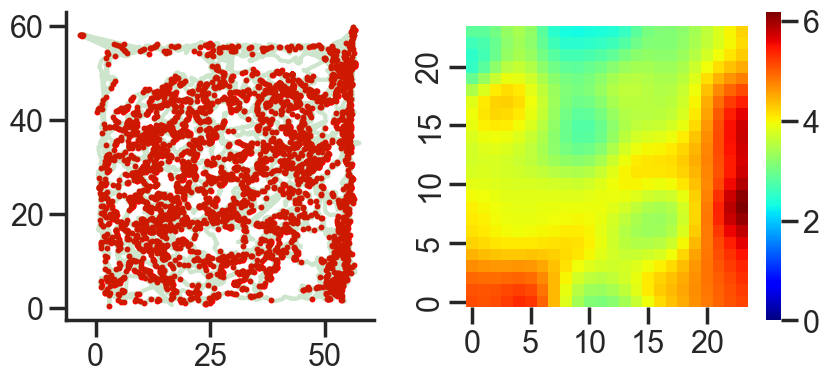

124


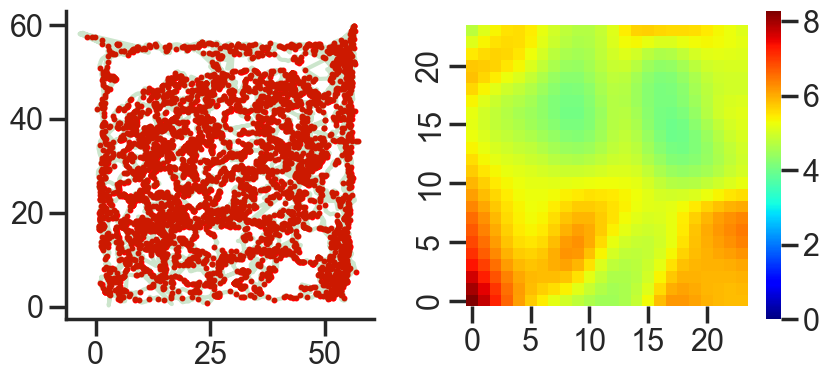

125


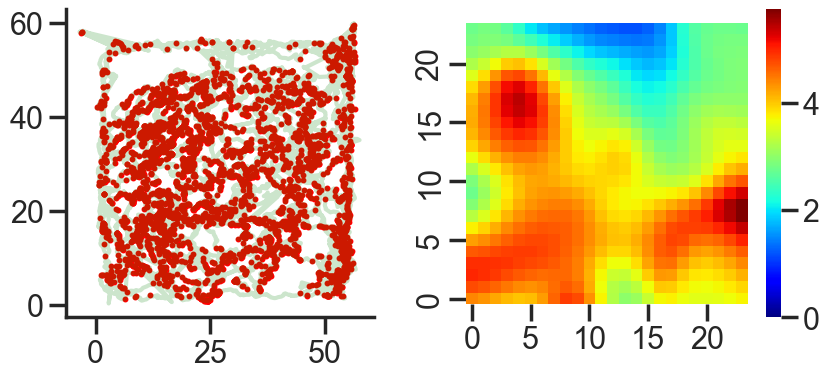

126


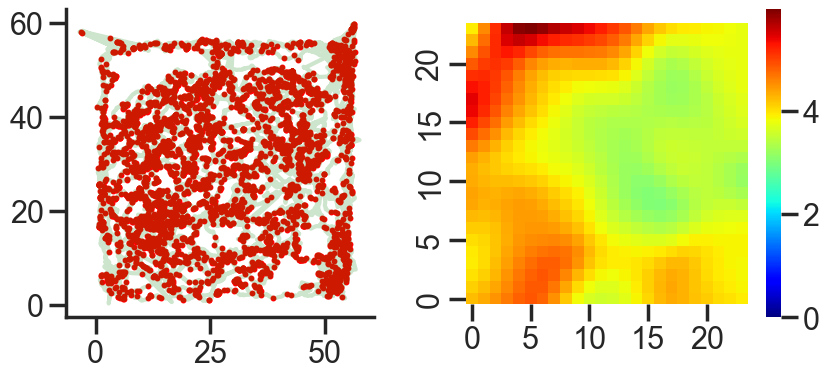

129


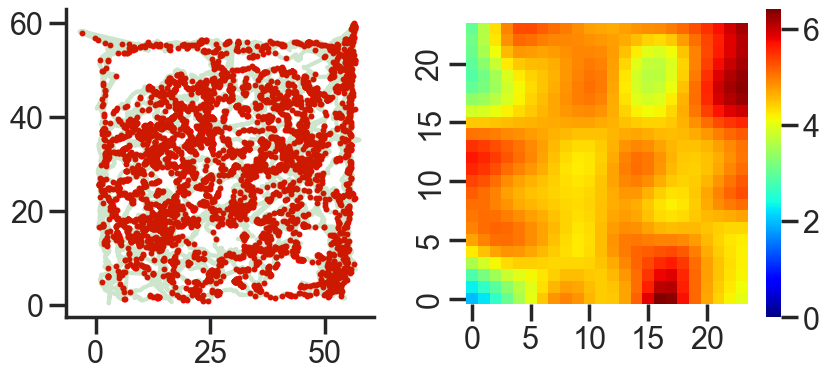

130


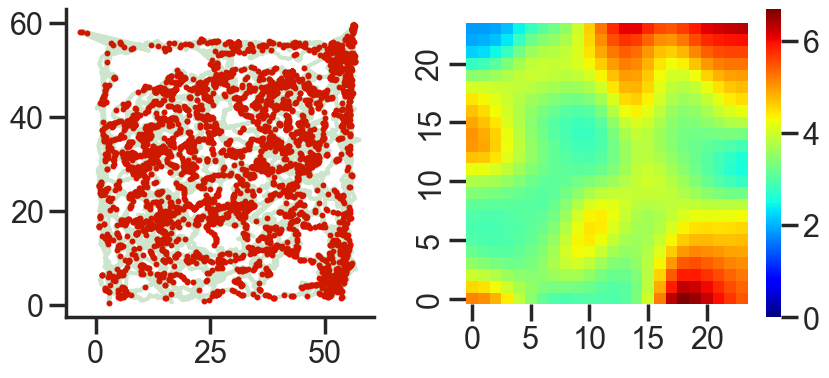

131


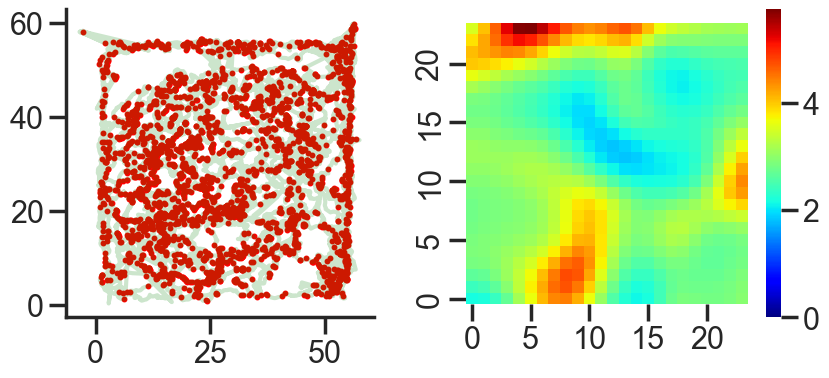

132


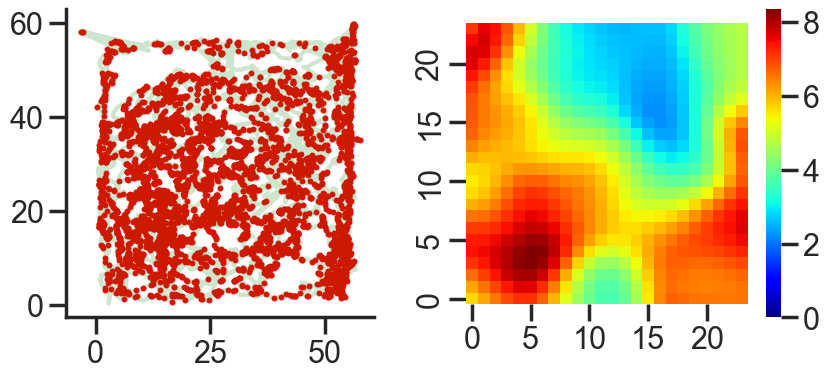

134
135


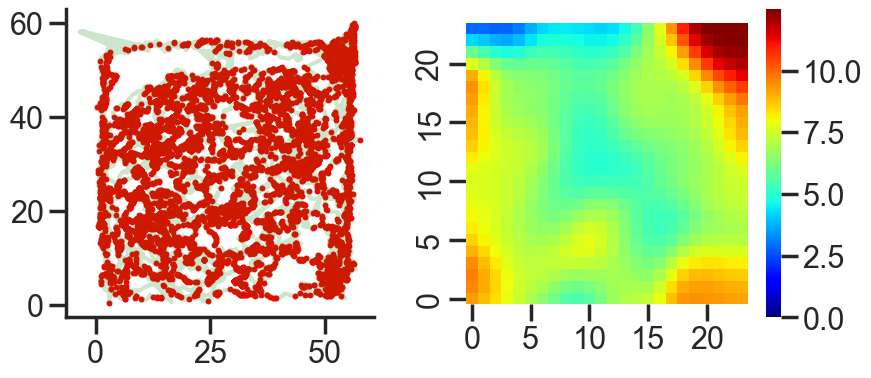

138
139


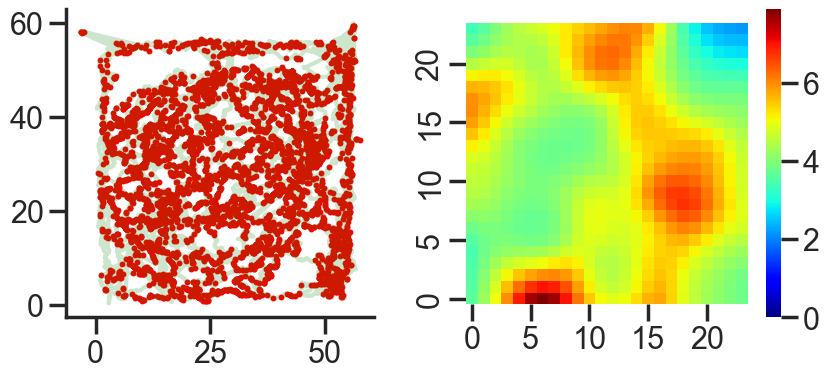

140


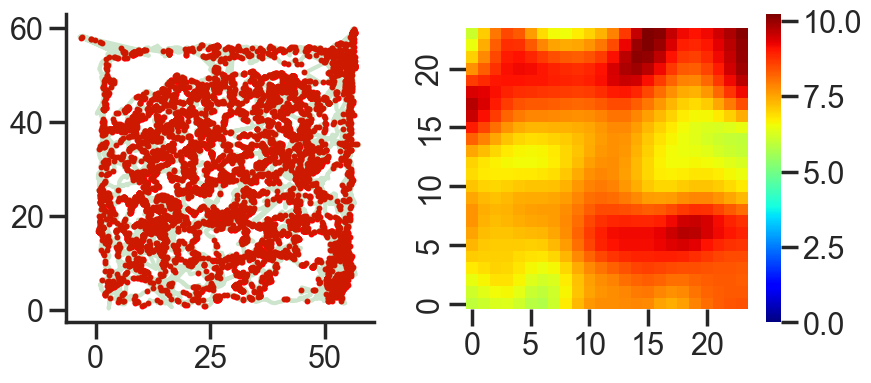

143


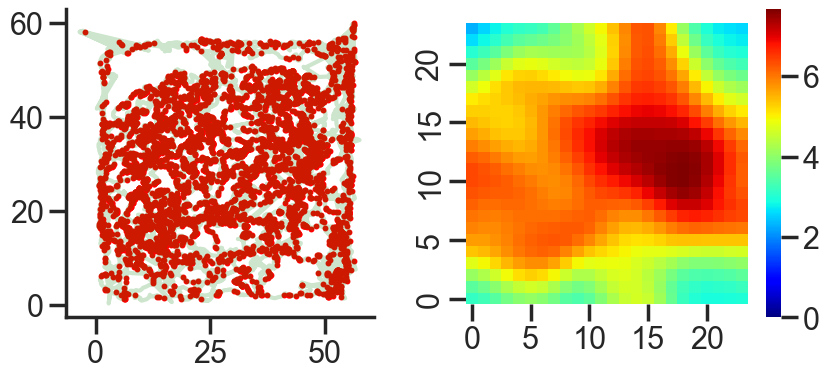

144


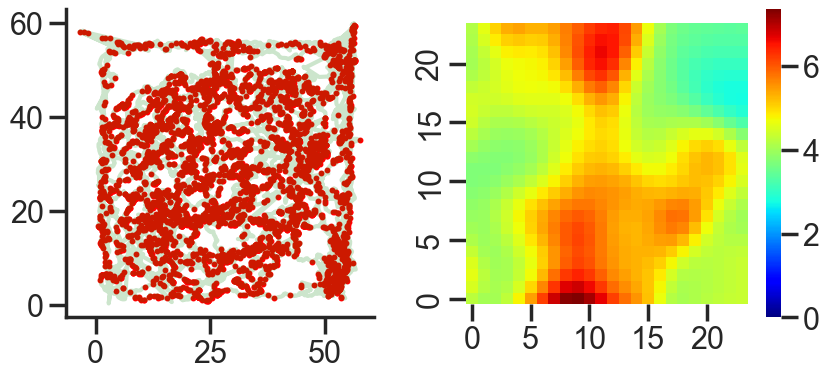

145


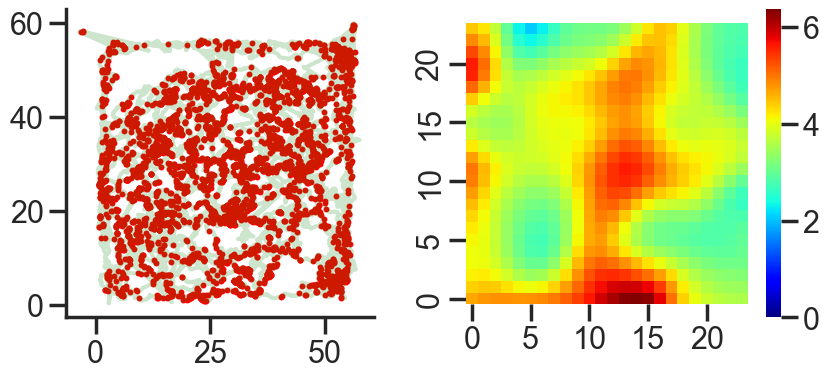

146


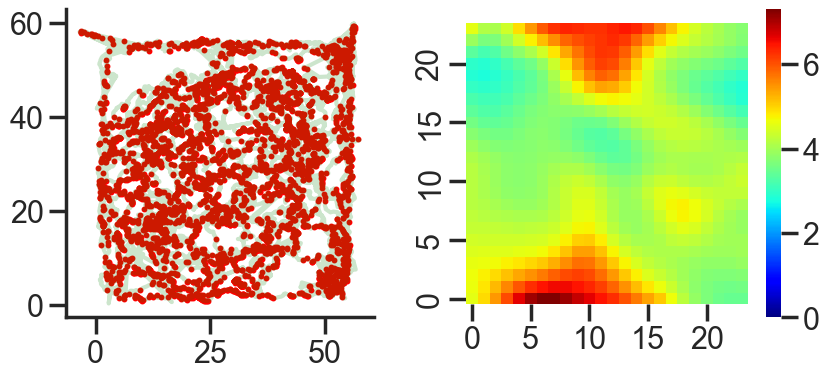

147


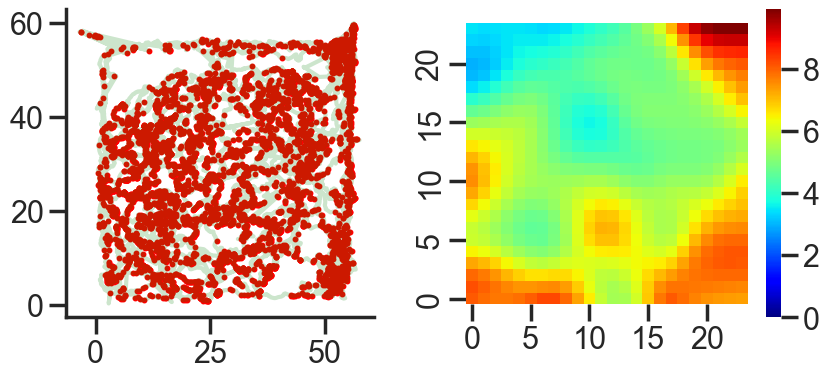

149


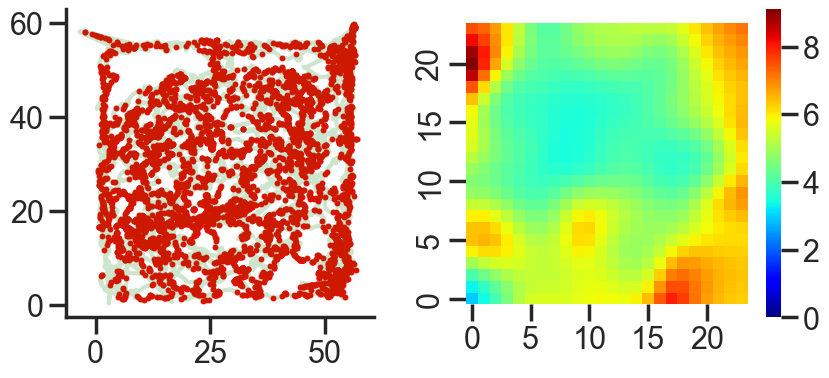

150


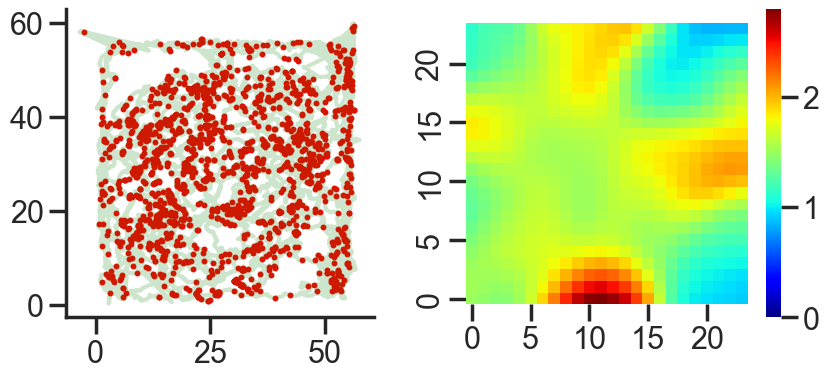

152


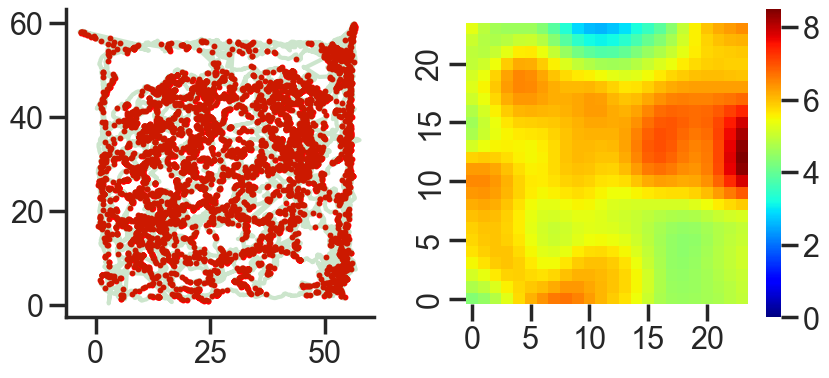

155


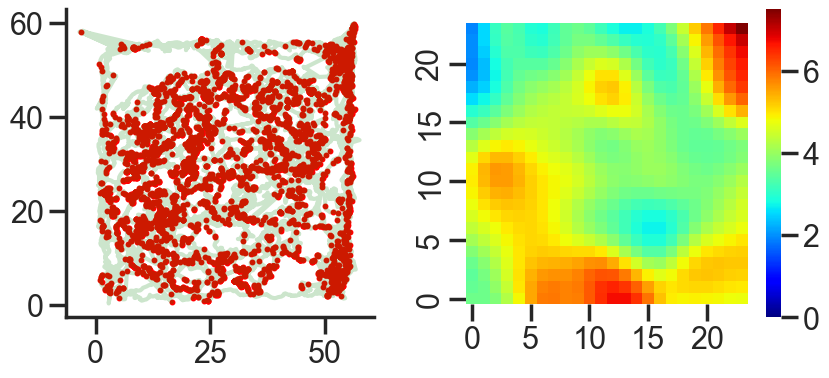

156


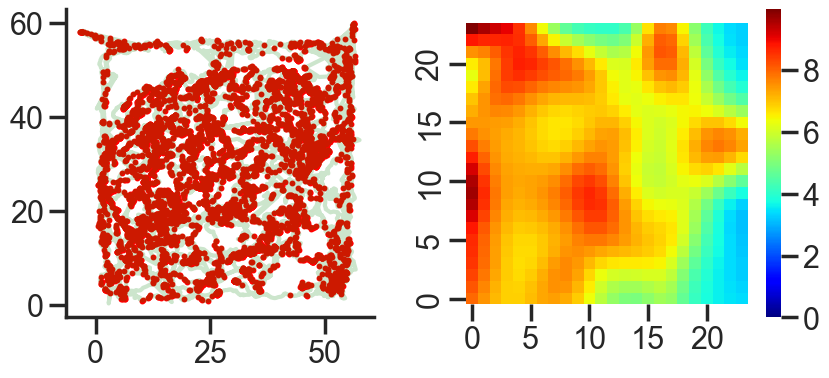

157
158
159
160


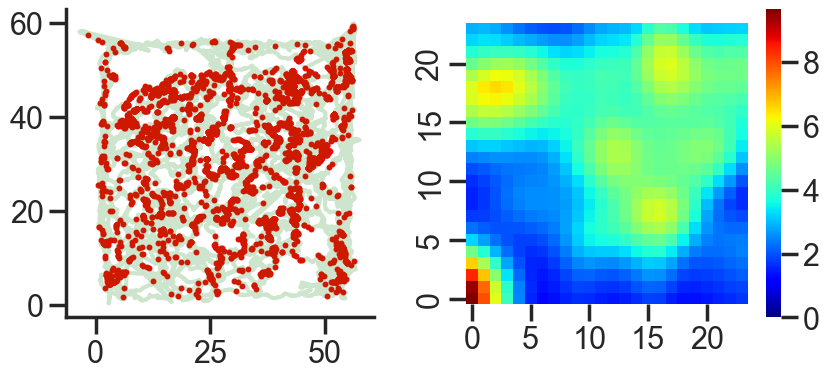

161
163
164
166


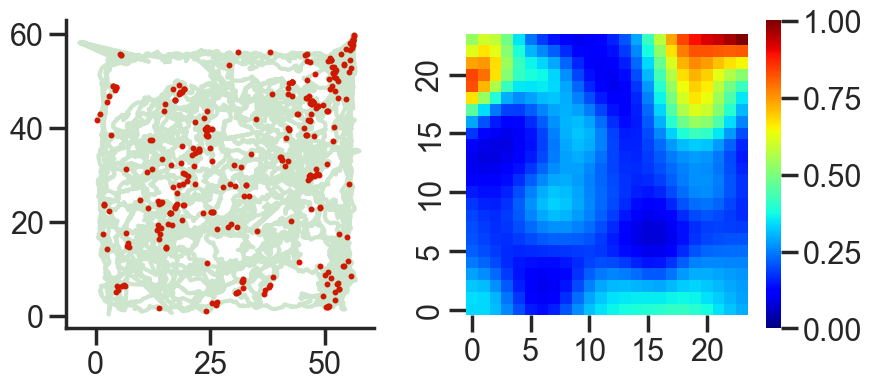

169


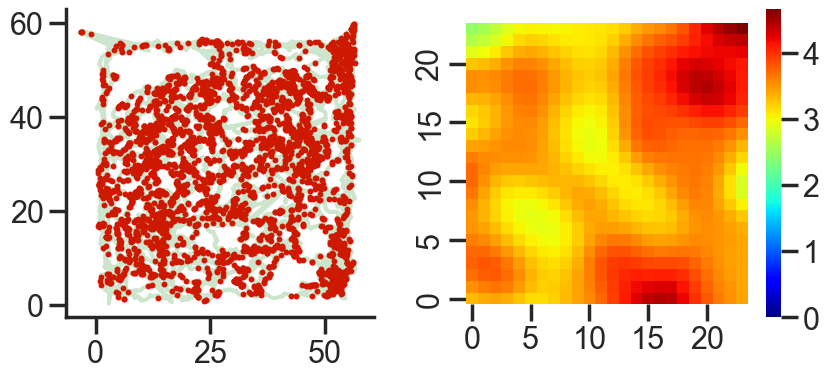

170
173
176


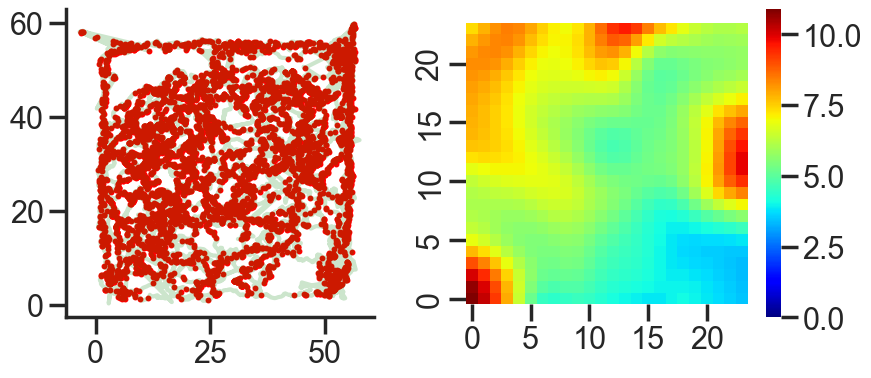

178


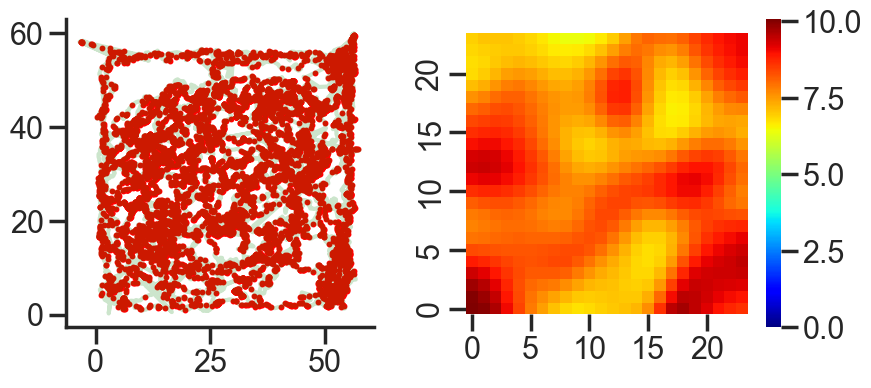

182
185
186
187


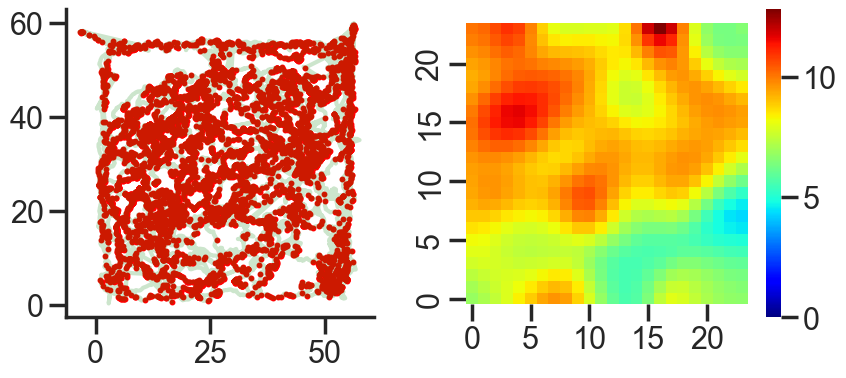

188


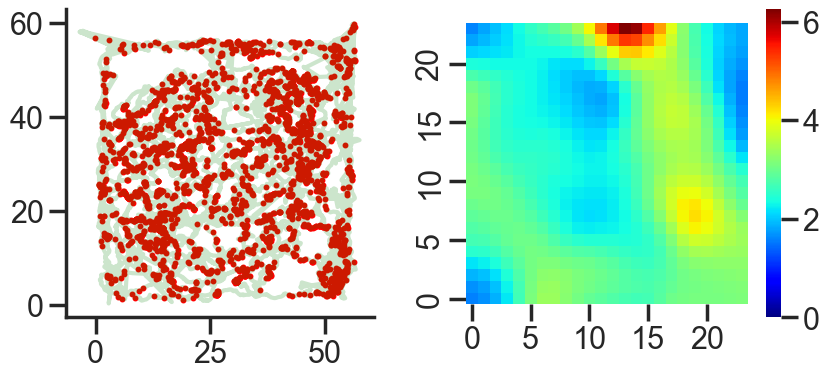

190
191
192


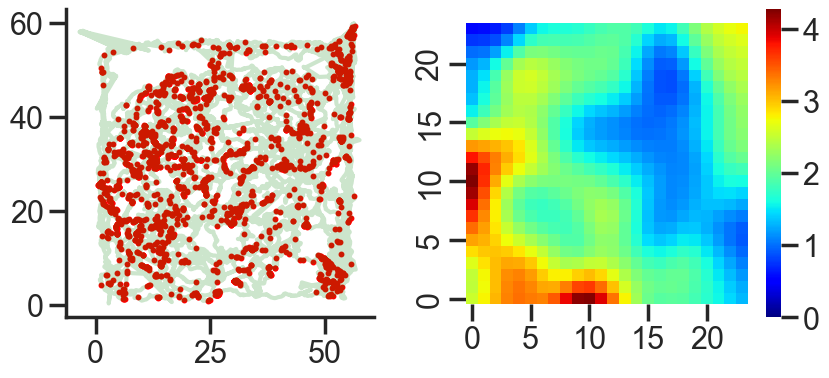

193


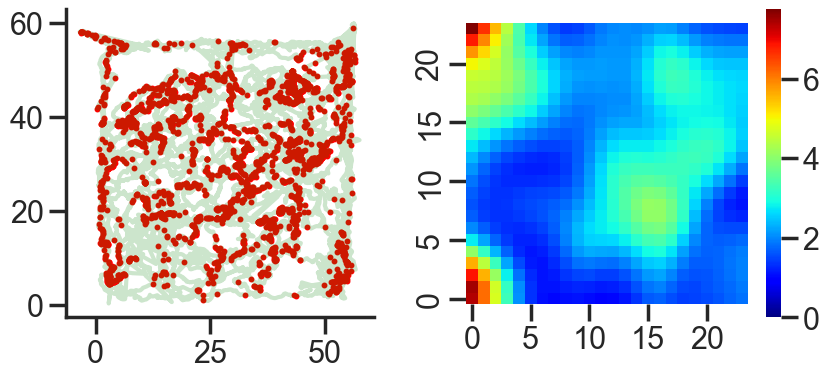

194
197


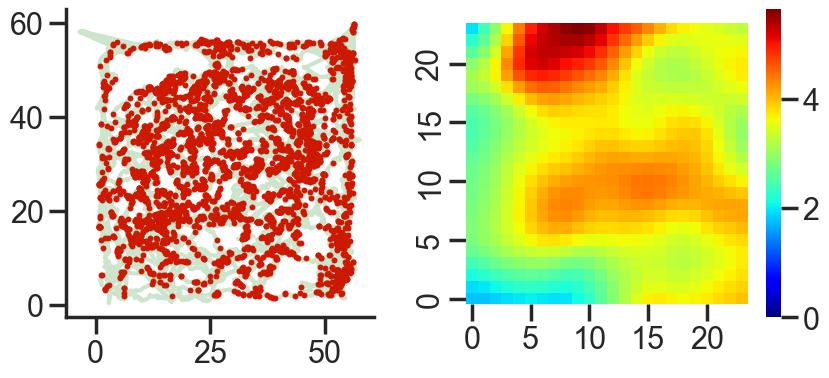

198
199
200
201


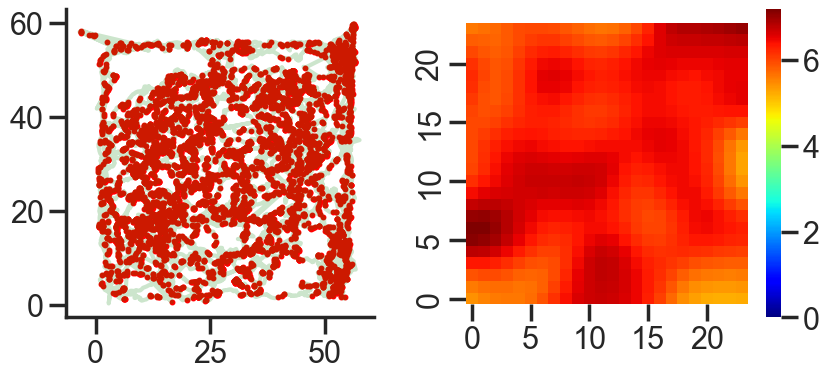

204


In [531]:
# 460 pix = 50 cm
# 512 = 58 cm
xc = df_dlc_light_aln.tailbase_x.values*58/450 
yc = df_dlc_light_aln.tailbase_y.values*58/450

xc_cm = xc
yc_cm = yc
# invert y axis
# yc_cm = 50 - yc_cm
ls = []

for unit in sorted(df_spk_l1.unit_id.unique()[:]):
    print(unit)
    tmp_light = df_spk_l1[df_spk_l1.unit_id == unit].spk.values
    tmp_light = tmp_light[tmp_light < xc.size/50]
    # 50 Hz, convert to sample
    spk_idx = tmp_light*50
    spk_pos_x = xc_cm[spk_idx.astype(int)]
    spk_pos_y = yc_cm[spk_idx.astype(int)]
#     plt.scatter(xc[spk_idx.astype(int)], yc[spk_idx.astype(int)], c = 'r', s = 5)
    firing_rate_map = np.zeros((number_of_bins_x, number_of_bins_y))
    
    for x in range(number_of_bins_x):
        for y in range(number_of_bins_y):
            px = x * bin_size + (bin_size / 2)
            py = y * bin_size + (bin_size / 2)
            spike_distances = np.sqrt(np.power(px - spk_pos_x, 2) + np.power(py - spk_pos_y, 2))
            spike_distances = spike_distances[~np.isnan(spike_distances)]
            
            occupancy_distances = np.sqrt(np.power((px - xc_cm), 2) + np.power((py - yc_cm), 2))
            occupancy_distances = occupancy_distances[~np.isnan(occupancy_distances)]
        
            bin_occupancy = len(np.where(occupancy_distances < min_dwell_distance)[0])
            
            if bin_occupancy >= min_dwell_time:
                firing_rate_map[x, y] = sum(gaussian_kernel(spike_distances/smooth)) / (sum(gaussian_kernel(occupancy_distances/smooth)) * (dt_position_ms/1000))

            else:
                firing_rate_map[x, y] = 0
    ls.append(firing_rate_map.T)
    if firing_rate_map.max() > 1:
        f, ax = plt.subplots(1, 2, figsize = (10, 4))
        ax[0].scatter(spk_pos_x, spk_pos_y, c = 'r', s = 5)
        ax[0].plot(xc_cm, yc_cm, 'g', alpha = 0.2, markersize = 5)
        sns.heatmap(firing_rate_map.T, vmin = 0, cmap = 'jet', ax = ax[1], square = True, xticklabels = 5, yticklabels = 5)
        ax[1].invert_yaxis()
#         ax[0].set_xlim(-1, 51)
#         ax[0].set_ylim(-1, 51)
        x0,x1 = ax[0].get_xlim()
        y0,y1 = ax[0].get_ylim()
        ax[0].set_aspect(abs(x1-x0)/abs(y1-y0))
#         ax[1].invert_yaxis()
        plt.show()
    
        

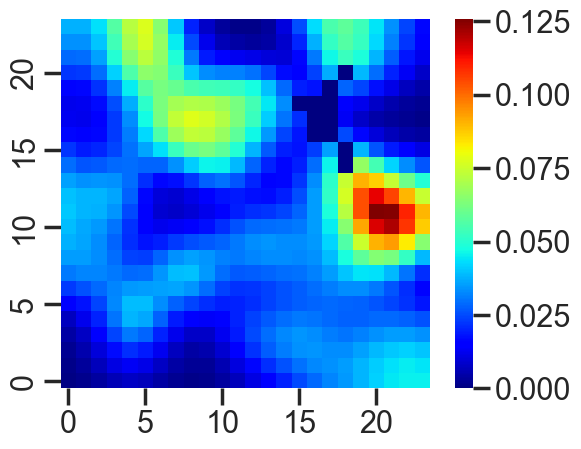

In [72]:
f, ax = plt.subplots()
sns.heatmap(firing_rate_map.T, vmin = 0, cmap = 'jet', square = True, ax = ax, xticklabels = 5, yticklabels = 5)
ax.invert_yaxis()

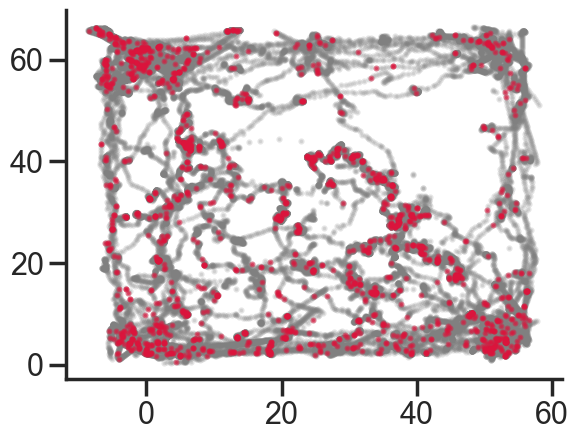

In [87]:
plt.scatter(xc_cm, yc_cm, c = 'gray', alpha = 0.2, s = 6)
plt.scatter(spk_pos_x, spk_pos_y, c = 'crimson', s = 5, alpha = 0.5)

In [1140]:
for i in range(len(conc_files)):
    # in 2500 -> 50hz
    sess_dur = int(n_samples[i])
    ls_samples.append(round(sess_dur/50))
    print(f'file {conc_files[i], sess_dur} samples {sess_dur/2500:0.4} sec {sess_dur/2500/60:0.4} min')
  

TypeError: 'int' object is not subscriptable

## VR analysis

### Load unity data

In [75]:
# path_cam = r"Z:\Users\Alex\Data Analysis\testSuncUnity\test.csv"
# df_cam = pd.read_csv(path_cam)
path_unity = r'x:\Data\Mice\VR\Alex\DATA_CHRONIC\ATN\JA178\09_07_22\Unity\cd_JA178_TS6-OVAR20_2022_09_07_17_14_09.csv'

df_unity = pd.read_csv(path_unity)
print(df_unity.shape)
df_unity.head()

(29225, 40)


C:\Users\lab\AppData\Local\Temp\ipykernel_15184\3611716204.py:5: DtypeWarning: Columns (30) have mixed types. Specify dtype option on import or set low_memory=False.
  df_unity = pd.read_csv(path_unity)


,TrialNum,TrialTime,Phase,OnOff,PosX,PosY,PosZ,RotX,RotY,RotZ,...,heave,roll,pitch,yaw,AccX,AccY,AccZ,GyroX,GyroY,GyroZ
0,0,0.058552,0,1,0.0,0.075,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,0.086805,0,1,0.0,0.075,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,0.114847,1,1,0.0,0.075,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,0.126613,1,1,0.0,0.075,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1,0.146880,1,1,0.0,0.075,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### check the fps

C:\Users\lab\AppData\Local\Temp\ipykernel_15184\1164951816.py:7: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  ax[1] = sns.distplot(dt)


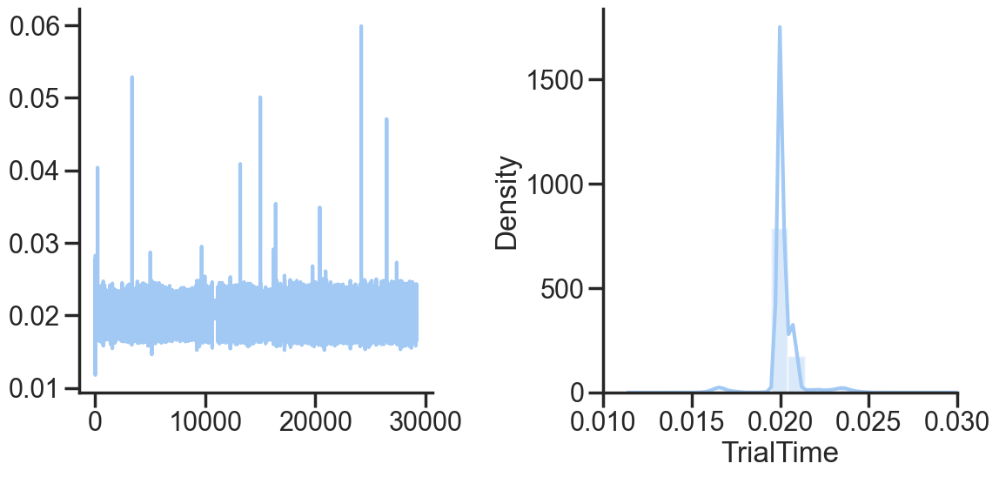

In [76]:
# 50 Hz recs
dt = df_unity.TrialTime.diff()[0:50000]
f, ax = plt.subplots(1, 2, figsize = (12, 6))
ax[0].plot(dt)
# ax[0].set_ylim(0.01, 0.03)
# ax[0].set_xlim(0, 50e3)
ax[1] = sns.distplot(dt)
ax[1].set_xlim(0.01, 0.03)
plt.tight_layout()

In [77]:
dt = 0.02
# fn - fn-1 gradient -> high freq noise
ang_delta = (df_unity['head_dir'].values[2:] - df_unity['head_dir'].values[:-2])
# wrap angles differences larger than 90 deg
#     ang_delta = (ang_delta + 180)%360 - 180
ang_delta[np.abs(ang_delta) > 180] = 0
# remove high freq noise due to the fn - fn - 1 gradient
#     ang_delta = savgol_filter(ang_delta, window_length=21, polyorder=2)
ahv = ang_delta*(1/dt)/2
# append to macth the length
ahv = np.concatenate((ahv, [0,0]))
ahv[(ahv > 400) | (ahv < -400)] = 0

In [78]:
df_unity['speed'] = (df_unity['zVel']**2 + df_unity['xVel']**2)**(1/2)
df_unity['ahv'] = ahv
df_unity.TTL = df_unity.TTL.fillna(method="ffill")
unity_ttl = df_unity.TTL.values

#### Check the yaw/speed distribution

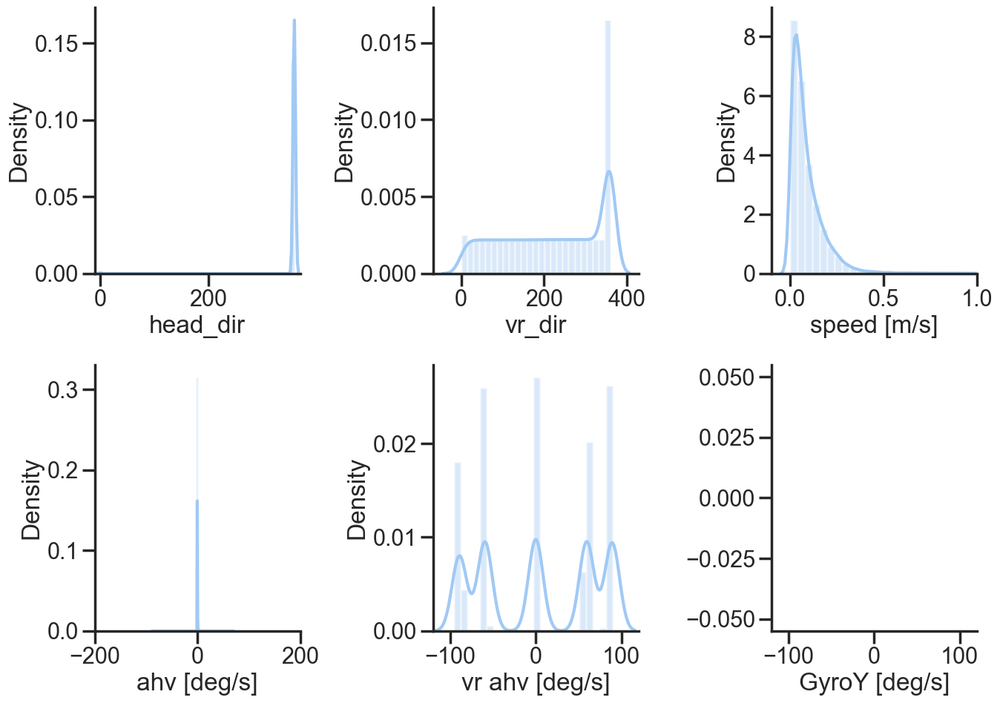

In [79]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    
    f, ax = plt.subplots(2, 3, figsize = (14, 10))

    sns.distplot(df_unity['head_dir'].values, ax = ax[0][0])
    ax[0][0].set_xlabel('head_dir')
    ax[0][0].set_xlim(-10, 370)
    sns.distplot(df_unity['RotY'].values, ax = ax[0][1])
    ax[0][1].set_xlabel('vr_dir')
    sns.distplot(df_unity['speed'].values, ax = ax[0][2])
    ax[0][2].set_xlabel('speed [m/s]')
    ax[0][2].set_xlim(-0.1, 1)

    sns.distplot(df_unity['ahv'].values, ax = ax[1][0])
    ax[1][0].set_xlabel('ahv [deg/s]')
    ax[1][0].set_xlim(-200, 200)
    sns.distplot(df_unity.yawVel.values, ax = ax[1][1])
    ax[1][1].set_xlabel('vr ahv [deg/s]')
    ax[1][1].set_xlim(-120, 120)
    sns.distplot(df_unity.GyroY.dropna().values*58, ax = ax[1][2])
    ax[1][2].set_xlabel('GyroY [deg/s]')
    ax[1][2].set_xlim(-120, 120)
    plt.tight_layout()

C:\Users\lab\AppData\Local\Temp\ipykernel_15184\1276881990.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ffx = df_unity[df_unity.Phase == 1].groupby('TrialNum').mean().FFX.values
C:\Users\lab\AppData\Local\Temp\ipykernel_15184\1276881990.py:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ffz = df_unity[df_unity.Phase == 1].groupby('TrialNum').mean().FFZ.values


-0.37354 0.60497 -0.81263 10.17057


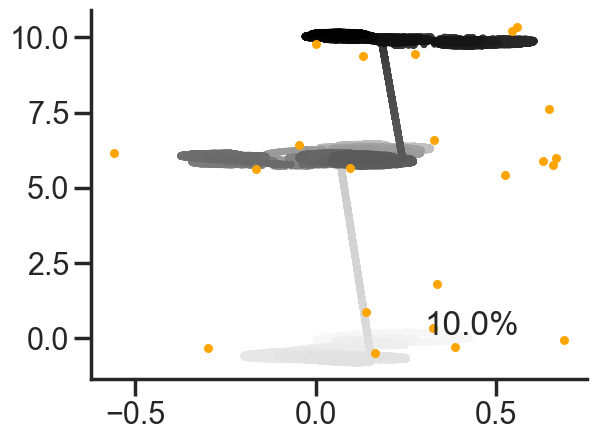

In [80]:
perf = round(df_unity[df_unity.score > 0].shape[0]/df_unity.TrialNum.unique().size, 1)*100
start, end = 0*50, 1000*50
posX = df_unity.PosX.values
posZ = df_unity.PosZ.values
ffx = df_unity[df_unity.Phase == 1].groupby('TrialNum').mean().FFX.values
ffz = df_unity[df_unity.Phase == 1].groupby('TrialNum').mean().FFZ.values
time_s = np.arange(0, posX.size/50, 0.02)
plt.scatter(posX[start:end], posZ[start:end], c = time_s[start:end], cmap = 'Greys', s = 10)
plt.scatter(ffx, ffz, c = 'orange', s = 20)
plt.text(0.3, 0.1, f'{perf}%')
print(posX.min(), posX.max(), posZ.min(), posZ.max())

### Find unity-ephys offset

In [81]:
ttl_lfp.size, unity_ttl.size

(361348, 29225)

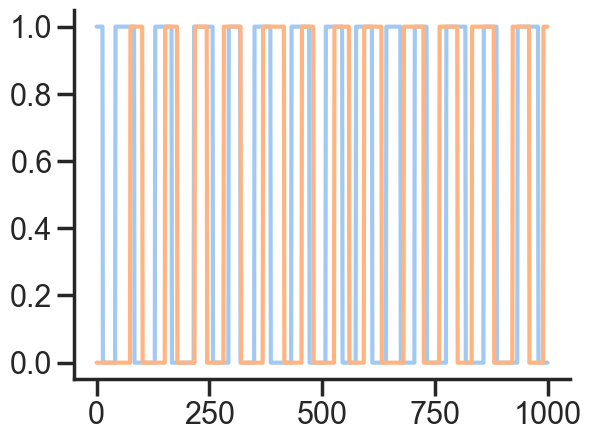

In [82]:
plt.plot(ttl_lfp[:1000])
plt.plot(unity_ttl[:1000])

In [83]:
print(path_unity)
for idx, v in enumerate(conc_files):
    print(f'{v} \t{ls_samples[idx]}')
print(np.cumsum(ls_samples[1:-1]))

x:\Data\Mice\VR\Alex\DATA_CHRONIC\ATN\JA178\09_07_22\Unity\cd_JA178_TS6-OVAR20_2022_09_07_17_14_09.csv
'20220907_JA178_rADN_yel_h2_R_LD1_g0_t0 	63567
20220907_JA178_rADN_yel_h2_VR1_TS6-HF_g0_t0 	32238
20220907_JA178_rADN_yel_h2_VR1_TS6-MR_g0_t0 	37775
20220907_JA178_rADN_yel_h2_VR1_TS7-HF_g0_t0 	31158
20220907_JA178_rADN_yel_h2_VR1_TS6-RPLCOMB_g0_t0 	67312
20220907_JA178_rADN_yel_h2_VR1_TS6-RPLVIS_g0_t0 	66364
20220907_JA178_rADN_yel_h2_VR1_TS6-RPLVEST_g0_t0 	61741
20220907_JA178_rADN_yel_h2_VR1_TS6-OVAR10_g0_t0 	31454
20220907_JA178_rADN_yel_h2_VR1_TS6-OVAR20_g0_t0' 	33308
[ 32238  70013 101171 168483 234847 296588 328042]


start_offset, unity_offset, shift_idx (330800, 0, -100, 0.332)


(0.0, 0.5)

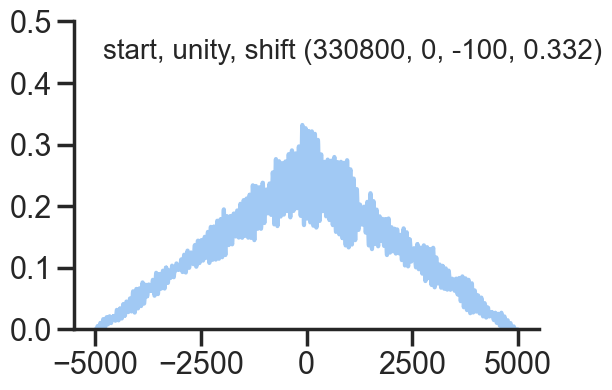

In [99]:
f, ax = plt.subplots(1, figsize = (6, 4))
n_samples = 5000
# needs to be picked
start_offset = 330800 
unity_offset = 0
lags = np.arange(-n_samples + 1, n_samples)

y1_light = ttl_lfp[unity_offset + start_offset:unity_offset + n_samples + start_offset]
y2_light = unity_ttl[unity_offset:n_samples+unity_offset]
y2_light
# y2 = df_unity.TTL.values[:n_samples]
# where_are_NaNs = np.isnan(y2)
# y2[where_are_NaNs] = 0
ccov_light = np.correlate(y1_light, y2_light, mode='full')
ccov_light = ccov_light / n_samples
shift_idx_light = (ccov_light.argmax() - n_samples)


print(f'start_offset, unity_offset, shift_idx {start_offset, unity_offset, shift_idx_light, ccov_light.max()}')
ax.plot(lags, ccov_light)
ax.text(0.6, 0.9, f'start, unity, shift {start_offset, unity_offset, shift_idx_light, ccov_light.max()}', 
        horizontalalignment='center', verticalalignment='center', transform=ax.transAxes, size = 20)

ax.set_ylim(0, 0.5)

In [100]:

# downsample ephys from LFP 2500/ spikes 30 000 to 50 Hz
# if spikes
# ephys_samples_dwn = digArray[0][::600]
# if LFP

ephys_ttl = ttl_lfp[unity_offset:]
# subtract the offset from spikes data
# subtract 10 sec *50 from spikes data
print(unity_ttl.size, ephys_ttl.size)

# how many slices, every 30min*60/5s
n_slices = 102
d_align = {}
for i in range(n_slices):
    # align every 5s with ccor of 20s
    # 15s offset is removed
    start_idx = i*5*50
    n_samples = 1000
    lags = np.arange(-n_samples + 1, n_samples)
    # start offset only used for ephys
    y1 = ephys_ttl[start_offset + start_idx:start_offset + start_idx + n_samples]
    y2 = unity_ttl[unity_offset + start_idx :unity_offset + n_samples + start_idx]
    # y2 = df_unity.TTL.values[:n_samples]
    where_are_NaNs = np.isnan(y2)
    y2[where_are_NaNs] = 0
    ccov = np.correlate(y1, y2, mode='full')
    ccor = ccov / n_samples
#     plt.plot(lags, ccor)
    shift_idx = (ccor.argmax() - n_samples)
    if (i == 0):
        prev_shift_idx = shift_idx
    # usually it gives error at the end of the exp
    # when there is less 100 ssamples to do ccor
    if abs(shift_idx - prev_shift_idx) > 10 and i > 1:
        print('manual adjustment', shift_idx,  prev_shift_idx + 1)
        shift_idx = prev_shift_idx + 1
        
    d_align[(i+1)*5] = shift_idx

    prev_shift_idx = shift_idx
    print(f'slice {i} at {(i+1)*5}s\t maxcorr {ccor.max()}\tshift {shift_idx} samples')
    # take ephys data 65*500 (sec) samples 

29225 361348
slice 0 at 5s	 maxcorr 0.393	shift -118 samples
slice 1 at 10s	 maxcorr 0.448	shift -116 samples
slice 2 at 15s	 maxcorr 0.433	shift -114 samples
slice 3 at 20s	 maxcorr 0.417	shift -112 samples
slice 4 at 25s	 maxcorr 0.426	shift -110 samples
slice 5 at 30s	 maxcorr 0.425	shift -108 samples
slice 6 at 35s	 maxcorr 0.432	shift -105 samples
slice 7 at 40s	 maxcorr 0.427	shift -103 samples
slice 8 at 45s	 maxcorr 0.415	shift -101 samples
slice 9 at 50s	 maxcorr 0.427	shift -99 samples
slice 10 at 55s	 maxcorr 0.453	shift -96 samples
slice 11 at 60s	 maxcorr 0.417	shift -94 samples
slice 12 at 65s	 maxcorr 0.431	shift -89 samples
slice 13 at 70s	 maxcorr 0.459	shift -86 samples
slice 14 at 75s	 maxcorr 0.436	shift -84 samples
slice 15 at 80s	 maxcorr 0.437	shift -81 samples
slice 16 at 85s	 maxcorr 0.446	shift -78 samples
slice 17 at 90s	 maxcorr 0.431	shift -75 samples
slice 18 at 95s	 maxcorr 0.42	shift -73 samples
slice 19 at 100s	 maxcorr 0.446	shift -70 samples
slice 20 

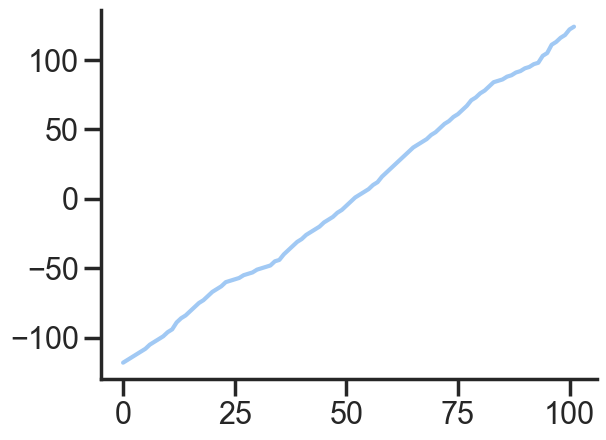

In [101]:
plt.plot(d_align.values())

#### Adjust offset values

In [102]:
d_align

{5: -118,
 10: -116,
 15: -114,
 20: -112,
 25: -110,
 30: -108,
 35: -105,
 40: -103,
 45: -101,
 50: -99,
 55: -96,
 60: -94,
 65: -89,
 70: -86,
 75: -84,
 80: -81,
 85: -78,
 90: -75,
 95: -73,
 100: -70,
 105: -67,
 110: -65,
 115: -63,
 120: -60,
 125: -59,
 130: -58,
 135: -57,
 140: -55,
 145: -54,
 150: -53,
 155: -51,
 160: -50,
 165: -49,
 170: -48,
 175: -45,
 180: -44,
 185: -40,
 190: -37,
 195: -34,
 200: -31,
 205: -29,
 210: -26,
 215: -24,
 220: -22,
 225: -20,
 230: -17,
 235: -15,
 240: -13,
 245: -10,
 250: -8,
 255: -5,
 260: -2,
 265: 1,
 270: 3,
 275: 5,
 280: 7,
 285: 10,
 290: 12,
 295: 16,
 300: 19,
 305: 22,
 310: 25,
 315: 28,
 320: 31,
 325: 34,
 330: 37,
 335: 39,
 340: 41,
 345: 43,
 350: 46,
 355: 48,
 360: 51,
 365: 54,
 370: 56,
 375: 59,
 380: 61,
 385: 64,
 390: 67,
 395: 71,
 400: 73,
 405: 76,
 410: 78,
 415: 81,
 420: 84,
 425: 85,
 430: 86,
 435: 88,
 440: 89,
 445: 91,
 450: 92,
 455: 94,
 460: 95,
 465: 97,
 470: 98,
 475: 103,
 480: 105,
 485

In [103]:
# align every 5sec
n_samples = 250
lags = np.arange(-n_samples + 1, n_samples)
d_align_adj = {}
# f, ax = plt.subplots(1, figsize = (16, 8))
for key, val in d_align.items():
    
#     print(key, val)
    start = key*50 - val
    y1 = ephys_ttl[start_offset +  key*50 : start_offset + key*50 + 5*50]
    y2 = unity_ttl[unity_offset + start: unity_offset + start + 5*50 ]
    ccov = np.correlate(y1, y2, mode='full')
    ccor = ccov / n_samples
    #     plt.plot(lags, ccor)
    shift_idx = (ccor.argmax() - n_samples)
    print(f'ccro {ccor.max()}, \toffset {start}, \tshift {shift_idx} \tadjusted {val + (shift_idx + 1)}')
    
    d_align_adj[key] = val + (shift_idx + 1)
#     plt.plot(t, y1, label = 'ephys')
#     plt.plot(t, y2*0.75, label = 'unity')
#     plt.show()
#     break

ccro 0.512, 	offset 368, 	shift -1 	adjusted -118
ccro 0.532, 	offset 616, 	shift -1 	adjusted -116
ccro 0.516, 	offset 864, 	shift 0 	adjusted -113
ccro 0.492, 	offset 1112, 	shift 0 	adjusted -111
ccro 0.432, 	offset 1360, 	shift 0 	adjusted -109
ccro 0.508, 	offset 1608, 	shift -1 	adjusted -108
ccro 0.56, 	offset 1855, 	shift -1 	adjusted -105
ccro 0.44, 	offset 2103, 	shift -1 	adjusted -103
ccro 0.456, 	offset 2351, 	shift -1 	adjusted -101
ccro 0.576, 	offset 2599, 	shift -1 	adjusted -99
ccro 0.44, 	offset 2846, 	shift -1 	adjusted -96
ccro 0.536, 	offset 3094, 	shift -1 	adjusted -94
ccro 0.552, 	offset 3339, 	shift -1 	adjusted -89
ccro 0.456, 	offset 3586, 	shift -1 	adjusted -86
ccro 0.524, 	offset 3834, 	shift -1 	adjusted -84
ccro 0.58, 	offset 4081, 	shift -1 	adjusted -81
ccro 0.44, 	offset 4328, 	shift -1 	adjusted -78
ccro 0.432, 	offset 4575, 	shift -2 	adjusted -76
ccro 0.54, 	offset 4823, 	shift -1 	adjusted -73
ccro 0.552, 	offset 5070, 	shift -1 	adjusted -70
ccr

#### Plot ttl traces

2


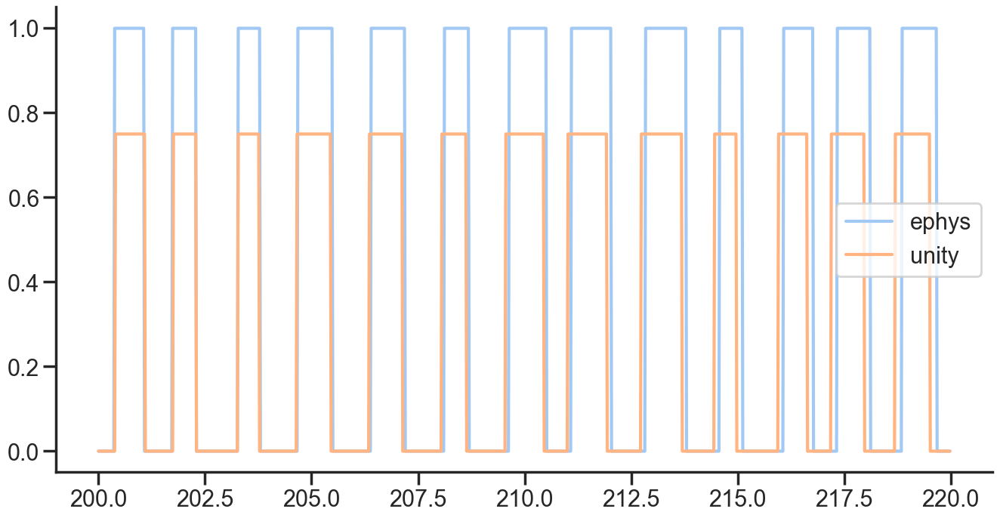

In [104]:
f, ax = plt.subplots(1, figsize = (16,8))
start = 200
end = 220
n_samples = (end - start)*50
lag = d_align_adj[start]
# if negative lag
y1 = ephys_ttl[start_offset +  start*50 : start_offset + end*50]
y2 = unity_ttl[unity_offset + start*50 - lag: unity_offset + end*50 - lag]*0.75

lags = np.arange(-n_samples + 1, n_samples)
ccov = np.correlate(y1, y2, mode='full')
ccor = ccov / n_samples
#     plt.plot(lags, ccor)
shift_idx = (ccor.argmax() - n_samples)
print(shift_idx)
t = np.arange(start, end, 0.02)
plt.plot(t, y1, label = 'ephys')
plt.plot(t, y2, label = 'unity')
plt.legend()

### Rebuild aligned unity data

In [105]:
ls_aligned_blocks = []
for key, val in d_align_adj.items():
    # key = start of the slice, val = lag
    print(key, val)
    # 100 samples that were removed at the beginning
    start = key*50 - val
    # build in 5s blocks
    tmp = df_unity.iloc[unity_offset + start: unity_offset + start + 5*50]
    ls_aligned_blocks.append(tmp)

df_unity_aln = pd.concat(ls_aligned_blocks)
df_unity_aln.head()

5 -118
10 -116
15 -113
20 -111
25 -109
30 -108
35 -105
40 -103
45 -101
50 -99
55 -96
60 -94
65 -89
70 -86
75 -84
80 -81
85 -78
90 -76
95 -73
100 -70
105 -67
110 -65
115 -63
120 -60
125 -59
130 -58
135 -57
140 -55
145 -54
150 -52
155 -51
160 -50
165 -48
170 -47
175 -45
180 -44
185 -40
190 -38
195 -35
200 -31
205 -29
210 -26
215 -24
220 -22
225 -20
230 -17
235 -15
240 -13
245 -10
250 -8
255 -5
260 -2
265 1
270 3
275 5
280 7
285 10
290 12
295 15
300 19
305 22
310 24
315 27
320 31
325 34
330 37
335 39
340 41
345 43
350 46
355 47
360 51
365 53
370 56
375 58
380 61
385 64
390 66
395 69
400 72
405 75
410 78
415 81
420 83
425 85
430 87
435 88
440 89
445 91
450 92
455 94
460 95
465 97
470 98
475 101
480 105
485 109
490 113
495 115
500 117
505 120
510 123


,TrialNum,TrialTime,Phase,OnOff,PosX,PosY,PosZ,RotX,RotY,RotZ,...,pitch,yaw,AccX,AccY,AccZ,GyroX,GyroY,GyroZ,speed,ahv
368,1,7.503911,1,1,0.01348,0.075,0.02313,0.0,298.9783,0.0,...,1.0519,0.0761,NaN,NaN,NaN,NaN,NaN,NaN,0.022971,0.0
369,1,7.524344,1,1,0.01289,0.075,0.02346,0.0,300.1581,0.0,...,1.0334,0.0753,NaN,NaN,NaN,NaN,NaN,NaN,0.033023,0.0
370,1,7.544316,1,1,0.01270,0.075,0.02357,0.0,301.3313,0.0,...,1.0301,0.0759,NaN,NaN,NaN,NaN,NaN,NaN,0.011053,0.0
371,1,7.564771,1,1,0.01255,0.075,0.02366,0.0,302.5598,0.0,...,1.0409,0.0747,NaN,NaN,NaN,NaN,NaN,NaN,0.008170,0.0
372,1,7.584832,1,1,0.01247,0.075,0.02371,0.0,303.7320,0.0,...,1.0388,0.0770,NaN,NaN,NaN,NaN,NaN,NaN,0.004893,0.0


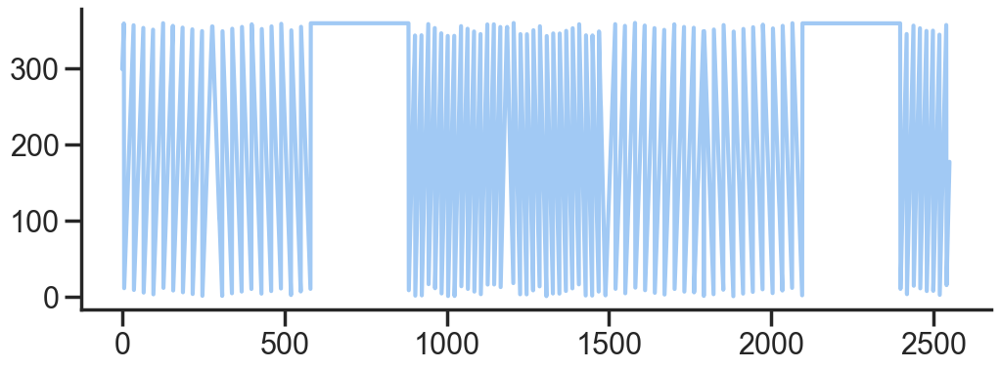

In [106]:
f, ax = plt.subplots(figsize = (12, 4))
yaw = df_unity_aln.RotY.values[::10]
plt.plot(yaw, '-')

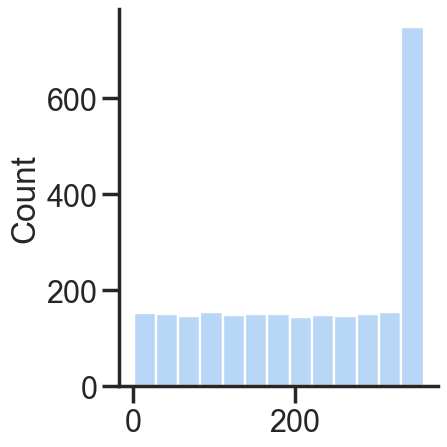

In [107]:
sns.displot(yaw)

### Validate alignment

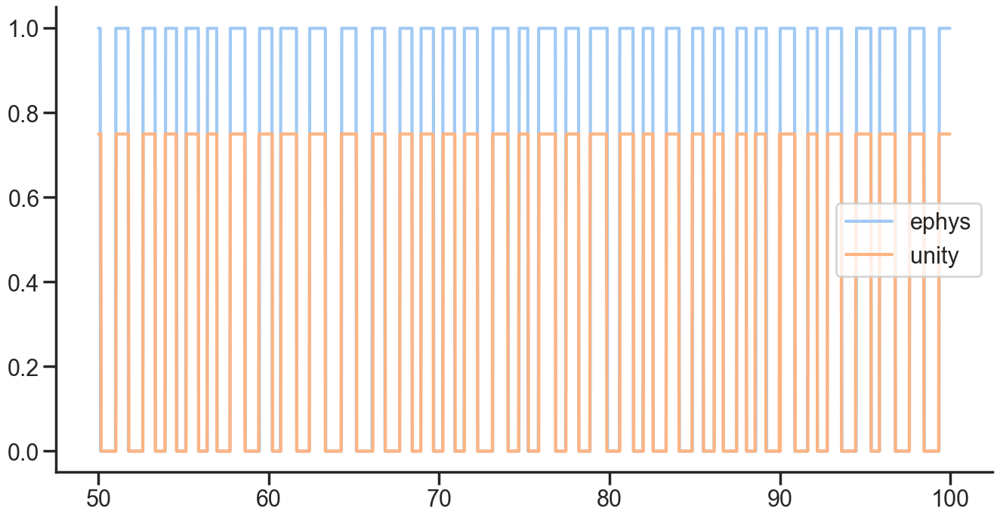

In [108]:
f, ax = plt.subplots(1, figsize = (16,8))
# first 15 s offset
y1 = ephys_ttl[start_offset + 5*50:]
y2 = df_unity_aln.TTL.values[:]

start = 50
end = 100
t = np.arange(start, end, 0.02)
plt.plot(t, y1[start*50:end*50], label = 'ephys')
plt.plot(t, y2[start*50:end*50]*0.75, label = 'unity')
plt.legend()

-1 0.4918


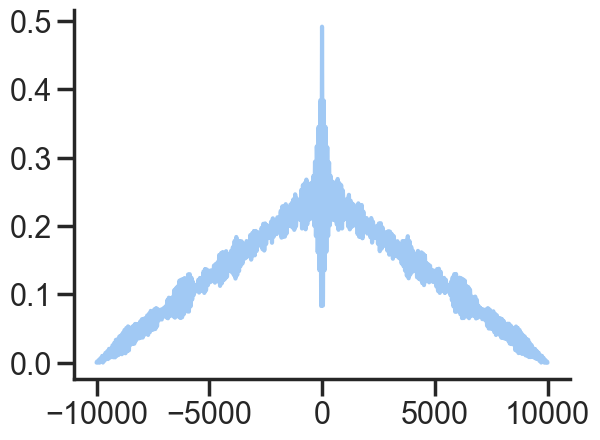

In [109]:
n_samples = 10000
start = 0
y1 = ephys_ttl[start_offset + 5*50:]
y1 = y1[start*50:start*50 + n_samples]
y2 = df_unity_aln.TTL.values[start*50:start*50 + n_samples]

lags = np.arange(-n_samples + 1, n_samples)
ccov = np.correlate(y1, y2, mode='full')
ccor = ccov / n_samples
plt.plot(lags, ccor)
shift_idx = (ccor.argmax() - n_samples)
print(shift_idx, ccor.max())

In [110]:
print(f'unity_offset {unity_offset}, start_offset {start_offset}, conc_offset {conc_offset}')

unity_offset 0, start_offset 330800, conc_offset 63568


### Remove initial offset from spikes and align with unity
start_offset -> ephys offset  
unity_ offset -> (usually 0 because we start ephys first)  
conc_offset -> start of each block

In [111]:
duration = df_unity_aln.shape[0]//50
df_spk_aln = df_spikes.copy()
# subtract start offset and block offset in sec, cross corr offset is 15 sec
df_spk_aln['spk'] = df_spk_aln['times'] - (start_offset + unity_offset + conc_offset + 5*50)/50
# removes spikes
df_spk_aln = df_spk_aln[(df_spk_aln['spk'] > 0)
                       & (df_spk_aln['spk'] < duration + 2)
                       ]

df_spk_aln.head()

,times,unit_id,templates,kslabel,spk
4527458,7892.360233,55,55,good,0.000233
4527459,7892.361167,30,30,good,0.001167
4527460,7892.362167,70,70,good,0.002167
4527461,7892.362200,64,64,good,0.002200
4527462,7892.363500,38,38,good,0.003500


In [112]:
df_spk_aln['spk'].max()

511.9993333333341

In [113]:
df_units = bin_smooth_spk(df_spk_aln, 0.02)
df_units.head()

,cids,hz,times
0,55,13.0,0.00
1,55,14.0,0.02
2,55,15.0,0.04
3,55,15.0,0.06
4,55,16.0,0.08


C:\Users\lab\AppData\Local\Temp\ipykernel_15184\163883598.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  _inp = df_units.pivot('cids', 'times', 'hz').values[:, ::10]


<AxesSubplot: >

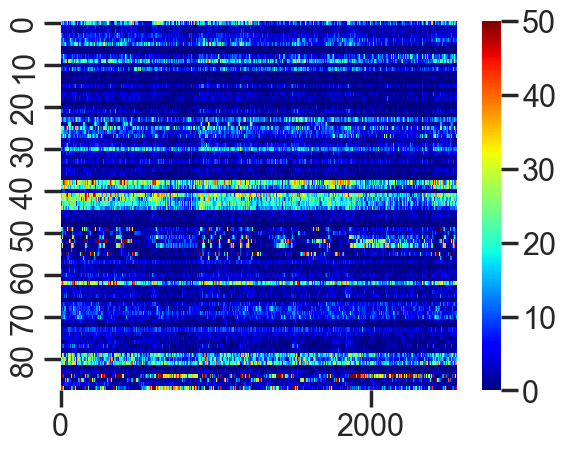

In [114]:
_inp = df_units.pivot('cids', 'times', 'hz').values[:, ::10]
sns.heatmap(_inp, vmax = 50, xticklabels = 2000, yticklabels = 10, cmap = 'jet')

### Plot HD cells

In [115]:
# light session
# yaw_light = df_dlc_light_aln.hd.values
# yaw = df_unity_aln.head_dir.values
yaw = df_unity_aln.RotY.values
ls = []
i = 0
for unit in sorted(df_units.cids.unique()):
    
#     tmp_arena = df_units_l1[df_units_l1.cids == unit].iloc[:yaw_light.size]
    tmp_vr = df_units[df_units.cids == unit].iloc[:yaw.size]
    
    try:
#         r_light, hd_tuning_light, p_val_light = bin_tuning_permute(yaw_light[:], tmp_arena.hz.values)
        r_vr, hd_tuning_vr, p_val_vr = bin_tuning_permute(yaw[:], tmp_vr.hz.values)
    except Exception as e:
        continue
        print(f'{e} error at  {unit}')
    angles = hd_tuning_vr[0]
    a = np.deg2rad(angles)

#     fr_light = hd_tuning_light[1]
    fr_vr =  hd_tuning_vr[1]
#     if fr_light.max() < 1 or fr_vr.max() < 1:
#         continue
    if p_val_vr < 0.05 and r_vr > 0.3 and fr_vr.max() > 1:
        i = i + 1
#         print (f'{i} unit # {unit} light: r {r_light:.4} p {p_val_light}')
        print (f'{i} unit # {unit} vr: r {r_vr:.4} p {p_val_vr}')
        ax = plt.subplot(111, projection='polar')
    #         ax.set_theta_zero_location("N")
    #         ax.set_theta_direction(-1)
#         fr_light = np.append(fr_light, fr_light[0])
        fr_vr = np.append(fr_vr, fr_vr[0])
        a = np.append(a, a[0])
#         ax.plot(a, fr_light, label = 'arena light', c = 'crimson')
        ax.plot(a, fr_vr, label = 'vr', c = 'darkblue')
        ls.append(unit)
        ax.legend(loc='best', bbox_to_anchor=(1.5, 0.5, 0.5, 0.5))

    #     plt.scatter(xc, yc, c = tmp_light.hz.values, cmap = 'jet', s = 10)
    #     plt.colorbar()
        plt.show()
        break
    #     except:
    #         continue


In [116]:
hd_cells = np.array(ls)
# _inp = df_units[df_units.cids.isin(arena_hd)].pivot('cids', 'times', 'hz').values[:, ::10]
_inp = df_units.pivot('cids', 'times', 'hz').values[:, ::10]

X = np.sqrt(_inp.T)
print(X.shape)
embedding = Isomap(n_neighbors = 50, n_components = 2)
tmp_emb = embedding.fit_transform(X)

C:\Users\lab\AppData\Local\Temp\ipykernel_15184\2419165887.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  _inp = df_units.pivot('cids', 'times', 'hz').values[:, ::10]


(2560, 88)


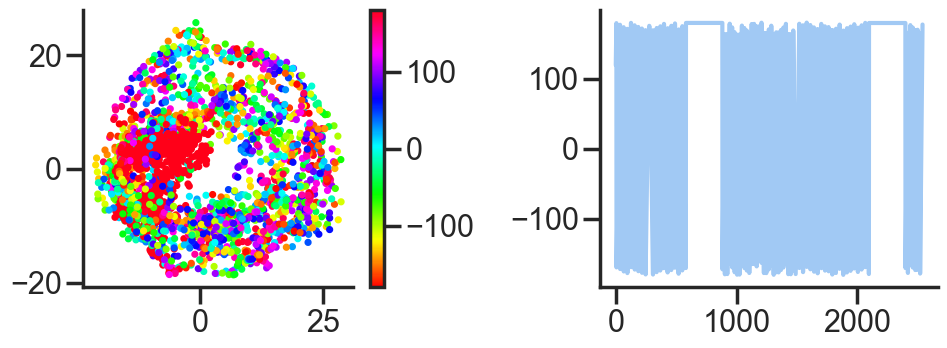

In [117]:
f, ax = plt.subplots(1, 2, figsize = (10, 4))

x = tmp_emb[:,0]
y = tmp_emb[:,1]
start, end = 0, X.shape[0] - 20
yaw2plot = yaw[::10][start:end] - 180
p = ax[0].scatter(x[start:end] , y[start:end], c = yaw2plot, s = 10, cmap = 'hsv')
#             ax[0].plot(x, y, alpha = 0.5)
f.colorbar(p)
ax[1].plot(yaw2plot)
# plt.xlim(-40, 40)
# plt.ylim(-40, 40)
plt.tight_layout()

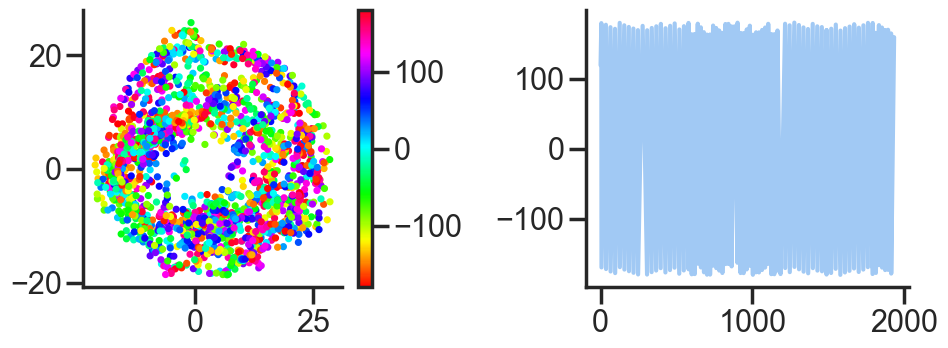

In [118]:
f, ax = plt.subplots(1, 2, figsize = (10, 4))

x = tmp_emb[:,0]
y = tmp_emb[:,1]
start, end = 0, X.shape[0] - 20
yaw2plot = yaw[::10][start:end] - 180
stat_idx = np.where(abs(np.diff(yaw2plot)) > 7)
p = ax[0].scatter(x[stat_idx] , y[stat_idx], c = yaw2plot[stat_idx], s = 10, cmap = 'hsv')
#             ax[0].plot(x, y, alpha = 0.5)
f.colorbar(p)
ax[1].plot(yaw2plot[stat_idx])
# plt.xlim(-40, 40)
# plt.ylim(-40, 40)
plt.tight_layout()


### Prepare lfp for saving

adjust the offset

In [119]:
#250 hz
lfp_start, lfp_end = round(df_spk_aln.times.min()*250 - 1), round(df_spk_aln.times.max()*250)
# 15s offset due to unity start slowly; convert 50 to 250 hz lfp
lfp_start = (start_offset + unity_offset + conc_offset + 5*50)*5 - 1
lfp_dwn.shape

(2124580, 385)

#### Align lfp with unity

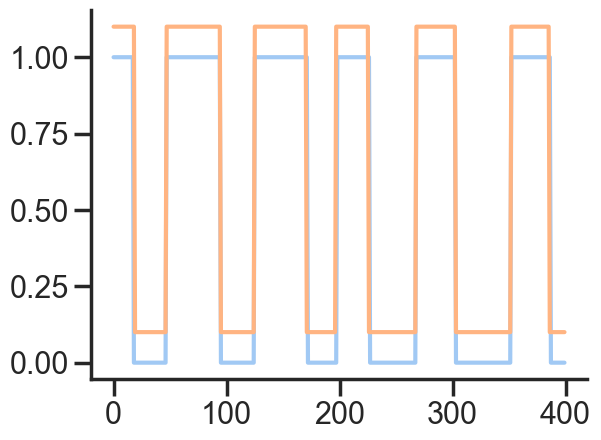

In [120]:
plt.plot(lfp_dwn[lfp_start : lfp_end, -1][::5][1500:1900]//60)
plt.plot(df_unity_aln.TTL.values[1500:1900] + 0.1)

#### For NP2.5 probes (multishank)

In [121]:
print(gain_correct)

0.762939453125


In [122]:
# adjust offset
lfp_out = lfp_dwn[lfp_start : lfp_end].copy()
# adjust the gain
# for all channels NP2.5
# gain_correct = 0.762939453125
lfp_out = lfp_out * gain_correct
print(lfp_out.shape)

(128001, 385)


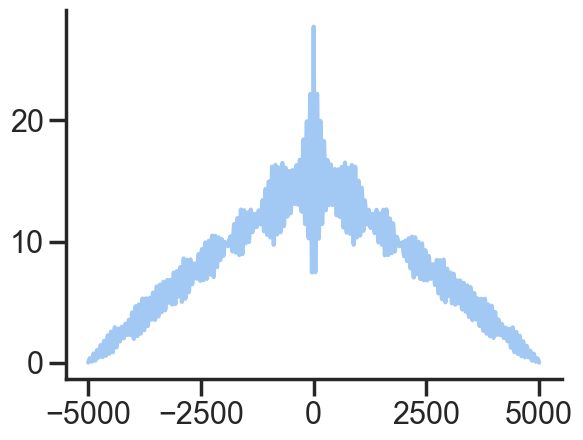

In [123]:
n_samples = 5000
start = 0

y1 = lfp_out[:, -1][::5][start:start + n_samples]
y2 = df_unity_aln.TTL.values[:n_samples]

lags = np.arange(-n_samples + 1, n_samples)
ccov = np.correlate(y1, y2, mode='full')
ccor = ccov / n_samples
plt.plot(lags, ccor)
shift_idx = (ccor.argmax() - n_samples)
# print(shift_idx, ccor.max())

In [124]:
df_spk_aln

,times,unit_id,templates,kslabel,spk
4527458,7892.360233,55,55,good,0.000233
4527459,7892.361167,30,30,good,0.001167
4527460,7892.362167,70,70,good,0.002167
4527461,7892.362200,64,64,good,0.002200
4527462,7892.363500,38,38,good,0.003500
...,...,...,...,...,...
4801074,8404.350367,62,62,mua,511.990367
4801075,8404.352467,39,39,good,511.992467
4801076,8404.352833,71,71,good,511.992833
4801077,8404.357867,9,9,good,511.997867


### Save aligned data to a file

### Prepare dict

In [70]:
def data_to_dict(df_behavior, df_spk, lfp):
    d = {}
    for col in df_behavior.columns:
        d[col] = df_behavior[col].values

    for col in cluster_info.columns:
        d[col] = cluster_info[col].values

    d['spikes'] = np.array((df_spk.unit_id.values, df_spk.spk.values))
    d['orig_spk'] = np.array((df_spk.unit_id.values, df_spk.times.values))
    d['lfp'] = lfp
    d['templates'] = templates
    d['binFullPath'] = str(binFullPath)
    d['path_unity'] = str(path_unity)
    return d

In [125]:
mdic = data_to_dict(df_unity_aln, df_spk_aln, lfp_out)

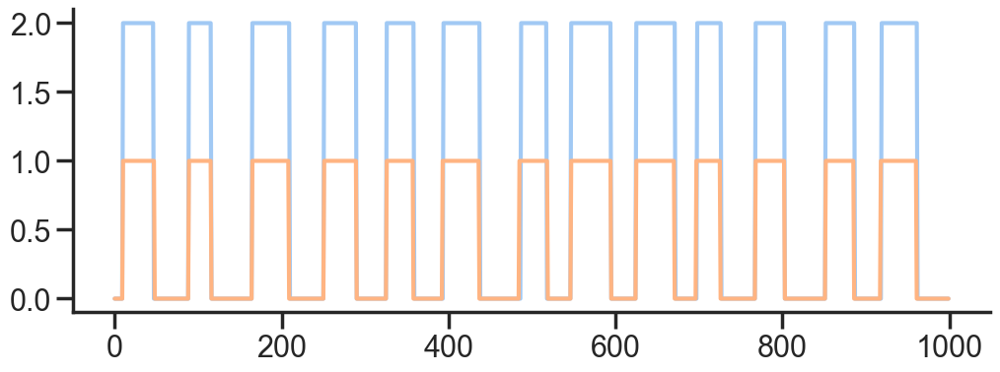

In [126]:
f, ax = plt.subplots(figsize = (12, 4))
plt.plot(mdic['lfp'][::5, -1][1000:2000]//20)
plt.plot(mdic['TTL'][1000:2000])

In [127]:
mdic.keys()
print(mdic['path_unity'])
print(mdic['binFullPath'])

x:\Data\Mice\VR\Alex\DATA_CHRONIC\ATN\JA178\09_07_22\Unity\cd_JA178_TS6-OVAR20_2022_09_07_17_14_09.csv
x:\Data\Mice\VR\Alex\DATA_CHRONIC\ATN\JA178\09_07_22\NP\20220907_JA178_rADN_yel_h2_VR1_conc.imec.lf.bin


In [128]:
savemat("20220907_JA178_rADN_yel_H2_VR1_TS6-OVAR20.mat", mdic)

'cdJA178_TS6-RPLCOMB_2022_08_18_16_01_01.csv'

### Plot spatial tuning

In [98]:
bin_size = 2.5
length_of_arena_x = 50
length_of_arena_y = 50
dt_position_ms = 20
min_dwell_distance = 5
min_dwell_time = 3
min_dwell_time_ms = min_dwell_time * dt_position_ms  # this is about 100 ms

number_of_bins_x = int(np.ceil(length_of_arena_x / bin_size))
number_of_bins_y = int(np.ceil(length_of_arena_y / bin_size))
smooth = 5 # / 100 * prm.get_pixel_ratio()

In [99]:
def gaussian_kernel(kernx):
    kerny = np.exp(np.power(kernx, 2)/2 * (-1))
    return kerny

0


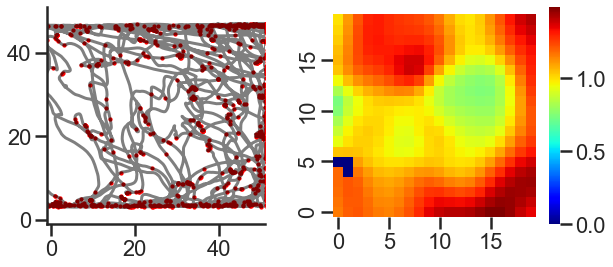

1


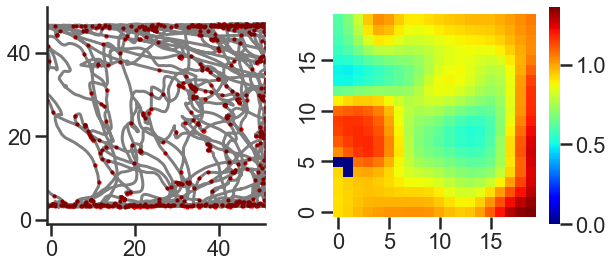

2


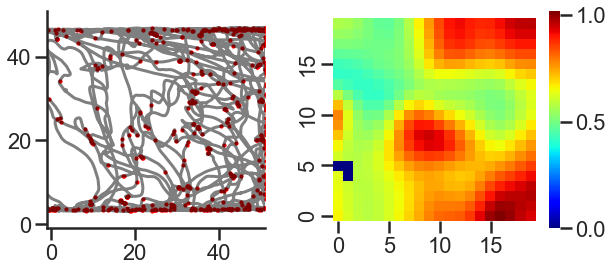

3
4


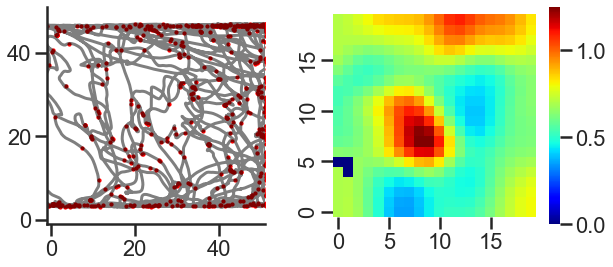

5


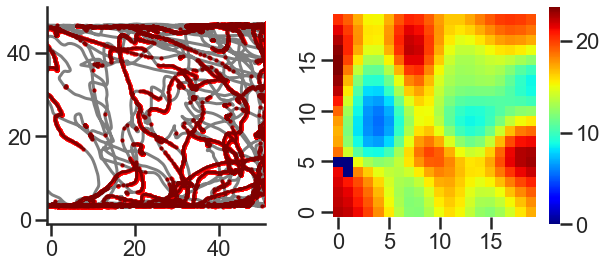

6


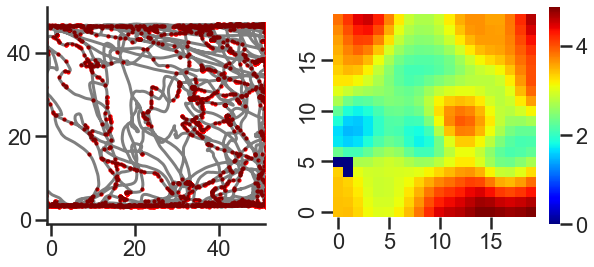

7


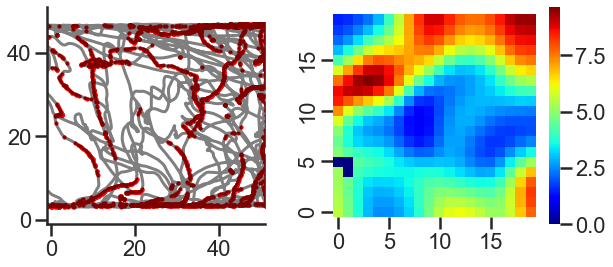

8
9


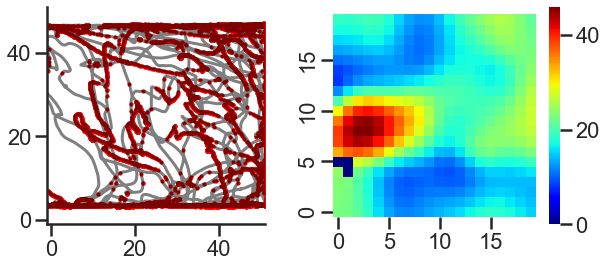

10


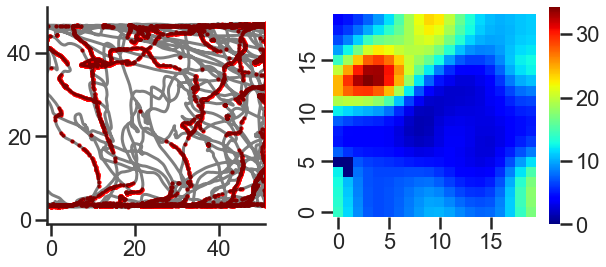

12
13


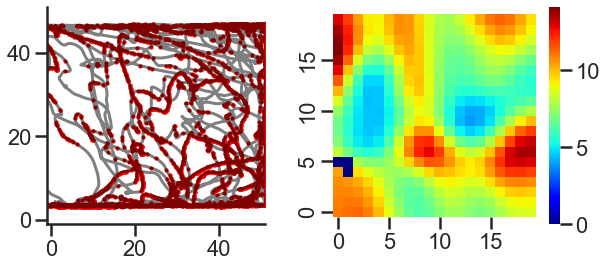

14
15
16


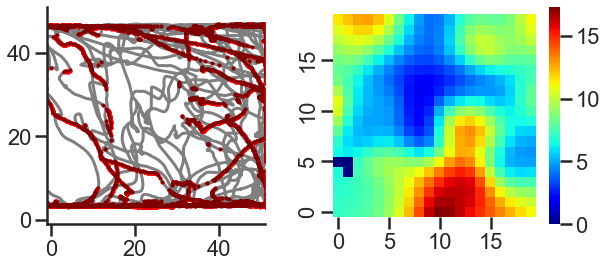

17


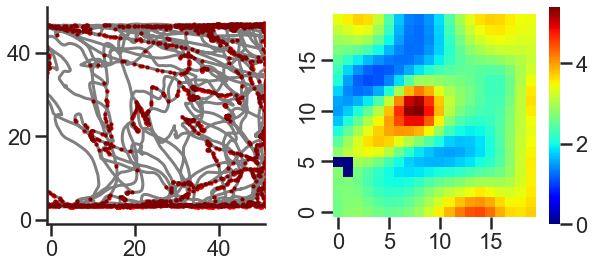

18


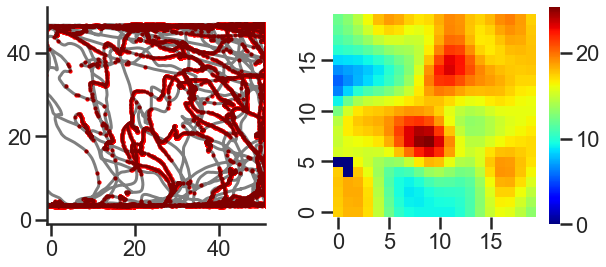

19


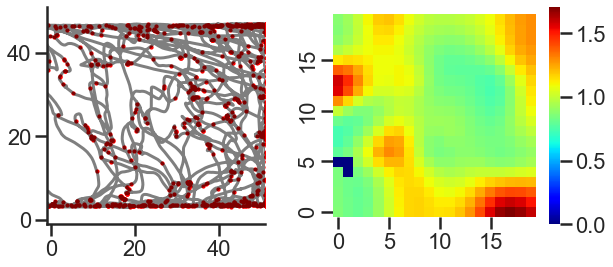

20


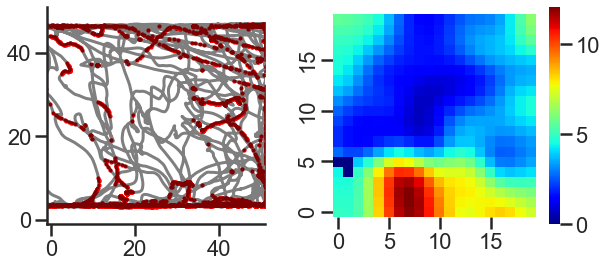

21


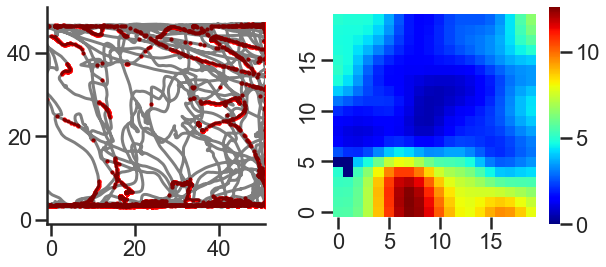

22
23


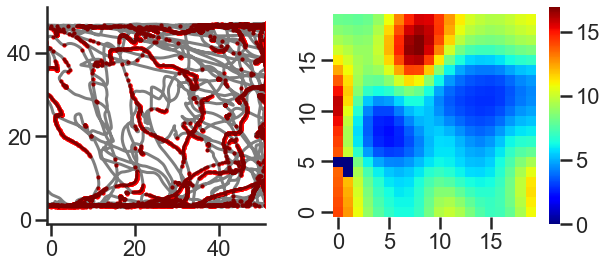

24
25


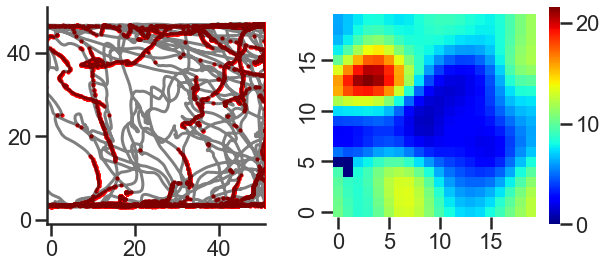

26
27


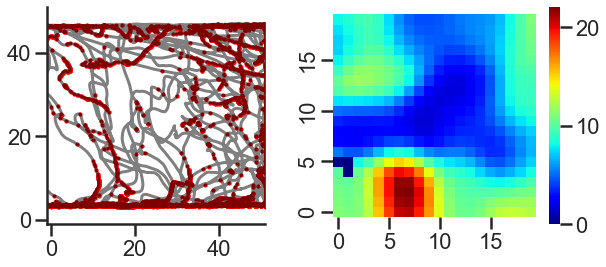

29
30


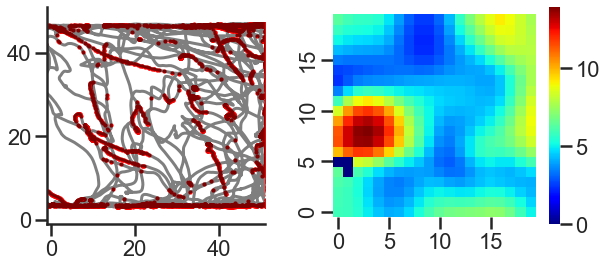

32


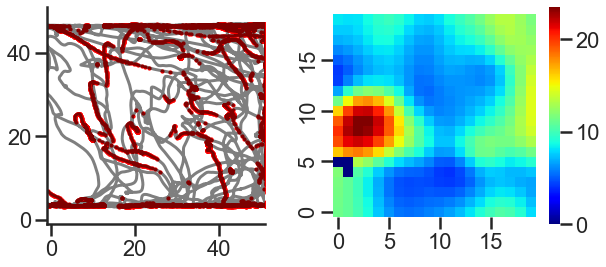

33
34
36
37
39


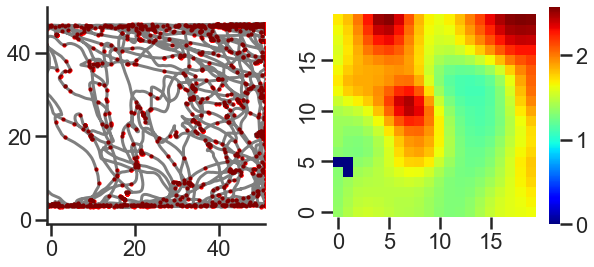

40


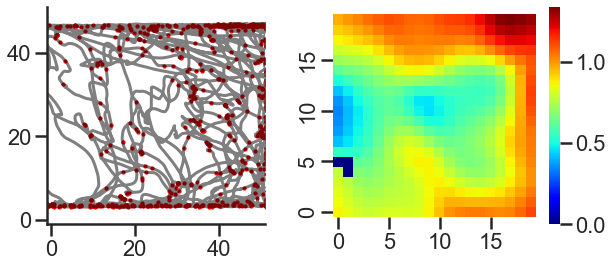

41


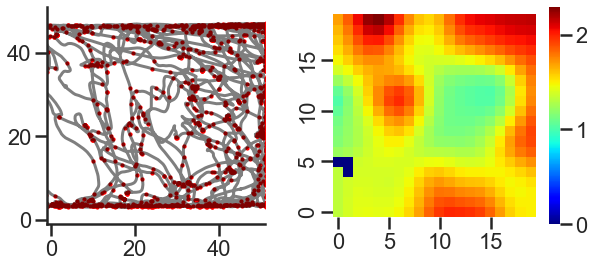

43
44


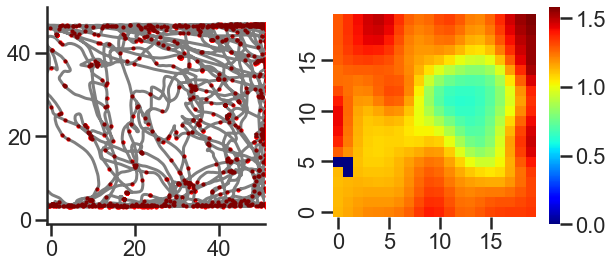

45


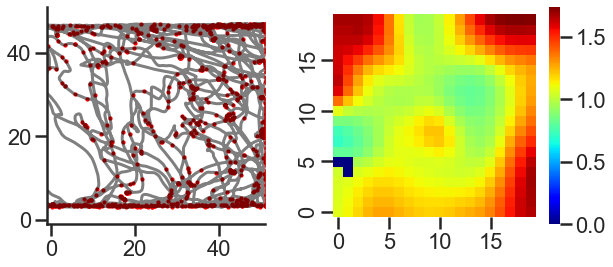

46


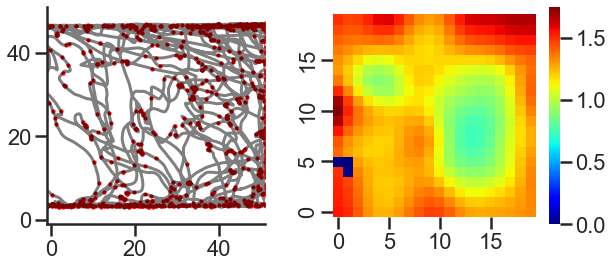

47


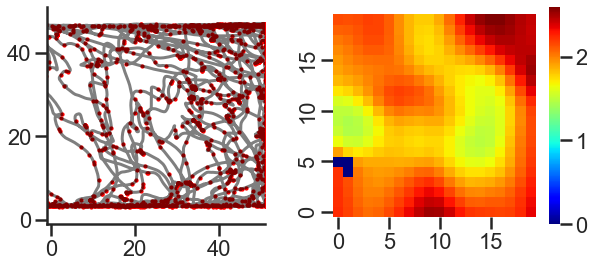

48


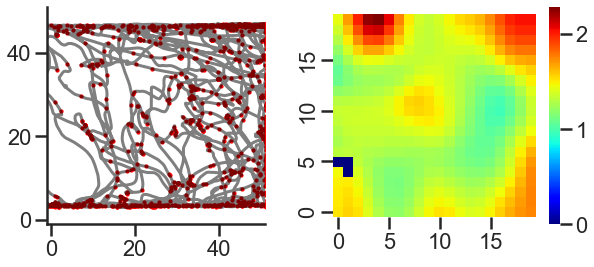

49
50


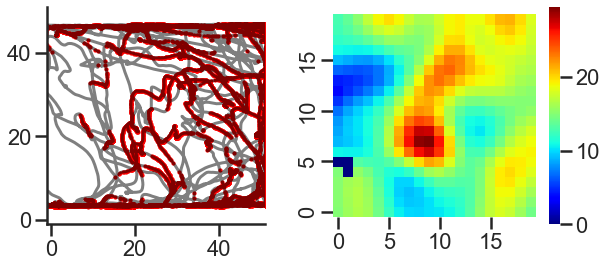

51


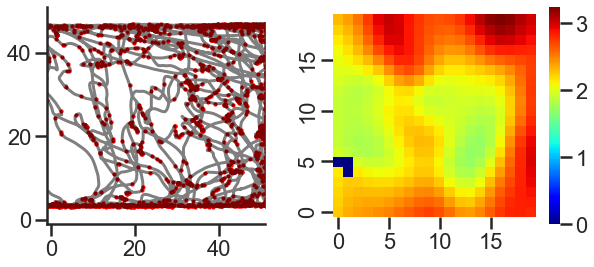

52


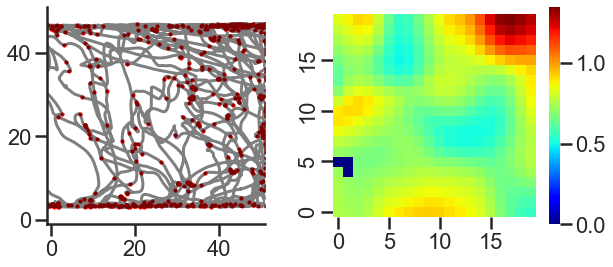

53


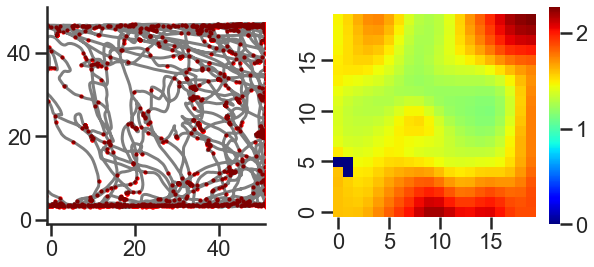

54


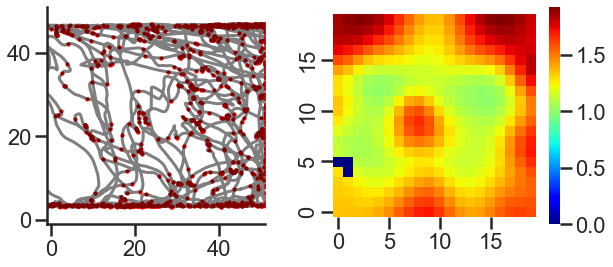

55


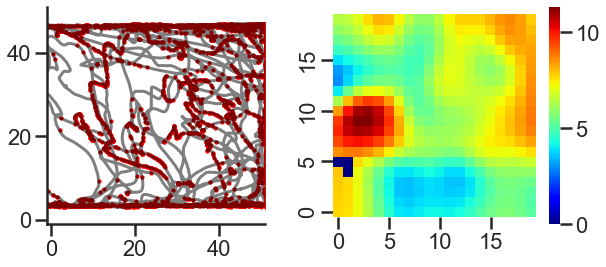

56
57
58
59


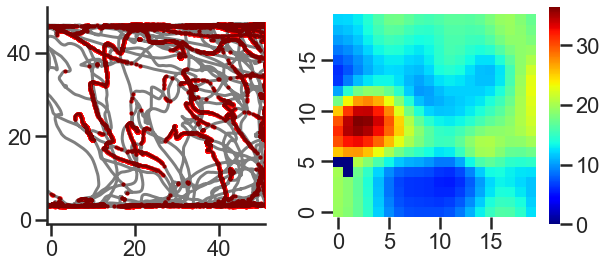

60


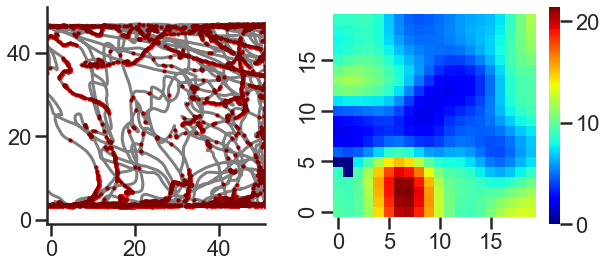

62


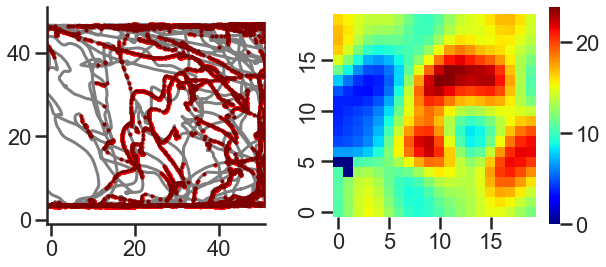

63


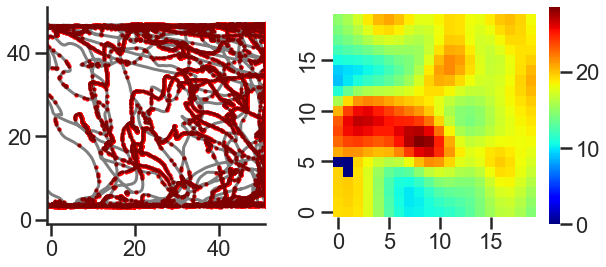

64
65
66
67


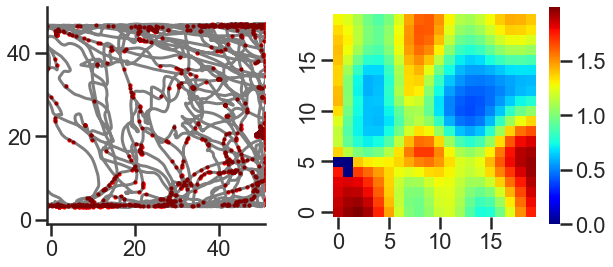

68


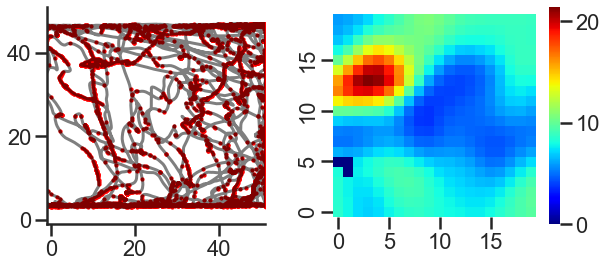

69


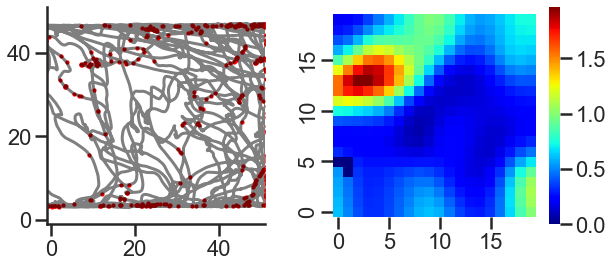

70


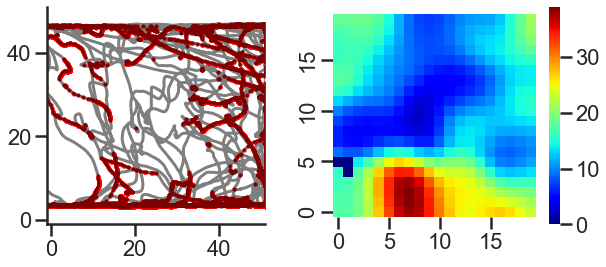

71
72


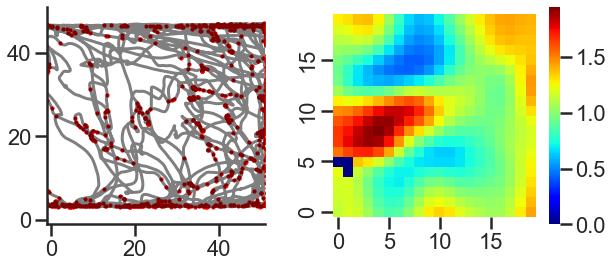

73


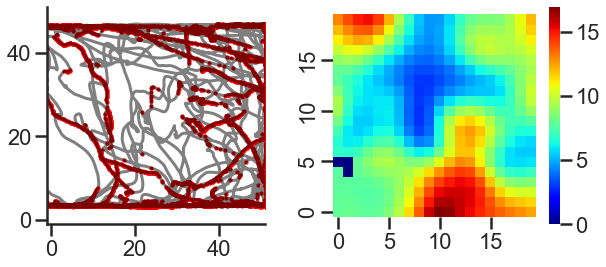

74


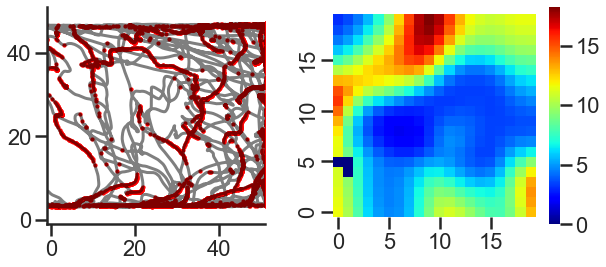

75
76


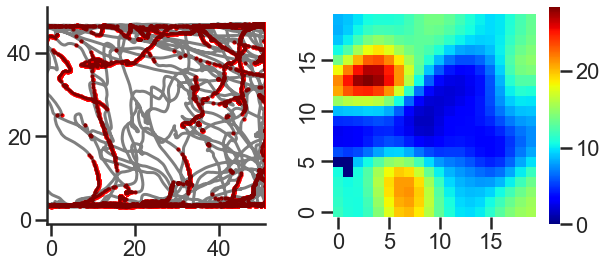

77


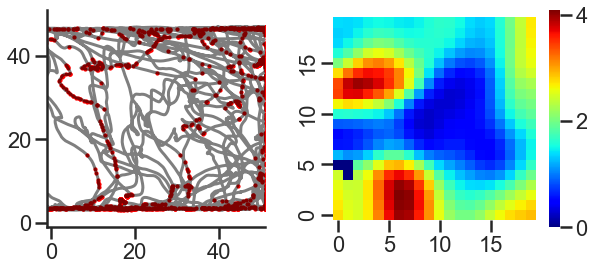

78


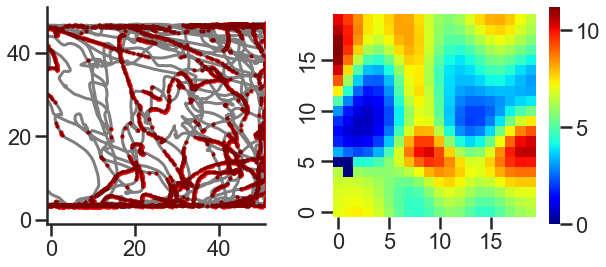

79


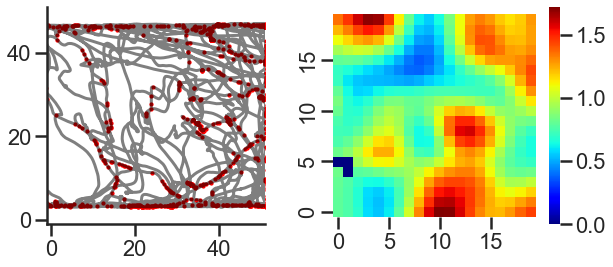

80


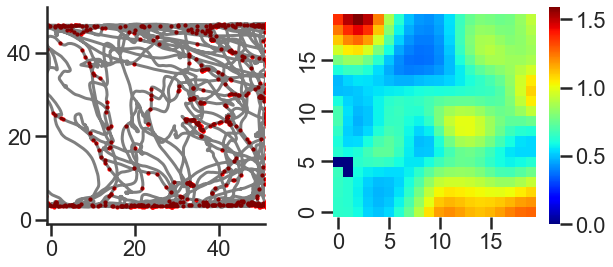

81


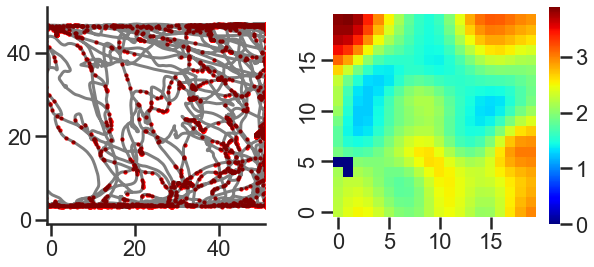

82


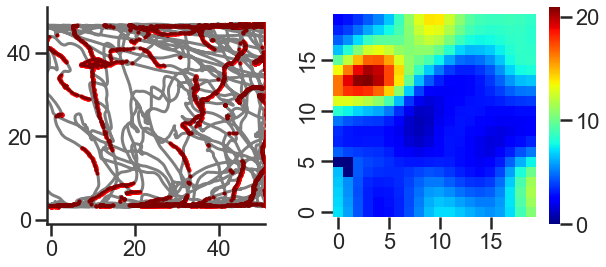

83
84


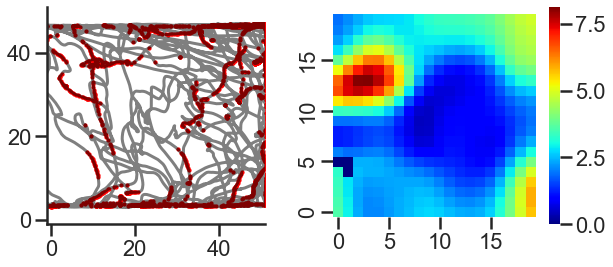

85


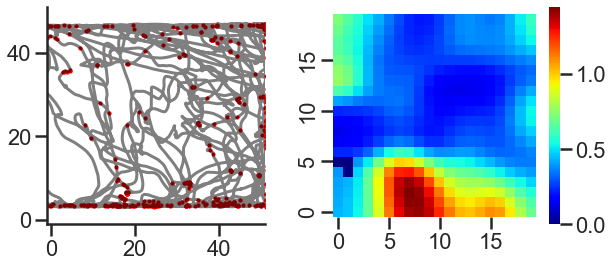

86


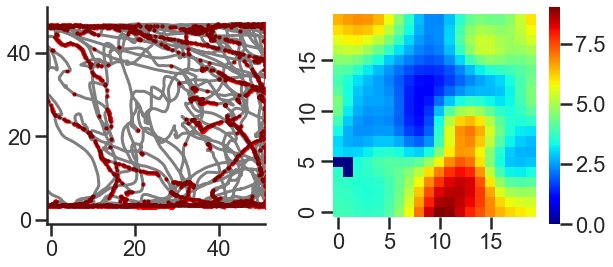

87


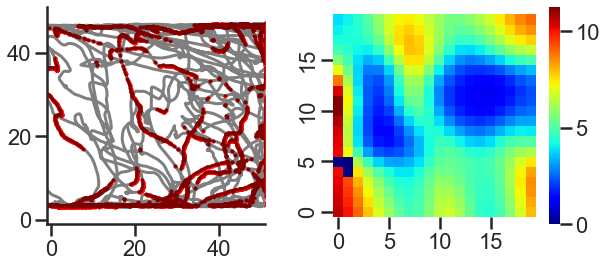

88


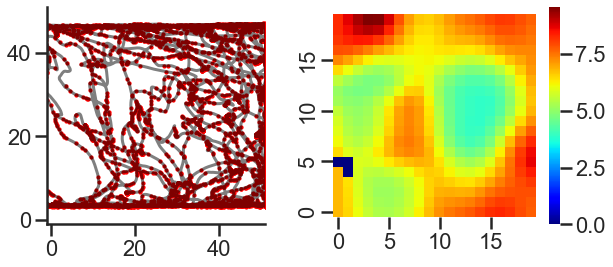

89
90
91


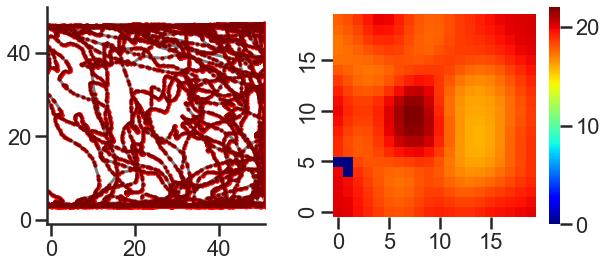

92


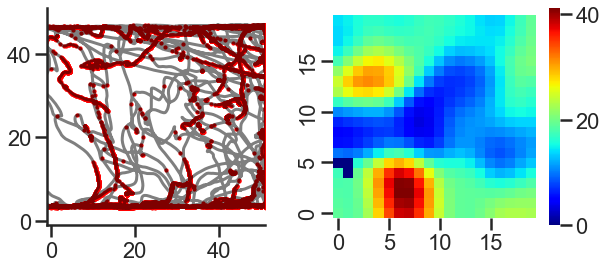

93


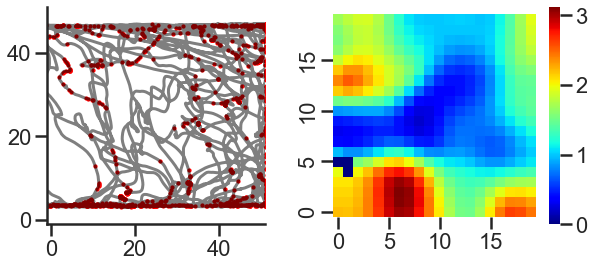

94


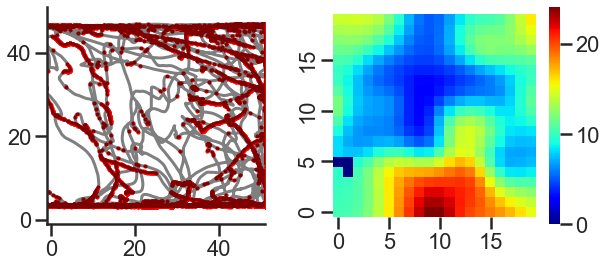

96


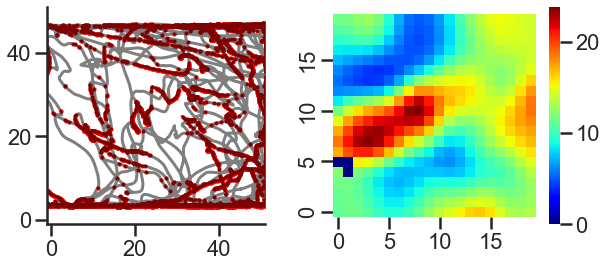

97


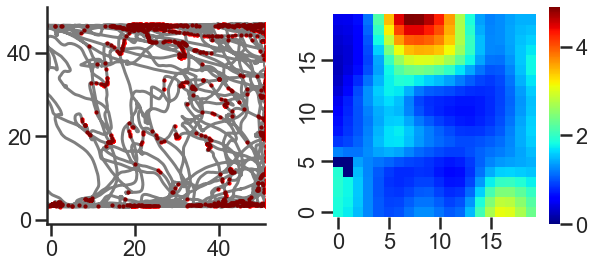

98


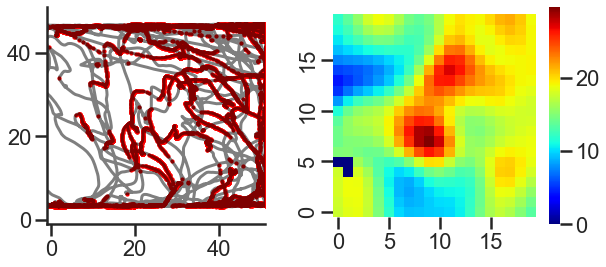

99


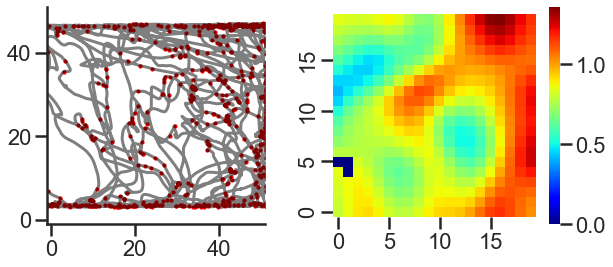

100


In [100]:
# 460 pix = 50 cm
xc = df_unity_aln.PosX.values*100 + 25
yc = df_unity_aln.PosZ.values*100 + 25

xc_cm = xc
yc_cm = yc
# invert y axis
# yc_cm = 50 - yc_cm
ls = []

for unit in sorted(df_spk_aln.unit_id.unique()[:]):
    print(unit)
    tmp_light = df_spk_aln[df_spk_aln.unit_id == unit].spk.values
    tmp_light = tmp_light[tmp_light < xc.size/50]
    # 50 Hz, convert to sample
    spk_idx = tmp_light*50
    spk_pos_x = xc_cm[spk_idx.astype(int)]
    spk_pos_y = yc_cm[spk_idx.astype(int)]
#     plt.scatter(xc[spk_idx.astype(int)], yc[spk_idx.astype(int)], c = 'r', s = 5)
    firing_rate_map = np.zeros((number_of_bins_x, number_of_bins_y))
    
    for x in range(number_of_bins_x):
        for y in range(number_of_bins_y):
            px = x * bin_size + (bin_size / 2)
            py = y * bin_size + (bin_size / 2)
            spike_distances = np.sqrt(np.power(px - spk_pos_x, 2) + np.power(py - spk_pos_y, 2))
            spike_distances = spike_distances[~np.isnan(spike_distances)]
            
            occupancy_distances = np.sqrt(np.power((px - xc_cm), 2) + np.power((py - yc_cm), 2))
            occupancy_distances = occupancy_distances[~np.isnan(occupancy_distances)]
        
            bin_occupancy = len(np.where(occupancy_distances < min_dwell_distance)[0])
            
            if bin_occupancy >= min_dwell_time:
                firing_rate_map[x, y] = sum(gaussian_kernel(spike_distances/smooth)) / (sum(gaussian_kernel(occupancy_distances/smooth)) * (dt_position_ms/1000))

            else:
                firing_rate_map[x, y] = 0
    ls.append(firing_rate_map.T)
    if firing_rate_map.max() > 1:
        f, ax = plt.subplots(1, 2, figsize = (10, 4))
        ax[0].scatter(spk_pos_x, spk_pos_y, c = 'r', s = 5)
        ax[0].plot(xc_cm, yc_cm, 'k', alpha = 0.5)
        sns.heatmap(firing_rate_map.T, vmin = 0, cmap = 'jet', ax = ax[1], square = True, xticklabels = 5, yticklabels = 5)
        ax[1].invert_yaxis()
        ax[0].set_xlim(-1, 51)
        ax[0].set_ylim(-1, 51)
        x0,x1 = ax[0].get_xlim()
        y0,y1 = ax[0].get_ylim()
        ax[0].set_aspect(abs(x1-x0)/abs(y1-y0))
#         ax[1].invert_yaxis()
        plt.show()
    
        

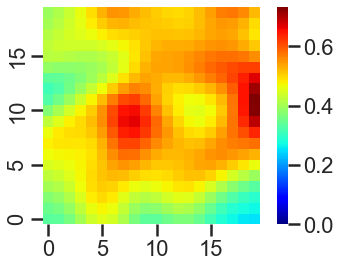

In [712]:
f, ax = plt.subplots()
sns.heatmap(firing_rate_map.T, vmin = 0, cmap = 'jet', square = True, ax = ax, xticklabels = 5, yticklabels = 5)
ax.invert_yaxis()

### Animate manifold

In [1662]:
import os

In [1179]:
24*60

1440

In [311]:
path2save = r"C:\Users\lab\Desktop\animation\ja171_rplcomb_0718"

yaw2plot = yaw[::10]
time_s = np.arange(0, tmp_emb[:yaw2plot.size,:].shape[0]/50, 0.02)
x = tmp_emb[:,0]
y = tmp_emb[:,1]
for idx in range(time_s[:].size//20):
    if not os.path.exists(path2save):
        os.mkdir(path2save)
#         idx += 200 
    f, ax = plt.subplots(1, 2, figsize = (12, 5))
    p = ax[0].scatter(x[idx*20: (idx+1)*20] , y[idx*20: (idx+1)*20], c = yaw2plot[idx*20: (idx+1)*20], 
                      s = 10, cmap = 'hsv', vmin = 0, vmax = 360)
    ax[0].plot(x[:(idx+1)*20], y[:(idx + 1)*20], alpha = 0.25, color = 'gray')
    ax[0].set_xlim(-35, 35)
    ax[0].set_ylim(-35, 35)
#         f.colorbar(p)
#         ax[0].set_xlabel('isomap d1')
#         ax[0].set_ylabel('isomap d2')
    start, end = (idx-25)*20, (idx + 25)*20
    if start < 0:
        start = 0

    ax[1].plot(time_s[:(idx+1)*20], yaw2plot[:(idx+1)*20], alpha = 0.75, color = 'darkblue')
#     ax[1].plot(time_s[:(idx+1)*20], speed[:(idx+1)*20], alpha = 0.75, color = 'orange')
#         ax[1].set_xlabel('Time (s)')
#         ax[1].set_ylabel('Az (deg)')


#         plt.tight_layout()
#         plt.show()
# ax[2].plot(speed)
#         camera.snap()
#         plt.show()
    plt.savefig(os.path.join(path2save, str(idx) + '.png'), transparent=False)
    plt.clf()
    plt.close()
plt.close('all')
    